In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
%cd /content/drive/MyDrive/cis6800/VAE-GANs-CycleGANs

/content/drive/MyDrive/cis6800/VAE-GANs-CycleGANs


In [ ]:
# ! unzip -q edges2shoes.zip
# ! unzip -q CycleGAN_support.zip
# ! unzip -q test_case.zip

In [ ]:
! unzip -q edges2shoes.zip -d /content/edges2shoes/

# CycleGAN training

In [ ]:
import torch
import pdb

D_A = torch.load('test_case/D_A.pt')
D_B = torch.load('test_case/D_B.pt')
G_BA = torch.load('test_case/G_BA.pt')
G_AB = torch.load('test_case/G_AB.pt')
valid = torch.load('test_case/valid.pt')
fake = torch.load('test_case/fake.pt')
fake_A = torch.load('test_case/fake_A.pt')
fake_B = torch.load('test_case/fake_B.pt')
real_A = torch.load('test_case/real_A.pt')
real_B = torch.load('test_case/real_B.pt')
criterion_GAN = torch.load('test_case/criterion_GAN.pt')
criterion_cycle = torch.load('test_case/criterion_cycle.pt')


def loss_discriminator(fakefG, D, real2D, valid, fake, criterion_GAN):
    '''
    loss_discriminator function is applied to compute loss for discriminator D_A and D_B,
    For example, we want to compute loss for D_A. The loss is consisted of two parts:
    D(real_A) and D(G(real_B)). We want to penalize the distance between D(real_A) part and 1 and
    distance between D(G(real_B)) part and 0.
    We will want to first compute discriminator loss given real_A and valid, which is all 1.
    Then we want to forward real_A through G_AB network to get fake image batch
    and compute discriminator loss given fake batch and fake, which is all 0.
    Finall, add up these two loss as the total discriminator loss.
    '''
    fake_data_output = D(fakefG.detach())
    real_data_output = D(real2D.detach())

    loss_D = criterion_GAN(fake_data_output, fake) + criterion_GAN(real_data_output, valid)

    return loss_D


def loss_generator(G, real2G, D, valid, criterion_GAN):
    '''
    loss_generator function is applied to compute loss for both generator G_AB and G_BA:
    For example, we want to compute the loss for G_AB.
    real2G will be the real image in domain A, then we map real2G into domain B to get fake B,
    then we compute the loss between D_B(fake_B) and valid, which is all 1.
    The fake_B image will also be one of the outputs, since we want to use it in the loss_cycle_consis.
    '''
    generated_fake_image = G(real2G)
    discriminator_output  = D(generated_fake_image)

    generator_loss = criterion_GAN(discriminator_output, valid)

    return generator_loss, generated_fake_image



def loss_cycle_consis(G, fakefG, real, criterion_cycle):
    '''
    loss_cycle_consis function is applied to both cycle consistency loss:
    between recovered A and original A,
    between recovered B and original B.
    For example, we want to compute the cycle consistency loss between recovered A and original A.
    fake2G will be the generated image in domain B, then we map fake2G back into domain A to get recovered A,
    then we compute the loss between recovered A and original A
    '''
    recovered_image  = G(fakefG)
    loss_cycle = criterion_cycle(recovered_image, real)

    return loss_cycle

# test case

test_loss_GAN_AB = torch.load('test_case/loss_GAN_AB.pt')
test_loss_cycle_A = torch.load('test_case/loss_cycle_A.pt')
test_loss_D_A = torch.load('test_case/loss_D_A.pt')
loss_GAN_AB, fake_B = loss_generator(G_AB, real_A, D_B, valid, criterion_GAN)
loss_cycle_A = loss_cycle_consis(G_BA, fake_B, real_A, criterion_cycle)
loss_D_A = loss_discriminator(fake_A, D_A, real_A, valid, fake, criterion_GAN)


print('test case loss_D_A:', test_loss_D_A.item())
print('computed loss_D_A:', loss_D_A.item())

print('test case test_loss_GAN_AB:', test_loss_GAN_AB.item())
print('computed test_loss_GAN_AB:', loss_GAN_AB.item())

print('test case loss_cycle_A:', test_loss_cycle_A.item())
print('computed loss_cycle_A:', loss_cycle_A.item())

test case loss_D_A: 3.1760239601135254
computed loss_D_A: 3.176025390625
test case test_loss_GAN_AB: 3.164881467819214
computed test_loss_GAN_AB: 3.164875030517578
test case loss_cycle_A: 0.6627261638641357
computed loss_cycle_A: 0.6627261638641357


the length of training data: 49825


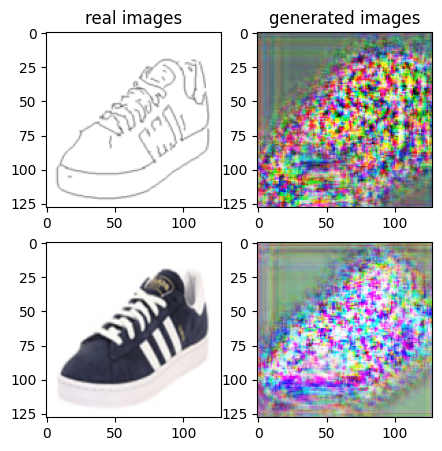

Train Epoch: 1 0% 	Total Loss: 9.861628 	Loss_G_AB: 1.957351	Loss_G_BA: 1.644431	Loss_cycle: 4.247859	Loss_D_A: 1.361652	Loss_D_B: 2.451226
0 9 T:  2.5067458152770996
Train Epoch: 1 0% 	Total Loss: 5.317262 	Loss_G_AB: 1.265965	Loss_G_BA: 0.903036	Loss_cycle: 2.282411	Loss_D_A: 0.907635	Loss_D_B: 1.042715
0 19 T:  0.9377701282501221
Train Epoch: 1 0% 	Total Loss: 4.164302 	Loss_G_AB: 1.016467	Loss_G_BA: 0.933490	Loss_cycle: 1.944387	Loss_D_A: 0.567781	Loss_D_B: 0.677156
0 29 T:  0.9672112464904785
Train Epoch: 1 0% 	Total Loss: 3.904555 	Loss_G_AB: 0.903043	Loss_G_BA: 0.898468	Loss_cycle: 1.945123	Loss_D_A: 0.465141	Loss_D_B: 0.593535
0 39 T:  0.9449610710144043
Train Epoch: 1 0% 	Total Loss: 3.065165 	Loss_G_AB: 0.734495	Loss_G_BA: 0.694441	Loss_cycle: 1.500308	Loss_D_A: 0.447212	Loss_D_B: 0.403177
0 49 T:  0.9716892242431641
Train Epoch: 1 0% 	Total Loss: 2.665424 	Loss_G_AB: 0.610639	Loss_G_BA: 0.765460	Loss_cycle: 1.355440	Loss_D_A: 0.277287	Loss_D_B: 0.344648
0 59 T:  0.9834890365

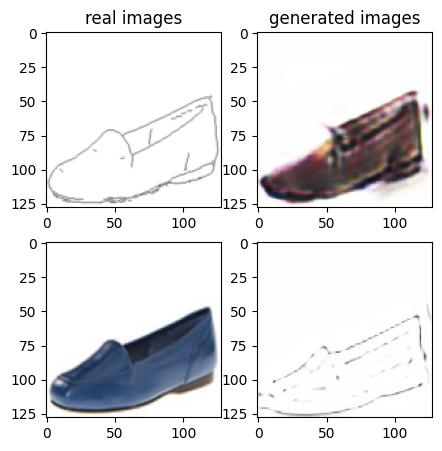

Train Epoch: 1 2% 	Total Loss: 1.966615 	Loss_G_AB: 0.376215	Loss_G_BA: 0.877339	Loss_cycle: 1.052444	Loss_D_A: 0.053148	Loss_D_B: 0.234247
0 1009 T:  2.2676053047180176
Train Epoch: 1 2% 	Total Loss: 1.900139 	Loss_G_AB: 0.376509	Loss_G_BA: 0.827678	Loss_cycle: 0.968711	Loss_D_A: 0.091911	Loss_D_B: 0.237424
0 1019 T:  0.9793124198913574
Train Epoch: 1 2% 	Total Loss: 1.861564 	Loss_G_AB: 0.382941	Loss_G_BA: 0.803157	Loss_cycle: 0.965995	Loss_D_A: 0.067228	Loss_D_B: 0.235293
0 1029 T:  0.9738764762878418
Train Epoch: 1 2% 	Total Loss: 1.999324 	Loss_G_AB: 0.462543	Loss_G_BA: 0.857458	Loss_cycle: 0.929531	Loss_D_A: 0.102574	Loss_D_B: 0.307219
0 1039 T:  0.9709594249725342
Train Epoch: 1 2% 	Total Loss: 2.020463 	Loss_G_AB: 0.415798	Loss_G_BA: 0.870020	Loss_cycle: 0.966407	Loss_D_A: 0.113156	Loss_D_B: 0.297991
0 1049 T:  0.9783999919891357
Train Epoch: 1 2% 	Total Loss: 1.832646 	Loss_G_AB: 0.379925	Loss_G_BA: 0.759256	Loss_cycle: 0.909388	Loss_D_A: 0.070981	Loss_D_B: 0.282686
0 1059 T: 

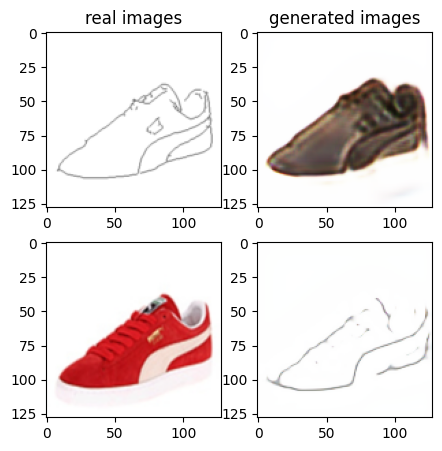

Train Epoch: 1 4% 	Total Loss: 1.663247 	Loss_G_AB: 0.295179	Loss_G_BA: 0.818733	Loss_cycle: 0.768480	Loss_D_A: 0.061587	Loss_D_B: 0.276223
0 2009 T:  1.9557459354400635
Train Epoch: 1 4% 	Total Loss: 1.888654 	Loss_G_AB: 0.399030	Loss_G_BA: 0.901080	Loss_cycle: 0.899744	Loss_D_A: 0.074045	Loss_D_B: 0.264810
0 2019 T:  0.973015546798706
Train Epoch: 1 4% 	Total Loss: 1.718282 	Loss_G_AB: 0.327108	Loss_G_BA: 0.828215	Loss_cycle: 0.791217	Loss_D_A: 0.060352	Loss_D_B: 0.289052
0 2029 T:  0.9758615493774414
Train Epoch: 1 4% 	Total Loss: 1.797133 	Loss_G_AB: 0.356860	Loss_G_BA: 0.957180	Loss_cycle: 0.829596	Loss_D_A: 0.035309	Loss_D_B: 0.275208
0 2039 T:  0.9917311668395996
Train Epoch: 1 4% 	Total Loss: 1.692892 	Loss_G_AB: 0.356273	Loss_G_BA: 0.918456	Loss_cycle: 0.781298	Loss_D_A: 0.039254	Loss_D_B: 0.234975
0 2049 T:  1.0757596492767334
Train Epoch: 1 4% 	Total Loss: 2.064840 	Loss_G_AB: 0.421213	Loss_G_BA: 0.928298	Loss_cycle: 1.114518	Loss_D_A: 0.054513	Loss_D_B: 0.221053
0 2059 T:  

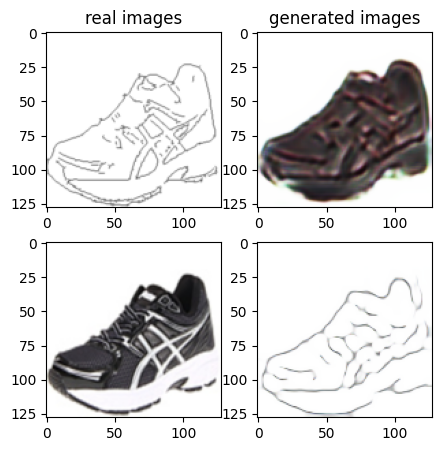

Train Epoch: 1 6% 	Total Loss: 1.839527 	Loss_G_AB: 0.393683	Loss_G_BA: 0.702190	Loss_cycle: 0.896329	Loss_D_A: 0.098328	Loss_D_B: 0.296933
0 3009 T:  2.447967290878296
Train Epoch: 1 6% 	Total Loss: 1.596568 	Loss_G_AB: 0.314625	Loss_G_BA: 0.809715	Loss_cycle: 0.703755	Loss_D_A: 0.106293	Loss_D_B: 0.224350
0 3019 T:  1.015641689300537
Train Epoch: 1 6% 	Total Loss: 1.760728 	Loss_G_AB: 0.313180	Loss_G_BA: 0.714762	Loss_cycle: 0.878024	Loss_D_A: 0.132065	Loss_D_B: 0.236667
0 3029 T:  1.0288405418395996
Train Epoch: 1 6% 	Total Loss: 1.720682 	Loss_G_AB: 0.374497	Loss_G_BA: 0.758913	Loss_cycle: 0.832852	Loss_D_A: 0.082387	Loss_D_B: 0.238738
0 3039 T:  0.9775416851043701
Train Epoch: 1 6% 	Total Loss: 1.882780 	Loss_G_AB: 0.349516	Loss_G_BA: 0.784576	Loss_cycle: 0.847997	Loss_D_A: 0.141109	Loss_D_B: 0.326628
0 3049 T:  0.9867649078369141
Train Epoch: 1 6% 	Total Loss: 2.174350 	Loss_G_AB: 0.409717	Loss_G_BA: 0.829341	Loss_cycle: 1.143364	Loss_D_A: 0.110334	Loss_D_B: 0.301124
0 3059 T:  0

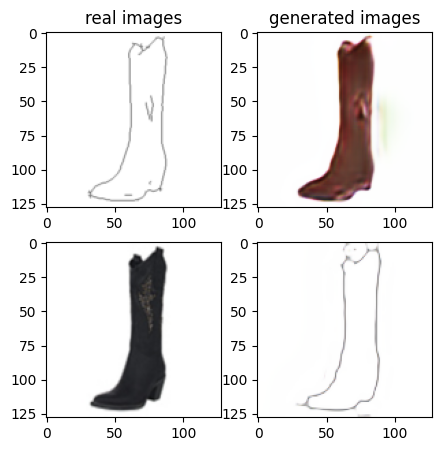

Train Epoch: 1 8% 	Total Loss: 1.613190 	Loss_G_AB: 0.304399	Loss_G_BA: 0.793238	Loss_cycle: 0.677192	Loss_D_A: 0.111422	Loss_D_B: 0.275757
0 4009 T:  1.947232723236084
Train Epoch: 1 8% 	Total Loss: 1.432121 	Loss_G_AB: 0.290612	Loss_G_BA: 0.611973	Loss_cycle: 0.629689	Loss_D_A: 0.107527	Loss_D_B: 0.243613
0 4019 T:  0.9822657108306885
Train Epoch: 1 8% 	Total Loss: 1.641912 	Loss_G_AB: 0.280365	Loss_G_BA: 0.885116	Loss_cycle: 0.721231	Loss_D_A: 0.079982	Loss_D_B: 0.257958
0 4029 T:  0.9790084362030029
Train Epoch: 1 8% 	Total Loss: 1.583356 	Loss_G_AB: 0.314491	Loss_G_BA: 0.749277	Loss_cycle: 0.661535	Loss_D_A: 0.139067	Loss_D_B: 0.250870
0 4039 T:  0.9832592010498047
Train Epoch: 1 8% 	Total Loss: 1.640348 	Loss_G_AB: 0.313128	Loss_G_BA: 0.701872	Loss_cycle: 0.796468	Loss_D_A: 0.083421	Loss_D_B: 0.252959
0 4049 T:  1.0032453536987305
Train Epoch: 1 8% 	Total Loss: 1.548883 	Loss_G_AB: 0.325010	Loss_G_BA: 0.846436	Loss_cycle: 0.619005	Loss_D_A: 0.087371	Loss_D_B: 0.256784
0 4059 T:  

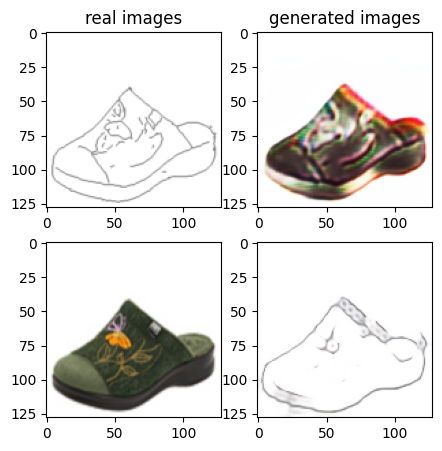

Train Epoch: 1 10% 	Total Loss: 1.626169 	Loss_G_AB: 0.315334	Loss_G_BA: 1.005370	Loss_cycle: 0.680708	Loss_D_A: 0.024600	Loss_D_B: 0.260508
0 5009 T:  1.9535071849822998
Train Epoch: 1 10% 	Total Loss: 1.444279 	Loss_G_AB: 0.320054	Loss_G_BA: 0.716923	Loss_cycle: 0.588426	Loss_D_A: 0.080897	Loss_D_B: 0.256467
0 5019 T:  0.9865267276763916
Train Epoch: 1 10% 	Total Loss: 1.623075 	Loss_G_AB: 0.386625	Loss_G_BA: 0.767819	Loss_cycle: 0.731544	Loss_D_A: 0.051337	Loss_D_B: 0.262972
0 5029 T:  0.9826791286468506
Train Epoch: 1 10% 	Total Loss: 1.553059 	Loss_G_AB: 0.322257	Loss_G_BA: 0.905427	Loss_cycle: 0.634642	Loss_D_A: 0.050979	Loss_D_B: 0.253596
0 5039 T:  0.9754838943481445
Train Epoch: 1 10% 	Total Loss: 1.694461 	Loss_G_AB: 0.285545	Loss_G_BA: 0.980113	Loss_cycle: 0.779415	Loss_D_A: 0.017540	Loss_D_B: 0.264676
0 5049 T:  1.0130250453948975
Train Epoch: 1 10% 	Total Loss: 1.694321 	Loss_G_AB: 0.283814	Loss_G_BA: 0.987498	Loss_cycle: 0.766534	Loss_D_A: 0.021109	Loss_D_B: 0.271022
0 50

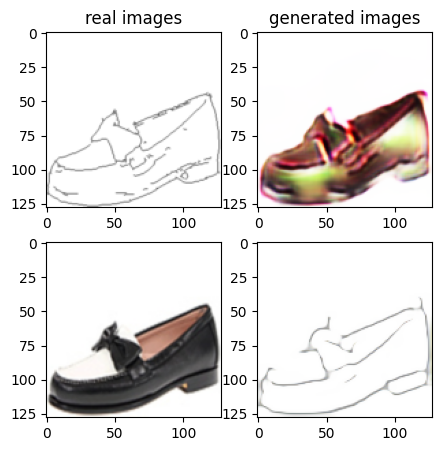

Train Epoch: 1 12% 	Total Loss: 1.659223 	Loss_G_AB: 0.275320	Loss_G_BA: 0.957711	Loss_cycle: 0.724759	Loss_D_A: 0.024506	Loss_D_B: 0.293442
0 6009 T:  1.9188783168792725
Train Epoch: 1 12% 	Total Loss: 1.660868 	Loss_G_AB: 0.281430	Loss_G_BA: 0.965503	Loss_cycle: 0.705137	Loss_D_A: 0.040725	Loss_D_B: 0.291540
0 6019 T:  1.0036084651947021
Train Epoch: 1 12% 	Total Loss: 1.622240 	Loss_G_AB: 0.297310	Loss_G_BA: 0.776854	Loss_cycle: 0.809866	Loss_D_A: 0.043229	Loss_D_B: 0.232063
0 6029 T:  1.0127902030944824
Train Epoch: 1 12% 	Total Loss: 1.719610 	Loss_G_AB: 0.281118	Loss_G_BA: 1.086912	Loss_cycle: 0.778417	Loss_D_A: 0.015200	Loss_D_B: 0.241978
0 6039 T:  1.0086290836334229
Train Epoch: 1 12% 	Total Loss: 1.590073 	Loss_G_AB: 0.308702	Loss_G_BA: 0.954040	Loss_cycle: 0.651419	Loss_D_A: 0.027714	Loss_D_B: 0.279569
0 6049 T:  1.047947883605957
Train Epoch: 1 12% 	Total Loss: 1.535027 	Loss_G_AB: 0.321683	Loss_G_BA: 0.942597	Loss_cycle: 0.637365	Loss_D_A: 0.023551	Loss_D_B: 0.241970
0 605

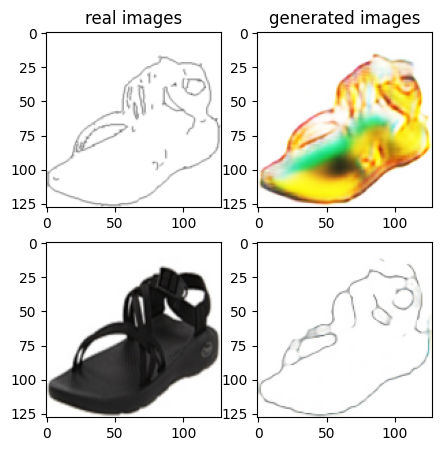

Train Epoch: 1 14% 	Total Loss: 1.544726 	Loss_G_AB: 0.269483	Loss_G_BA: 0.909126	Loss_cycle: 0.672976	Loss_D_A: 0.036273	Loss_D_B: 0.246172
0 7009 T:  2.202213764190674
Train Epoch: 1 14% 	Total Loss: 1.542455 	Loss_G_AB: 0.266410	Loss_G_BA: 0.854153	Loss_cycle: 0.683993	Loss_D_A: 0.041302	Loss_D_B: 0.256878
0 7019 T:  0.9797961711883545
Train Epoch: 1 14% 	Total Loss: 1.425809 	Loss_G_AB: 0.269364	Loss_G_BA: 0.837059	Loss_cycle: 0.556235	Loss_D_A: 0.061928	Loss_D_B: 0.254434
0 7029 T:  0.9748423099517822
Train Epoch: 1 14% 	Total Loss: 1.521498 	Loss_G_AB: 0.269761	Loss_G_BA: 0.966662	Loss_cycle: 0.590663	Loss_D_A: 0.062141	Loss_D_B: 0.250482
0 7039 T:  0.974337100982666
Train Epoch: 1 14% 	Total Loss: 1.450867 	Loss_G_AB: 0.271640	Loss_G_BA: 0.861442	Loss_cycle: 0.590870	Loss_D_A: 0.048943	Loss_D_B: 0.244513
0 7049 T:  0.9737997055053711
Train Epoch: 1 14% 	Total Loss: 1.523909 	Loss_G_AB: 0.267396	Loss_G_BA: 0.941476	Loss_cycle: 0.646542	Loss_D_A: 0.024648	Loss_D_B: 0.248283
0 7059

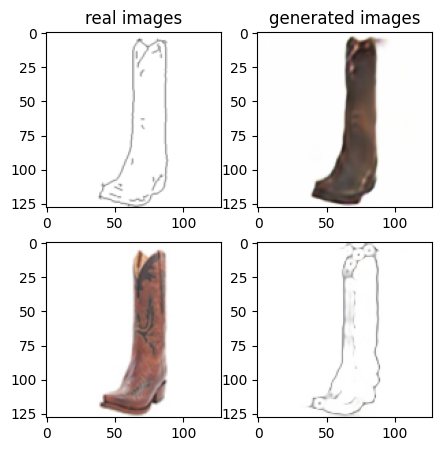

Train Epoch: 1 16% 	Total Loss: 1.549196 	Loss_G_AB: 0.340353	Loss_G_BA: 0.744035	Loss_cycle: 0.581727	Loss_D_A: 0.135480	Loss_D_B: 0.289795
0 8009 T:  2.505739212036133
Train Epoch: 1 16% 	Total Loss: 1.571043 	Loss_G_AB: 0.284324	Loss_G_BA: 0.651477	Loss_cycle: 0.662838	Loss_D_A: 0.152643	Loss_D_B: 0.287662
0 8019 T:  1.109323263168335
Train Epoch: 1 16% 	Total Loss: 1.566597 	Loss_G_AB: 0.290888	Loss_G_BA: 0.657720	Loss_cycle: 0.736975	Loss_D_A: 0.097095	Loss_D_B: 0.258223
0 8029 T:  1.3942265510559082
Train Epoch: 1 16% 	Total Loss: 1.532472 	Loss_G_AB: 0.285377	Loss_G_BA: 0.882699	Loss_cycle: 0.658963	Loss_D_A: 0.052853	Loss_D_B: 0.236618
0 8039 T:  1.401892900466919
Train Epoch: 1 16% 	Total Loss: 1.461493 	Loss_G_AB: 0.321999	Loss_G_BA: 0.947214	Loss_cycle: 0.552567	Loss_D_A: 0.038398	Loss_D_B: 0.235920
0 8049 T:  1.1105847358703613
Train Epoch: 1 16% 	Total Loss: 1.518413 	Loss_G_AB: 0.316500	Loss_G_BA: 0.889885	Loss_cycle: 0.619145	Loss_D_A: 0.047250	Loss_D_B: 0.248825
0 8059 

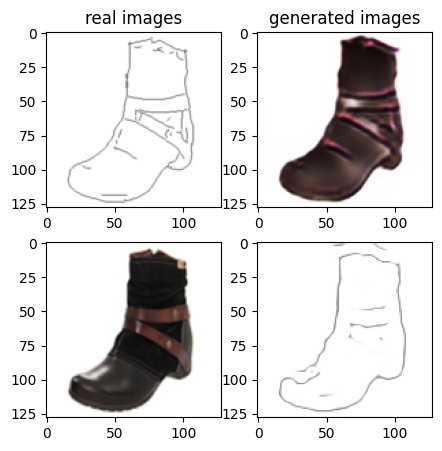

Train Epoch: 1 18% 	Total Loss: 1.620430 	Loss_G_AB: 0.318042	Loss_G_BA: 0.907870	Loss_cycle: 0.709506	Loss_D_A: 0.029922	Loss_D_B: 0.268045
0 9009 T:  2.760960817337036
Train Epoch: 1 18% 	Total Loss: 1.620922 	Loss_G_AB: 0.335124	Loss_G_BA: 0.996022	Loss_cycle: 0.673182	Loss_D_A: 0.015952	Loss_D_B: 0.266214
0 9019 T:  1.0566644668579102
Train Epoch: 1 18% 	Total Loss: 1.605495 	Loss_G_AB: 0.399138	Loss_G_BA: 1.012005	Loss_cycle: 0.617594	Loss_D_A: 0.008325	Loss_D_B: 0.274004
0 9029 T:  0.975846529006958
Train Epoch: 1 18% 	Total Loss: 1.649527 	Loss_G_AB: 0.366354	Loss_G_BA: 1.036938	Loss_cycle: 0.676003	Loss_D_A: 0.007182	Loss_D_B: 0.264695
0 9039 T:  0.9765408039093018
Train Epoch: 1 18% 	Total Loss: 1.473470 	Loss_G_AB: 0.323814	Loss_G_BA: 0.973588	Loss_cycle: 0.504066	Loss_D_A: 0.008835	Loss_D_B: 0.311868
0 9049 T:  0.9749996662139893
Train Epoch: 1 18% 	Total Loss: 1.522773 	Loss_G_AB: 0.342425	Loss_G_BA: 0.994669	Loss_cycle: 0.585590	Loss_D_A: 0.008196	Loss_D_B: 0.260440
0 9059

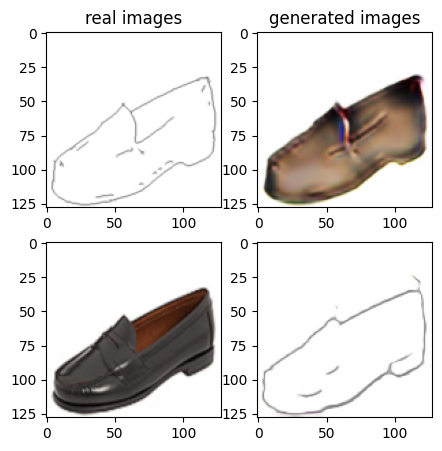

Train Epoch: 1 20% 	Total Loss: 1.611768 	Loss_G_AB: 0.354653	Loss_G_BA: 0.968633	Loss_cycle: 0.631090	Loss_D_A: 0.024342	Loss_D_B: 0.294694
0 10009 T:  1.9476704597473145
Train Epoch: 1 20% 	Total Loss: 1.567718 	Loss_G_AB: 0.386030	Loss_G_BA: 0.804911	Loss_cycle: 0.605948	Loss_D_A: 0.070616	Loss_D_B: 0.295684
0 10019 T:  0.9821183681488037
Train Epoch: 1 20% 	Total Loss: 1.577170 	Loss_G_AB: 0.326359	Loss_G_BA: 0.937449	Loss_cycle: 0.613966	Loss_D_A: 0.071507	Loss_D_B: 0.259793
0 10029 T:  0.9840326309204102
Train Epoch: 1 20% 	Total Loss: 1.479575 	Loss_G_AB: 0.310498	Loss_G_BA: 0.908401	Loss_cycle: 0.605379	Loss_D_A: 0.015227	Loss_D_B: 0.249520
0 10039 T:  0.9815812110900879
Train Epoch: 1 20% 	Total Loss: 1.463890 	Loss_G_AB: 0.301896	Loss_G_BA: 1.006960	Loss_cycle: 0.539322	Loss_D_A: 0.020214	Loss_D_B: 0.249926
0 10049 T:  1.1003262996673584
Train Epoch: 1 20% 	Total Loss: 1.598760 	Loss_G_AB: 0.307981	Loss_G_BA: 0.975185	Loss_cycle: 0.685811	Loss_D_A: 0.013192	Loss_D_B: 0.258174

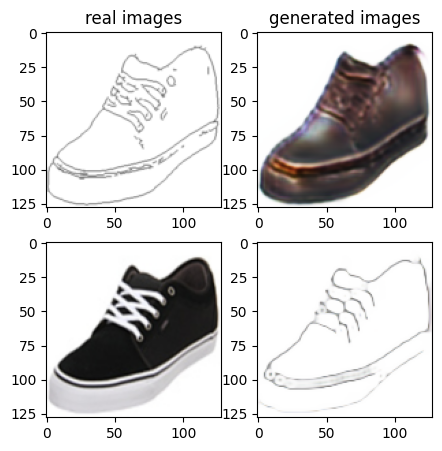

Train Epoch: 1 22% 	Total Loss: 1.558020 	Loss_G_AB: 0.287675	Loss_G_BA: 0.899475	Loss_cycle: 0.664965	Loss_D_A: 0.043100	Loss_D_B: 0.256381
0 11009 T:  2.1460230350494385
Train Epoch: 1 22% 	Total Loss: 1.457325 	Loss_G_AB: 0.275252	Loss_G_BA: 1.022942	Loss_cycle: 0.547698	Loss_D_A: 0.018918	Loss_D_B: 0.241612
0 11019 T:  1.0147032737731934
Train Epoch: 1 22% 	Total Loss: 1.439142 	Loss_G_AB: 0.311746	Loss_G_BA: 0.984973	Loss_cycle: 0.527120	Loss_D_A: 0.012541	Loss_D_B: 0.251121
0 11029 T:  0.997732400894165
Train Epoch: 1 22% 	Total Loss: 1.522675 	Loss_G_AB: 0.322555	Loss_G_BA: 0.905803	Loss_cycle: 0.580659	Loss_D_A: 0.056216	Loss_D_B: 0.271621
0 11039 T:  0.9990987777709961
Train Epoch: 1 22% 	Total Loss: 1.439198 	Loss_G_AB: 0.323271	Loss_G_BA: 0.824942	Loss_cycle: 0.571249	Loss_D_A: 0.037271	Loss_D_B: 0.256572
0 11049 T:  1.00093674659729
Train Epoch: 1 22% 	Total Loss: 1.673142 	Loss_G_AB: 0.300117	Loss_G_BA: 0.820284	Loss_cycle: 0.735562	Loss_D_A: 0.124490	Loss_D_B: 0.252890
0 

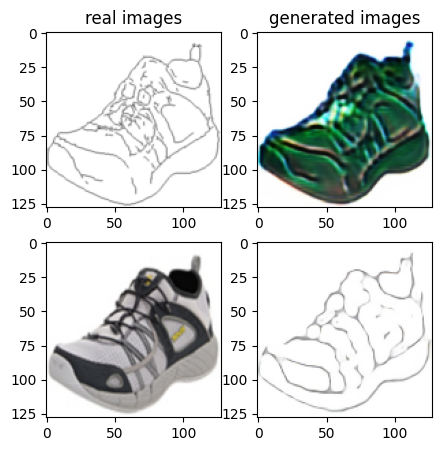

Train Epoch: 1 24% 	Total Loss: 1.591071 	Loss_G_AB: 0.266942	Loss_G_BA: 0.997880	Loss_cycle: 0.675622	Loss_D_A: 0.010201	Loss_D_B: 0.272837
0 12009 T:  2.172746419906616
Train Epoch: 1 24% 	Total Loss: 1.432844 	Loss_G_AB: 0.262788	Loss_G_BA: 1.019718	Loss_cycle: 0.526387	Loss_D_A: 0.012782	Loss_D_B: 0.252422
0 12019 T:  0.9846875667572021
Train Epoch: 1 24% 	Total Loss: 1.407477 	Loss_G_AB: 0.278784	Loss_G_BA: 0.982775	Loss_cycle: 0.507043	Loss_D_A: 0.011374	Loss_D_B: 0.258281
0 12029 T:  0.9842636585235596
Train Epoch: 1 24% 	Total Loss: 1.453428 	Loss_G_AB: 0.312746	Loss_G_BA: 1.000282	Loss_cycle: 0.519602	Loss_D_A: 0.006912	Loss_D_B: 0.270400
0 12039 T:  0.9798920154571533
Train Epoch: 1 24% 	Total Loss: 1.445577 	Loss_G_AB: 0.330774	Loss_G_BA: 1.017181	Loss_cycle: 0.500209	Loss_D_A: 0.005699	Loss_D_B: 0.265691
0 12049 T:  0.9791252613067627
Train Epoch: 1 24% 	Total Loss: 1.373312 	Loss_G_AB: 0.279346	Loss_G_BA: 0.968744	Loss_cycle: 0.485538	Loss_D_A: 0.009995	Loss_D_B: 0.253734


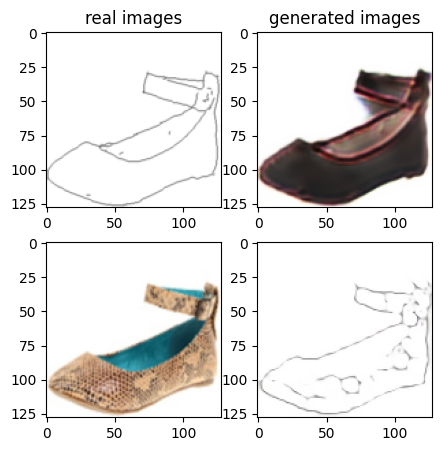

Train Epoch: 1 26% 	Total Loss: 1.488311 	Loss_G_AB: 0.273534	Loss_G_BA: 0.983772	Loss_cycle: 0.584673	Loss_D_A: 0.026110	Loss_D_B: 0.248875
0 13009 T:  2.133439779281616
Train Epoch: 1 26% 	Total Loss: 1.497567 	Loss_G_AB: 0.273226	Loss_G_BA: 0.807029	Loss_cycle: 0.616394	Loss_D_A: 0.088289	Loss_D_B: 0.252757
0 13019 T:  0.984060525894165
Train Epoch: 1 26% 	Total Loss: 1.444984 	Loss_G_AB: 0.273370	Loss_G_BA: 1.018309	Loss_cycle: 0.522254	Loss_D_A: 0.034668	Loss_D_B: 0.242223
0 13029 T:  0.9833722114562988
Train Epoch: 1 26% 	Total Loss: 1.506896 	Loss_G_AB: 0.302596	Loss_G_BA: 0.822328	Loss_cycle: 0.636060	Loss_D_A: 0.053031	Loss_D_B: 0.255343
0 13039 T:  0.9791076183319092
Train Epoch: 1 26% 	Total Loss: 1.531845 	Loss_G_AB: 0.284383	Loss_G_BA: 0.868848	Loss_cycle: 0.592771	Loss_D_A: 0.113047	Loss_D_B: 0.249413
0 13049 T:  0.9865982532501221
Train Epoch: 1 26% 	Total Loss: 1.582764 	Loss_G_AB: 0.300768	Loss_G_BA: 0.994304	Loss_cycle: 0.641155	Loss_D_A: 0.010885	Loss_D_B: 0.283188
0

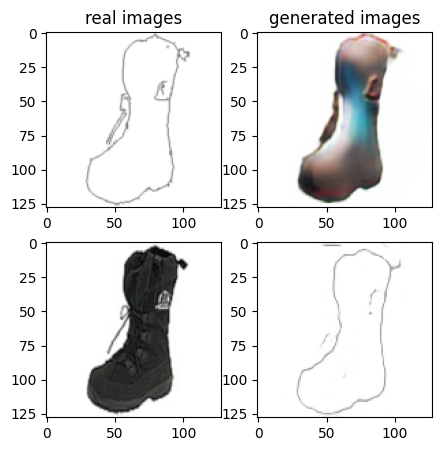

Train Epoch: 1 28% 	Total Loss: 1.634018 	Loss_G_AB: 0.302951	Loss_G_BA: 0.941805	Loss_cycle: 0.739513	Loss_D_A: 0.027593	Loss_D_B: 0.244533
0 14009 T:  1.946868658065796
Train Epoch: 1 28% 	Total Loss: 1.448776 	Loss_G_AB: 0.304062	Loss_G_BA: 0.952256	Loss_cycle: 0.556818	Loss_D_A: 0.006971	Loss_D_B: 0.256828
0 14019 T:  0.9948368072509766
Train Epoch: 1 28% 	Total Loss: 1.512128 	Loss_G_AB: 0.285070	Loss_G_BA: 0.933460	Loss_cycle: 0.569728	Loss_D_A: 0.076637	Loss_D_B: 0.256498
0 14029 T:  1.1329388618469238
Train Epoch: 1 28% 	Total Loss: 1.579492 	Loss_G_AB: 0.360760	Loss_G_BA: 0.659041	Loss_cycle: 0.657461	Loss_D_A: 0.178598	Loss_D_B: 0.233532
0 14039 T:  1.0293314456939697
Train Epoch: 1 28% 	Total Loss: 1.524992 	Loss_G_AB: 0.259646	Loss_G_BA: 0.635704	Loss_cycle: 0.615534	Loss_D_A: 0.136440	Loss_D_B: 0.325343
0 14049 T:  1.0643398761749268
Train Epoch: 1 28% 	Total Loss: 1.465967 	Loss_G_AB: 0.348994	Loss_G_BA: 0.650811	Loss_cycle: 0.599710	Loss_D_A: 0.113699	Loss_D_B: 0.252655


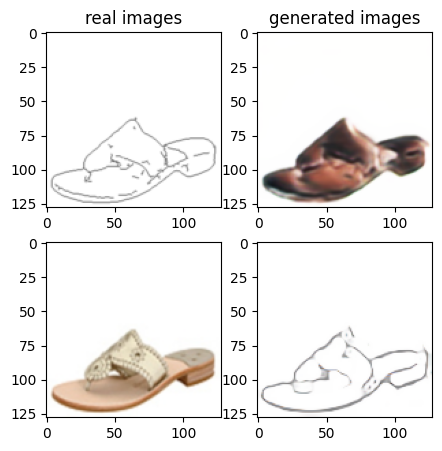

Train Epoch: 1 30% 	Total Loss: 1.607859 	Loss_G_AB: 0.285347	Loss_G_BA: 0.976417	Loss_cycle: 0.706173	Loss_D_A: 0.005560	Loss_D_B: 0.265245
0 15009 T:  2.6190297603607178
Train Epoch: 1 30% 	Total Loss: 1.512367 	Loss_G_AB: 0.282292	Loss_G_BA: 0.944623	Loss_cycle: 0.631975	Loss_D_A: 0.017615	Loss_D_B: 0.249320
0 15019 T:  0.987969160079956
Train Epoch: 1 30% 	Total Loss: 1.434377 	Loss_G_AB: 0.286089	Loss_G_BA: 1.052422	Loss_cycle: 0.504804	Loss_D_A: 0.008215	Loss_D_B: 0.252102
0 15029 T:  0.9830241203308105
Train Epoch: 1 30% 	Total Loss: 1.540396 	Loss_G_AB: 0.267488	Loss_G_BA: 1.025099	Loss_cycle: 0.611635	Loss_D_A: 0.006053	Loss_D_B: 0.276415
0 15039 T:  0.9789083003997803
Train Epoch: 1 30% 	Total Loss: 1.495460 	Loss_G_AB: 0.300163	Loss_G_BA: 0.971482	Loss_cycle: 0.607454	Loss_D_A: 0.004910	Loss_D_B: 0.247273
0 15049 T:  0.9787871837615967
Train Epoch: 1 30% 	Total Loss: 1.297234 	Loss_G_AB: 0.265711	Loss_G_BA: 0.975359	Loss_cycle: 0.410538	Loss_D_A: 0.010797	Loss_D_B: 0.255364


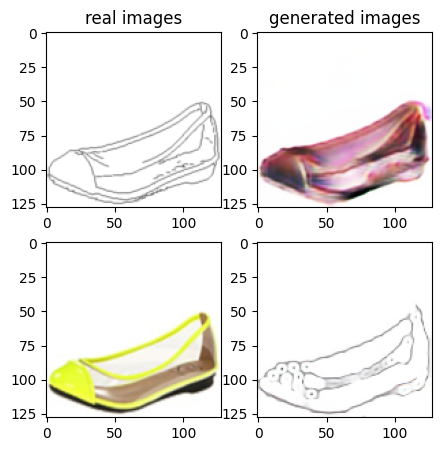

Train Epoch: 1 32% 	Total Loss: 1.452949 	Loss_G_AB: 0.254259	Loss_G_BA: 0.640804	Loss_cycle: 0.498475	Loss_D_A: 0.235643	Loss_D_B: 0.271299
0 16009 T:  1.9511353969573975
Train Epoch: 1 32% 	Total Loss: 1.372068 	Loss_G_AB: 0.263447	Loss_G_BA: 0.558747	Loss_cycle: 0.589423	Loss_D_A: 0.121943	Loss_D_B: 0.249604
0 16019 T:  0.9809112548828125
Train Epoch: 1 32% 	Total Loss: 1.396090 	Loss_G_AB: 0.256226	Loss_G_BA: 0.659737	Loss_cycle: 0.499057	Loss_D_A: 0.190456	Loss_D_B: 0.248596
0 16029 T:  0.9731872081756592
Train Epoch: 1 32% 	Total Loss: 1.519339 	Loss_G_AB: 0.260873	Loss_G_BA: 0.692853	Loss_cycle: 0.574024	Loss_D_A: 0.211126	Loss_D_B: 0.257327
0 16039 T:  0.9739933013916016
Train Epoch: 1 32% 	Total Loss: 1.444773 	Loss_G_AB: 0.268500	Loss_G_BA: 0.639019	Loss_cycle: 0.602605	Loss_D_A: 0.139446	Loss_D_B: 0.248963
0 16049 T:  0.9919843673706055
Train Epoch: 1 32% 	Total Loss: 1.434136 	Loss_G_AB: 0.257664	Loss_G_BA: 0.624883	Loss_cycle: 0.559777	Loss_D_A: 0.171793	Loss_D_B: 0.261293

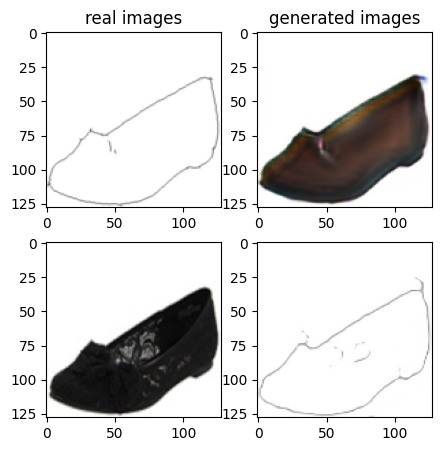

Train Epoch: 1 34% 	Total Loss: 1.305562 	Loss_G_AB: 0.272988	Loss_G_BA: 0.831094	Loss_cycle: 0.433012	Loss_D_A: 0.076904	Loss_D_B: 0.243605
0 17009 T:  2.1428089141845703
Train Epoch: 1 34% 	Total Loss: 1.360365 	Loss_G_AB: 0.282805	Loss_G_BA: 0.883312	Loss_cycle: 0.466446	Loss_D_A: 0.054529	Loss_D_B: 0.256332
0 17019 T:  0.9797160625457764
Train Epoch: 1 34% 	Total Loss: 1.371580 	Loss_G_AB: 0.268854	Loss_G_BA: 0.958871	Loss_cycle: 0.477355	Loss_D_A: 0.034489	Loss_D_B: 0.245873
0 17029 T:  0.9872159957885742
Train Epoch: 1 34% 	Total Loss: 1.419780 	Loss_G_AB: 0.270170	Loss_G_BA: 0.950417	Loss_cycle: 0.516776	Loss_D_A: 0.034467	Loss_D_B: 0.258243
0 17039 T:  0.9756970405578613
Train Epoch: 1 34% 	Total Loss: 1.446127 	Loss_G_AB: 0.268989	Loss_G_BA: 0.956178	Loss_cycle: 0.556967	Loss_D_A: 0.016762	Loss_D_B: 0.259814
0 17049 T:  1.0498073101043701
Train Epoch: 1 34% 	Total Loss: 1.405246 	Loss_G_AB: 0.276887	Loss_G_BA: 0.965192	Loss_cycle: 0.517021	Loss_D_A: 0.024354	Loss_D_B: 0.242831

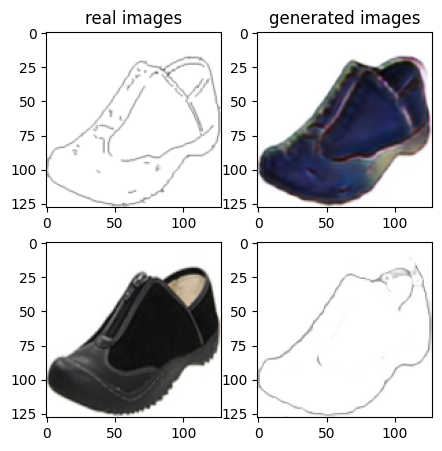

Train Epoch: 1 36% 	Total Loss: 1.409978 	Loss_G_AB: 0.271722	Loss_G_BA: 0.949850	Loss_cycle: 0.507036	Loss_D_A: 0.014715	Loss_D_B: 0.277441
0 18009 T:  2.1487948894500732
Train Epoch: 1 36% 	Total Loss: 1.437434 	Loss_G_AB: 0.264152	Loss_G_BA: 0.986453	Loss_cycle: 0.548710	Loss_D_A: 0.012688	Loss_D_B: 0.250732
0 18019 T:  0.9922292232513428
Train Epoch: 1 36% 	Total Loss: 1.379872 	Loss_G_AB: 0.252937	Loss_G_BA: 1.010155	Loss_cycle: 0.483559	Loss_D_A: 0.008770	Loss_D_B: 0.255997
0 18029 T:  1.0233237743377686
Train Epoch: 1 36% 	Total Loss: 1.467241 	Loss_G_AB: 0.275659	Loss_G_BA: 0.950683	Loss_cycle: 0.566815	Loss_D_A: 0.029910	Loss_D_B: 0.257345
0 18039 T:  1.0278029441833496
Train Epoch: 1 36% 	Total Loss: 1.412659 	Loss_G_AB: 0.263657	Loss_G_BA: 1.014849	Loss_cycle: 0.507615	Loss_D_A: 0.008554	Loss_D_B: 0.257238
0 18049 T:  1.052725076675415
Train Epoch: 1 36% 	Total Loss: 1.539467 	Loss_G_AB: 0.261443	Loss_G_BA: 0.982720	Loss_cycle: 0.653412	Loss_D_A: 0.006072	Loss_D_B: 0.257901


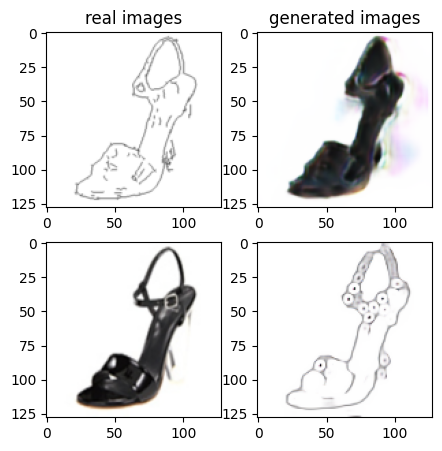

Train Epoch: 1 38% 	Total Loss: 1.423706 	Loss_G_AB: 0.276003	Loss_G_BA: 0.960925	Loss_cycle: 0.521600	Loss_D_A: 0.029422	Loss_D_B: 0.254220
0 19009 T:  2.279428243637085
Train Epoch: 1 38% 	Total Loss: 1.416915 	Loss_G_AB: 0.275694	Loss_G_BA: 0.960881	Loss_cycle: 0.540444	Loss_D_A: 0.009653	Loss_D_B: 0.248531
0 19019 T:  0.9988257884979248
Train Epoch: 1 38% 	Total Loss: 1.412194 	Loss_G_AB: 0.276368	Loss_G_BA: 1.064345	Loss_cycle: 0.484675	Loss_D_A: 0.018284	Loss_D_B: 0.238879
0 19029 T:  1.0060253143310547
Train Epoch: 1 38% 	Total Loss: 1.412284 	Loss_G_AB: 0.280822	Loss_G_BA: 1.000231	Loss_cycle: 0.489782	Loss_D_A: 0.007107	Loss_D_B: 0.274869
0 19039 T:  0.9892058372497559
Train Epoch: 1 38% 	Total Loss: 1.522481 	Loss_G_AB: 0.267050	Loss_G_BA: 0.940716	Loss_cycle: 0.646153	Loss_D_A: 0.010371	Loss_D_B: 0.262074
0 19049 T:  0.9874982833862305
Train Epoch: 1 38% 	Total Loss: 1.443672 	Loss_G_AB: 0.273311	Loss_G_BA: 0.986863	Loss_cycle: 0.552006	Loss_D_A: 0.015235	Loss_D_B: 0.246344


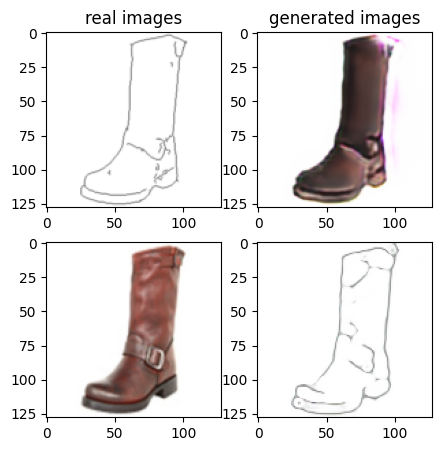

Train Epoch: 1 40% 	Total Loss: 1.534522 	Loss_G_AB: 0.266501	Loss_G_BA: 0.963075	Loss_cycle: 0.650456	Loss_D_A: 0.011011	Loss_D_B: 0.258268
0 20009 T:  2.0065395832061768
Train Epoch: 1 40% 	Total Loss: 1.406945 	Loss_G_AB: 0.298351	Loss_G_BA: 1.047150	Loss_cycle: 0.479700	Loss_D_A: 0.005841	Loss_D_B: 0.248653
0 20019 T:  0.97719407081604
Train Epoch: 1 40% 	Total Loss: 1.358845 	Loss_G_AB: 0.279921	Loss_G_BA: 0.785620	Loss_cycle: 0.478424	Loss_D_A: 0.068421	Loss_D_B: 0.279229
0 20029 T:  0.9751598834991455
Train Epoch: 1 40% 	Total Loss: 1.379100 	Loss_G_AB: 0.285180	Loss_G_BA: 0.947997	Loss_cycle: 0.498433	Loss_D_A: 0.009254	Loss_D_B: 0.254823
0 20039 T:  0.9805197715759277
Train Epoch: 1 40% 	Total Loss: 1.404870 	Loss_G_AB: 0.285498	Loss_G_BA: 1.040760	Loss_cycle: 0.490488	Loss_D_A: 0.006225	Loss_D_B: 0.245027
0 20049 T:  0.9722318649291992
Train Epoch: 1 40% 	Total Loss: 1.440159 	Loss_G_AB: 0.267523	Loss_G_BA: 0.976300	Loss_cycle: 0.549070	Loss_D_A: 0.012455	Loss_D_B: 0.256723
0

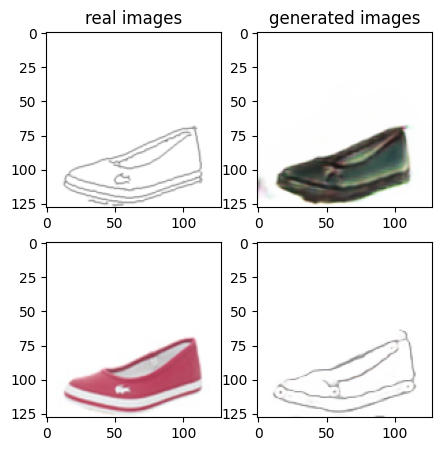

Train Epoch: 1 42% 	Total Loss: 1.333193 	Loss_G_AB: 0.271647	Loss_G_BA: 0.992946	Loss_cycle: 0.435577	Loss_D_A: 0.006330	Loss_D_B: 0.258990
0 21009 T:  2.2489869594573975
Train Epoch: 1 42% 	Total Loss: 1.483937 	Loss_G_AB: 0.274357	Loss_G_BA: 0.999685	Loss_cycle: 0.581394	Loss_D_A: 0.004277	Loss_D_B: 0.261244
0 21019 T:  0.9739596843719482
Train Epoch: 1 42% 	Total Loss: 1.460902 	Loss_G_AB: 0.261793	Loss_G_BA: 1.005975	Loss_cycle: 0.556331	Loss_D_A: 0.007609	Loss_D_B: 0.263078
0 21029 T:  0.9814138412475586
Train Epoch: 1 42% 	Total Loss: 1.379819 	Loss_G_AB: 0.292862	Loss_G_BA: 1.003373	Loss_cycle: 0.475171	Loss_D_A: 0.006350	Loss_D_B: 0.250181
0 21039 T:  0.9879913330078125
Train Epoch: 1 42% 	Total Loss: 1.438768 	Loss_G_AB: 0.270633	Loss_G_BA: 0.993769	Loss_cycle: 0.517908	Loss_D_A: 0.010448	Loss_D_B: 0.278211
0 21049 T:  0.9875586032867432
Train Epoch: 1 42% 	Total Loss: 1.341807 	Loss_G_AB: 0.297352	Loss_G_BA: 0.904054	Loss_cycle: 0.453403	Loss_D_A: 0.041048	Loss_D_B: 0.246652

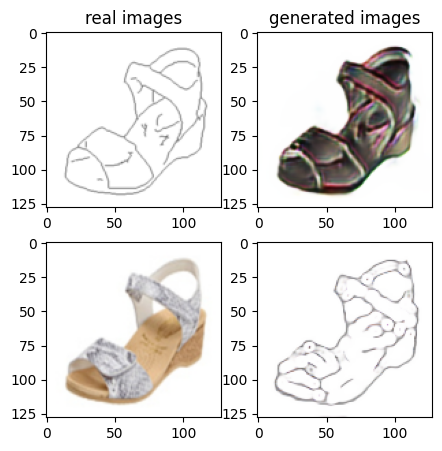

Train Epoch: 1 44% 	Total Loss: 1.482069 	Loss_G_AB: 0.274875	Loss_G_BA: 0.981681	Loss_cycle: 0.578463	Loss_D_A: 0.009752	Loss_D_B: 0.265577
0 22009 T:  2.081563949584961
Train Epoch: 1 44% 	Total Loss: 1.556446 	Loss_G_AB: 0.275873	Loss_G_BA: 1.001891	Loss_cycle: 0.659134	Loss_D_A: 0.005424	Loss_D_B: 0.253006
0 22019 T:  0.9918801784515381
Train Epoch: 1 44% 	Total Loss: 1.423646 	Loss_G_AB: 0.277509	Loss_G_BA: 0.948571	Loss_cycle: 0.541845	Loss_D_A: 0.009826	Loss_D_B: 0.258935
0 22029 T:  1.0368282794952393
Train Epoch: 1 44% 	Total Loss: 1.396949 	Loss_G_AB: 0.269890	Loss_G_BA: 1.010732	Loss_cycle: 0.499511	Loss_D_A: 0.006837	Loss_D_B: 0.250289
0 22039 T:  1.017343282699585
Train Epoch: 1 44% 	Total Loss: 1.407342 	Loss_G_AB: 0.285966	Loss_G_BA: 0.996318	Loss_cycle: 0.491555	Loss_D_A: 0.013665	Loss_D_B: 0.260980
0 22049 T:  1.0336339473724365
Train Epoch: 1 44% 	Total Loss: 1.448703 	Loss_G_AB: 0.264595	Loss_G_BA: 0.997573	Loss_cycle: 0.553865	Loss_D_A: 0.006461	Loss_D_B: 0.257293
0

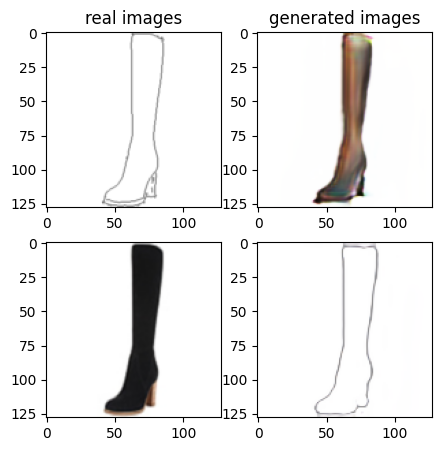

Train Epoch: 1 46% 	Total Loss: 1.344354 	Loss_G_AB: 0.289664	Loss_G_BA: 0.821481	Loss_cycle: 0.463870	Loss_D_A: 0.058321	Loss_D_B: 0.266590
0 23009 T:  2.200129747390747
Train Epoch: 1 46% 	Total Loss: 1.371356 	Loss_G_AB: 0.322226	Loss_G_BA: 0.687440	Loss_cycle: 0.481044	Loss_D_A: 0.148440	Loss_D_B: 0.237039
0 23019 T:  1.0163168907165527
Train Epoch: 1 46% 	Total Loss: 1.480582 	Loss_G_AB: 0.298436	Loss_G_BA: 0.944136	Loss_cycle: 0.541175	Loss_D_A: 0.043327	Loss_D_B: 0.274794
0 23029 T:  1.0253901481628418
Train Epoch: 1 46% 	Total Loss: 1.507390 	Loss_G_AB: 0.296992	Loss_G_BA: 0.922919	Loss_cycle: 0.613565	Loss_D_A: 0.027288	Loss_D_B: 0.256581
0 23039 T:  1.0934832096099854
Train Epoch: 1 46% 	Total Loss: 1.404250 	Loss_G_AB: 0.268149	Loss_G_BA: 0.891136	Loss_cycle: 0.505663	Loss_D_A: 0.055665	Loss_D_B: 0.263280
0 23049 T:  1.0062155723571777
Train Epoch: 1 46% 	Total Loss: 1.476273 	Loss_G_AB: 0.284605	Loss_G_BA: 0.911264	Loss_cycle: 0.544884	Loss_D_A: 0.081719	Loss_D_B: 0.251735


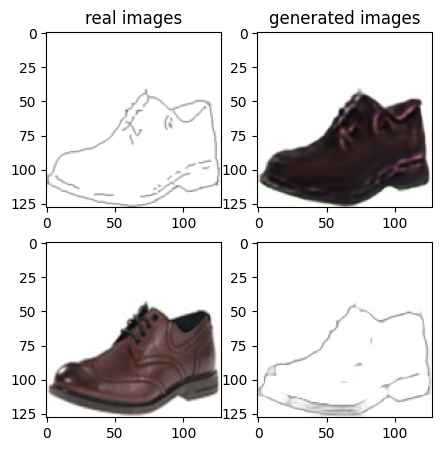

Train Epoch: 1 48% 	Total Loss: 1.371994 	Loss_G_AB: 0.265047	Loss_G_BA: 0.982825	Loss_cycle: 0.472632	Loss_D_A: 0.017603	Loss_D_B: 0.257823
0 24009 T:  2.5707662105560303
Train Epoch: 1 48% 	Total Loss: 1.559284 	Loss_G_AB: 0.259607	Loss_G_BA: 1.033432	Loss_cycle: 0.633068	Loss_D_A: 0.019657	Loss_D_B: 0.260040
0 24019 T:  1.017885684967041
Train Epoch: 1 48% 	Total Loss: 1.437763 	Loss_G_AB: 0.261288	Loss_G_BA: 1.024809	Loss_cycle: 0.537854	Loss_D_A: 0.005634	Loss_D_B: 0.251227
0 24029 T:  0.9842948913574219
Train Epoch: 1 48% 	Total Loss: 1.407402 	Loss_G_AB: 0.297052	Loss_G_BA: 0.959879	Loss_cycle: 0.523508	Loss_D_A: 0.006324	Loss_D_B: 0.249104
0 24039 T:  0.9806883335113525
Train Epoch: 1 48% 	Total Loss: 1.330725 	Loss_G_AB: 0.274155	Loss_G_BA: 0.951953	Loss_cycle: 0.461110	Loss_D_A: 0.012766	Loss_D_B: 0.243795
0 24049 T:  0.9883074760437012
Train Epoch: 1 48% 	Total Loss: 1.361531 	Loss_G_AB: 0.268710	Loss_G_BA: 0.943866	Loss_cycle: 0.485156	Loss_D_A: 0.013927	Loss_D_B: 0.256161


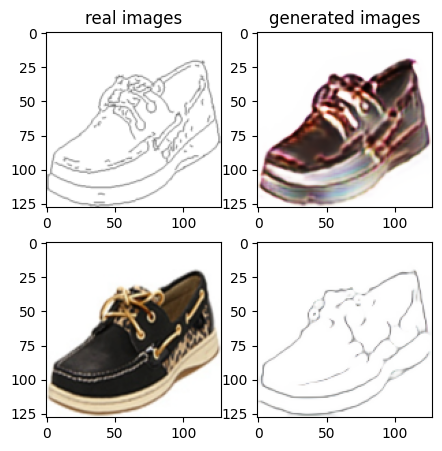

Train Epoch: 1 50% 	Total Loss: 1.516170 	Loss_G_AB: 0.283597	Loss_G_BA: 0.983515	Loss_cycle: 0.607953	Loss_D_A: 0.016032	Loss_D_B: 0.258629
0 25009 T:  2.0676426887512207
Train Epoch: 1 50% 	Total Loss: 1.388996 	Loss_G_AB: 0.291732	Loss_G_BA: 0.988863	Loss_cycle: 0.486031	Loss_D_A: 0.008017	Loss_D_B: 0.254650
0 25019 T:  0.9905130863189697
Train Epoch: 1 50% 	Total Loss: 1.487377 	Loss_G_AB: 0.287787	Loss_G_BA: 1.006588	Loss_cycle: 0.565962	Loss_D_A: 0.011348	Loss_D_B: 0.262880
0 25029 T:  0.9809339046478271
Train Epoch: 1 50% 	Total Loss: 1.462117 	Loss_G_AB: 0.270561	Loss_G_BA: 0.992017	Loss_cycle: 0.551997	Loss_D_A: 0.007700	Loss_D_B: 0.271131
0 25039 T:  0.9794867038726807
Train Epoch: 1 50% 	Total Loss: 1.371528 	Loss_G_AB: 0.327932	Loss_G_BA: 0.989993	Loss_cycle: 0.451631	Loss_D_A: 0.023439	Loss_D_B: 0.237496
0 25049 T:  1.0123677253723145
Train Epoch: 1 50% 	Total Loss: 1.393745 	Loss_G_AB: 0.290196	Loss_G_BA: 0.989438	Loss_cycle: 0.476288	Loss_D_A: 0.004399	Loss_D_B: 0.273242

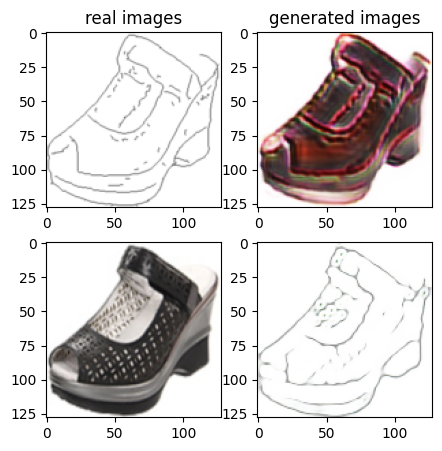

Train Epoch: 1 52% 	Total Loss: 1.361723 	Loss_G_AB: 0.265302	Loss_G_BA: 0.927937	Loss_cycle: 0.495320	Loss_D_A: 0.007375	Loss_D_B: 0.262409
0 26009 T:  2.021820306777954
Train Epoch: 1 52% 	Total Loss: 1.520872 	Loss_G_AB: 0.270897	Loss_G_BA: 1.062671	Loss_cycle: 0.575010	Loss_D_A: 0.006745	Loss_D_B: 0.272333
0 26019 T:  0.9786813259124756
Train Epoch: 1 52% 	Total Loss: 1.457778 	Loss_G_AB: 0.287347	Loss_G_BA: 0.940257	Loss_cycle: 0.570706	Loss_D_A: 0.020407	Loss_D_B: 0.252864
0 26029 T:  0.9950273036956787
Train Epoch: 1 52% 	Total Loss: 1.313188 	Loss_G_AB: 0.259269	Loss_G_BA: 1.008263	Loss_cycle: 0.407525	Loss_D_A: 0.008817	Loss_D_B: 0.263080
0 26039 T:  0.9874420166015625
Train Epoch: 1 52% 	Total Loss: 1.345158 	Loss_G_AB: 0.248270	Loss_G_BA: 0.968741	Loss_cycle: 0.466839	Loss_D_A: 0.013573	Loss_D_B: 0.256240
0 26049 T:  0.9858691692352295
Train Epoch: 1 52% 	Total Loss: 1.307178 	Loss_G_AB: 0.295604	Loss_G_BA: 0.864227	Loss_cycle: 0.444111	Loss_D_A: 0.042722	Loss_D_B: 0.240430


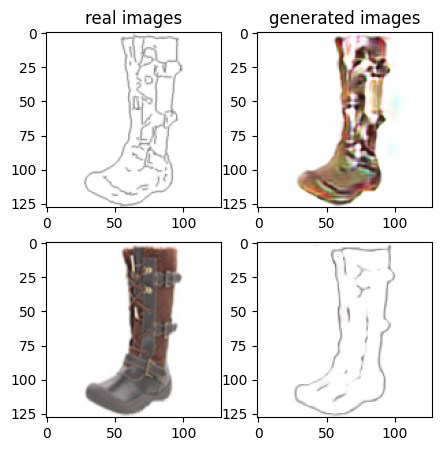

Train Epoch: 1 54% 	Total Loss: 1.222151 	Loss_G_AB: 0.255576	Loss_G_BA: 0.988723	Loss_cycle: 0.331902	Loss_D_A: 0.006837	Loss_D_B: 0.261262
0 27009 T:  2.125373125076294
Train Epoch: 1 54% 	Total Loss: 1.240006 	Loss_G_AB: 0.267805	Loss_G_BA: 1.013104	Loss_cycle: 0.335907	Loss_D_A: 0.004369	Loss_D_B: 0.259276
0 27019 T:  0.9841468334197998
Train Epoch: 1 54% 	Total Loss: 1.434232 	Loss_G_AB: 0.279512	Loss_G_BA: 0.999306	Loss_cycle: 0.541454	Loss_D_A: 0.004279	Loss_D_B: 0.249089
0 27029 T:  1.011915683746338
Train Epoch: 1 54% 	Total Loss: 1.364705 	Loss_G_AB: 0.256186	Loss_G_BA: 0.998519	Loss_cycle: 0.461879	Loss_D_A: 0.003429	Loss_D_B: 0.272045
0 27039 T:  1.0495572090148926
Train Epoch: 1 54% 	Total Loss: 1.350898 	Loss_G_AB: 0.267280	Loss_G_BA: 0.992222	Loss_cycle: 0.467092	Loss_D_A: 0.002047	Loss_D_B: 0.252008
0 27049 T:  1.069216012954712
Train Epoch: 1 54% 	Total Loss: 1.376464 	Loss_G_AB: 0.265420	Loss_G_BA: 0.999532	Loss_cycle: 0.476606	Loss_D_A: 0.002350	Loss_D_B: 0.265031
0 

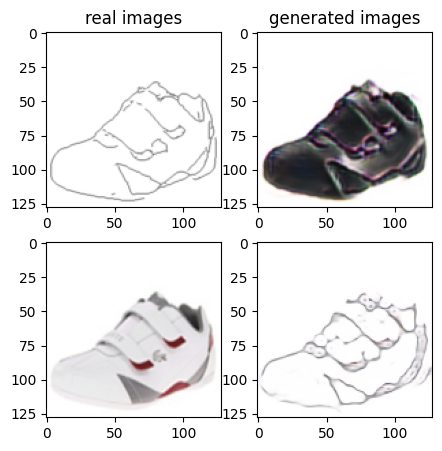

Train Epoch: 1 56% 	Total Loss: 1.295210 	Loss_G_AB: 0.285821	Loss_G_BA: 0.995502	Loss_cycle: 0.399814	Loss_D_A: 0.001681	Loss_D_B: 0.253054
0 28009 T:  2.4450745582580566
Train Epoch: 1 56% 	Total Loss: 1.393939 	Loss_G_AB: 0.272586	Loss_G_BA: 1.004605	Loss_cycle: 0.502949	Loss_D_A: 0.001682	Loss_D_B: 0.250712
0 28019 T:  1.0247485637664795
Train Epoch: 1 56% 	Total Loss: 1.440611 	Loss_G_AB: 0.289274	Loss_G_BA: 0.990257	Loss_cycle: 0.547411	Loss_D_A: 0.001911	Loss_D_B: 0.251524
0 28029 T:  0.9798469543457031
Train Epoch: 1 56% 	Total Loss: 1.290287 	Loss_G_AB: 0.280921	Loss_G_BA: 0.988441	Loss_cycle: 0.397253	Loss_D_A: 0.004687	Loss_D_B: 0.253666
0 28039 T:  0.9825229644775391
Train Epoch: 1 56% 	Total Loss: 1.372534 	Loss_G_AB: 0.275587	Loss_G_BA: 0.999339	Loss_cycle: 0.455073	Loss_D_A: 0.016675	Loss_D_B: 0.263323
0 28049 T:  0.9839370250701904
Train Epoch: 1 56% 	Total Loss: 1.358619 	Loss_G_AB: 0.274418	Loss_G_BA: 0.970218	Loss_cycle: 0.464281	Loss_D_A: 0.004884	Loss_D_B: 0.267136

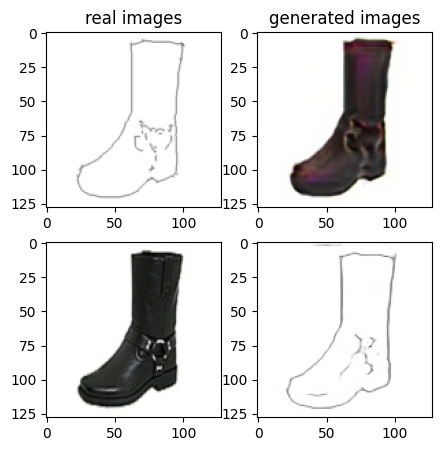

Train Epoch: 1 58% 	Total Loss: 1.376449 	Loss_G_AB: 0.269687	Loss_G_BA: 0.995526	Loss_cycle: 0.497716	Loss_D_A: 0.004233	Loss_D_B: 0.241893
0 29009 T:  2.067492723464966
Train Epoch: 1 58% 	Total Loss: 1.393117 	Loss_G_AB: 0.289701	Loss_G_BA: 1.008475	Loss_cycle: 0.506144	Loss_D_A: 0.005058	Loss_D_B: 0.232827
0 29019 T:  0.9800443649291992
Train Epoch: 1 58% 	Total Loss: 1.314030 	Loss_G_AB: 0.262740	Loss_G_BA: 0.983222	Loss_cycle: 0.409761	Loss_D_A: 0.003958	Loss_D_B: 0.277330
0 29029 T:  0.9757943153381348
Train Epoch: 1 58% 	Total Loss: 1.369642 	Loss_G_AB: 0.304079	Loss_G_BA: 1.016341	Loss_cycle: 0.466781	Loss_D_A: 0.004052	Loss_D_B: 0.238600
0 29039 T:  0.9735186100006104
Train Epoch: 1 58% 	Total Loss: 1.423314 	Loss_G_AB: 0.274922	Loss_G_BA: 0.993109	Loss_cycle: 0.525819	Loss_D_A: 0.003174	Loss_D_B: 0.260305
0 29049 T:  0.9994423389434814
Train Epoch: 1 58% 	Total Loss: 1.481399 	Loss_G_AB: 0.291740	Loss_G_BA: 0.989074	Loss_cycle: 0.591258	Loss_D_A: 0.002676	Loss_D_B: 0.247058


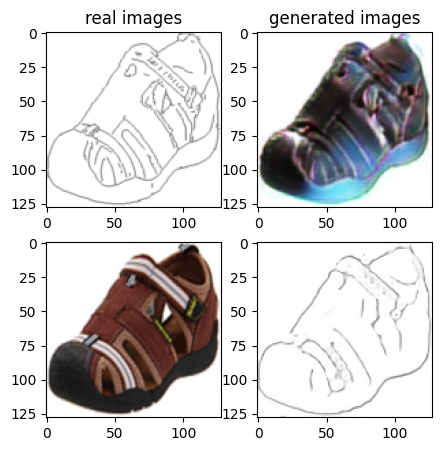

Train Epoch: 1 60% 	Total Loss: 1.411566 	Loss_G_AB: 0.285010	Loss_G_BA: 0.975165	Loss_cycle: 0.526695	Loss_D_A: 0.002369	Loss_D_B: 0.252414
0 30009 T:  2.076068162918091
Train Epoch: 1 60% 	Total Loss: 1.384570 	Loss_G_AB: 0.306713	Loss_G_BA: 0.977885	Loss_cycle: 0.467697	Loss_D_A: 0.005363	Loss_D_B: 0.269211
0 30019 T:  1.0032711029052734
Train Epoch: 1 60% 	Total Loss: 1.406981 	Loss_G_AB: 0.268084	Loss_G_BA: 0.983893	Loss_cycle: 0.514920	Loss_D_A: 0.008764	Loss_D_B: 0.257309
0 30029 T:  0.9912707805633545
Train Epoch: 1 60% 	Total Loss: 1.388223 	Loss_G_AB: 0.286338	Loss_G_BA: 0.989579	Loss_cycle: 0.492987	Loss_D_A: 0.003936	Loss_D_B: 0.253342
0 30039 T:  0.990532636642456
Train Epoch: 1 60% 	Total Loss: 1.375265 	Loss_G_AB: 0.280578	Loss_G_BA: 1.000815	Loss_cycle: 0.470771	Loss_D_A: 0.003460	Loss_D_B: 0.260338
0 30049 T:  1.0328140258789062
Train Epoch: 1 60% 	Total Loss: 1.381347 	Loss_G_AB: 0.275909	Loss_G_BA: 0.990845	Loss_cycle: 0.490320	Loss_D_A: 0.003542	Loss_D_B: 0.254108
0

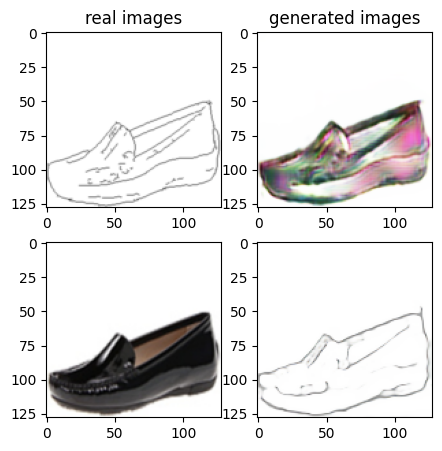

Train Epoch: 1 62% 	Total Loss: 1.318290 	Loss_G_AB: 0.261452	Loss_G_BA: 0.950143	Loss_cycle: 0.428864	Loss_D_A: 0.035434	Loss_D_B: 0.248196
0 31009 T:  2.0938761234283447
Train Epoch: 1 62% 	Total Loss: 1.280168 	Loss_G_AB: 0.279145	Loss_G_BA: 0.922642	Loss_cycle: 0.391675	Loss_D_A: 0.028394	Loss_D_B: 0.259204
0 31019 T:  0.977245569229126
Train Epoch: 1 62% 	Total Loss: 1.378588 	Loss_G_AB: 0.276876	Loss_G_BA: 0.934230	Loss_cycle: 0.523331	Loss_D_A: 0.015485	Loss_D_B: 0.234219
0 31029 T:  0.9840247631072998
Train Epoch: 1 62% 	Total Loss: 1.373312 	Loss_G_AB: 0.277558	Loss_G_BA: 1.010295	Loss_cycle: 0.479019	Loss_D_A: 0.006822	Loss_D_B: 0.243544
0 31039 T:  0.9901361465454102
Train Epoch: 1 62% 	Total Loss: 1.466443 	Loss_G_AB: 0.283671	Loss_G_BA: 0.999492	Loss_cycle: 0.574968	Loss_D_A: 0.006945	Loss_D_B: 0.242949
0 31049 T:  1.0299127101898193
Train Epoch: 1 62% 	Total Loss: 1.407119 	Loss_G_AB: 0.275445	Loss_G_BA: 1.022395	Loss_cycle: 0.499653	Loss_D_A: 0.003637	Loss_D_B: 0.254909


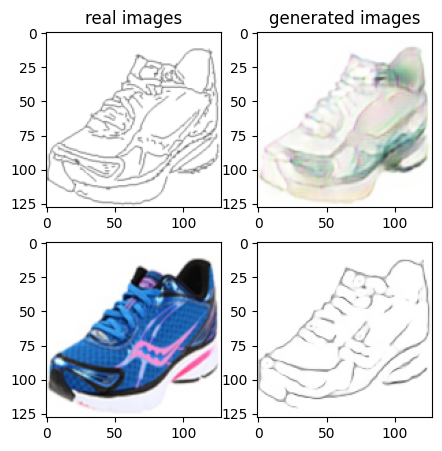

Train Epoch: 1 64% 	Total Loss: 1.637804 	Loss_G_AB: 0.268450	Loss_G_BA: 1.013460	Loss_cycle: 0.723801	Loss_D_A: 0.005105	Loss_D_B: 0.267943
0 32009 T:  2.2596683502197266
Train Epoch: 1 64% 	Total Loss: 1.479410 	Loss_G_AB: 0.269674	Loss_G_BA: 0.974146	Loss_cycle: 0.612662	Loss_D_A: 0.003454	Loss_D_B: 0.241384
0 32019 T:  0.9819467067718506
Train Epoch: 1 64% 	Total Loss: 1.370124 	Loss_G_AB: 0.278517	Loss_G_BA: 0.969503	Loss_cycle: 0.481446	Loss_D_A: 0.003642	Loss_D_B: 0.261026
0 32029 T:  1.009531021118164
Train Epoch: 1 64% 	Total Loss: 1.408466 	Loss_G_AB: 0.250723	Loss_G_BA: 1.042637	Loss_cycle: 0.498536	Loss_D_A: 0.002836	Loss_D_B: 0.260414
0 32039 T:  1.0881400108337402
Train Epoch: 1 64% 	Total Loss: 1.282260 	Loss_G_AB: 0.299166	Loss_G_BA: 0.994293	Loss_cycle: 0.392268	Loss_D_A: 0.006234	Loss_D_B: 0.237028
0 32049 T:  1.0972270965576172
Train Epoch: 1 64% 	Total Loss: 1.432674 	Loss_G_AB: 0.284746	Loss_G_BA: 0.979844	Loss_cycle: 0.519080	Loss_D_A: 0.006628	Loss_D_B: 0.274671


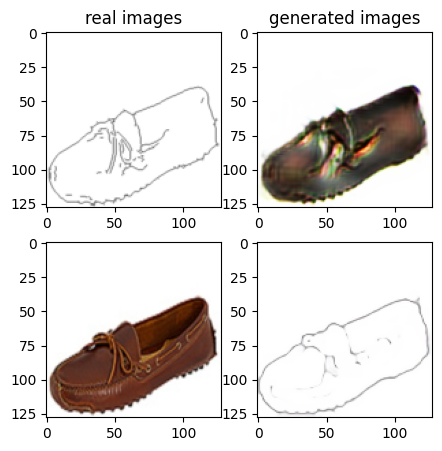

Train Epoch: 1 66% 	Total Loss: 1.393124 	Loss_G_AB: 0.267874	Loss_G_BA: 1.013166	Loss_cycle: 0.457819	Loss_D_A: 0.027652	Loss_D_B: 0.267132
0 33009 T:  2.1699419021606445
Train Epoch: 1 66% 	Total Loss: 1.389055 	Loss_G_AB: 0.289172	Loss_G_BA: 0.945118	Loss_cycle: 0.516820	Loss_D_A: 0.010348	Loss_D_B: 0.244742
0 33019 T:  1.0304903984069824
Train Epoch: 1 66% 	Total Loss: 1.417099 	Loss_G_AB: 0.278385	Loss_G_BA: 0.823898	Loss_cycle: 0.548330	Loss_D_A: 0.080902	Loss_D_B: 0.236724
0 33029 T:  1.04103422164917
Train Epoch: 1 66% 	Total Loss: 1.601673 	Loss_G_AB: 0.255766	Loss_G_BA: 0.996024	Loss_cycle: 0.664102	Loss_D_A: 0.034110	Loss_D_B: 0.277566
0 33039 T:  1.0869503021240234
Train Epoch: 1 66% 	Total Loss: 1.400285 	Loss_G_AB: 0.298433	Loss_G_BA: 0.922561	Loss_cycle: 0.496238	Loss_D_A: 0.055449	Loss_D_B: 0.238101
0 33049 T:  1.0539770126342773
Train Epoch: 1 66% 	Total Loss: 1.315858 	Loss_G_AB: 0.307009	Loss_G_BA: 0.755972	Loss_cycle: 0.483810	Loss_D_A: 0.052558	Loss_D_B: 0.248000
0

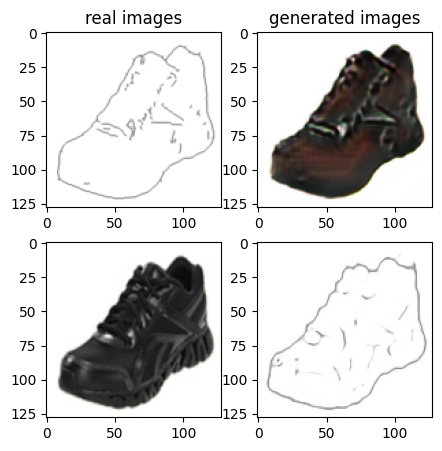

Train Epoch: 1 68% 	Total Loss: 1.364068 	Loss_G_AB: 0.272519	Loss_G_BA: 0.921352	Loss_cycle: 0.502172	Loss_D_A: 0.009933	Loss_D_B: 0.255029
0 34009 T:  2.4394404888153076
Train Epoch: 1 68% 	Total Loss: 1.363574 	Loss_G_AB: 0.270962	Loss_G_BA: 1.025739	Loss_cycle: 0.453516	Loss_D_A: 0.008967	Loss_D_B: 0.252741
0 34019 T:  0.9734117984771729
Train Epoch: 1 68% 	Total Loss: 1.428515 	Loss_G_AB: 0.282235	Loss_G_BA: 0.974989	Loss_cycle: 0.526899	Loss_D_A: 0.005475	Loss_D_B: 0.267528
0 34029 T:  0.9802207946777344
Train Epoch: 1 68% 	Total Loss: 1.468406 	Loss_G_AB: 0.272784	Loss_G_BA: 0.990922	Loss_cycle: 0.588071	Loss_D_A: 0.006443	Loss_D_B: 0.242039
0 34039 T:  0.9852848052978516
Train Epoch: 1 68% 	Total Loss: 1.315602 	Loss_G_AB: 0.271529	Loss_G_BA: 1.045895	Loss_cycle: 0.391093	Loss_D_A: 0.009135	Loss_D_B: 0.256662
0 34049 T:  0.9863243103027344
Train Epoch: 1 68% 	Total Loss: 1.328987 	Loss_G_AB: 0.277021	Loss_G_BA: 0.988743	Loss_cycle: 0.441537	Loss_D_A: 0.005008	Loss_D_B: 0.249560

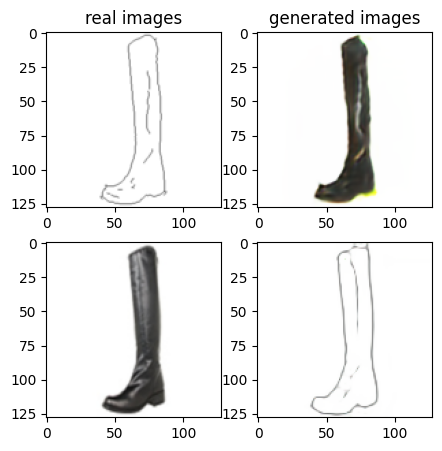

Train Epoch: 1 70% 	Total Loss: 1.330712 	Loss_G_AB: 0.292400	Loss_G_BA: 0.957580	Loss_cycle: 0.398358	Loss_D_A: 0.014340	Loss_D_B: 0.293024
0 35009 T:  2.013275384902954
Train Epoch: 1 70% 	Total Loss: 1.311001 	Loss_G_AB: 0.299405	Loss_G_BA: 0.978473	Loss_cycle: 0.415163	Loss_D_A: 0.019904	Loss_D_B: 0.236996
0 35019 T:  0.9791481494903564
Train Epoch: 1 70% 	Total Loss: 1.391654 	Loss_G_AB: 0.292140	Loss_G_BA: 1.015286	Loss_cycle: 0.481164	Loss_D_A: 0.004843	Loss_D_B: 0.251934
0 35029 T:  0.9756467342376709
Train Epoch: 1 70% 	Total Loss: 1.230007 	Loss_G_AB: 0.314244	Loss_G_BA: 0.960287	Loss_cycle: 0.330594	Loss_D_A: 0.005020	Loss_D_B: 0.257128
0 35039 T:  0.9716992378234863
Train Epoch: 1 70% 	Total Loss: 1.357830 	Loss_G_AB: 0.293672	Loss_G_BA: 1.021383	Loss_cycle: 0.466188	Loss_D_A: 0.005365	Loss_D_B: 0.228750
0 35049 T:  0.9897801876068115
Train Epoch: 1 70% 	Total Loss: 1.405632 	Loss_G_AB: 0.299666	Loss_G_BA: 0.972078	Loss_cycle: 0.506418	Loss_D_A: 0.005788	Loss_D_B: 0.257554


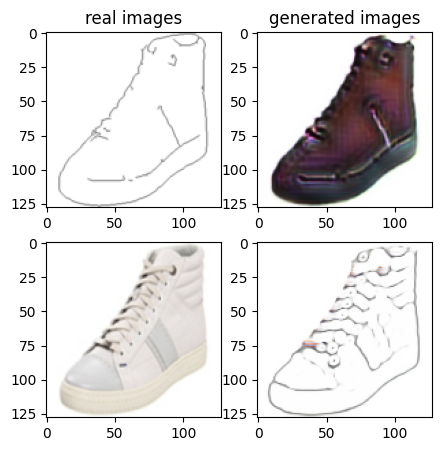

Train Epoch: 1 72% 	Total Loss: 1.305929 	Loss_G_AB: 0.264677	Loss_G_BA: 0.805586	Loss_cycle: 0.464032	Loss_D_A: 0.061944	Loss_D_B: 0.244822
0 36009 T:  1.9851555824279785
Train Epoch: 1 72% 	Total Loss: 1.371378 	Loss_G_AB: 0.283821	Loss_G_BA: 0.832316	Loss_cycle: 0.492266	Loss_D_A: 0.079572	Loss_D_B: 0.241472
0 36019 T:  0.9816005229949951
Train Epoch: 1 72% 	Total Loss: 1.395916 	Loss_G_AB: 0.288717	Loss_G_BA: 0.782412	Loss_cycle: 0.470112	Loss_D_A: 0.152041	Loss_D_B: 0.238199
0 36029 T:  0.9808650016784668
Train Epoch: 1 72% 	Total Loss: 1.350536 	Loss_G_AB: 0.272401	Loss_G_BA: 0.996050	Loss_cycle: 0.444645	Loss_D_A: 0.032369	Loss_D_B: 0.239296
0 36039 T:  0.9842045307159424
Train Epoch: 1 72% 	Total Loss: 1.395212 	Loss_G_AB: 0.289374	Loss_G_BA: 0.950840	Loss_cycle: 0.515020	Loss_D_A: 0.013599	Loss_D_B: 0.246486
0 36049 T:  1.0019042491912842
Train Epoch: 1 72% 	Total Loss: 1.384329 	Loss_G_AB: 0.290788	Loss_G_BA: 0.838025	Loss_cycle: 0.421263	Loss_D_A: 0.150606	Loss_D_B: 0.248053

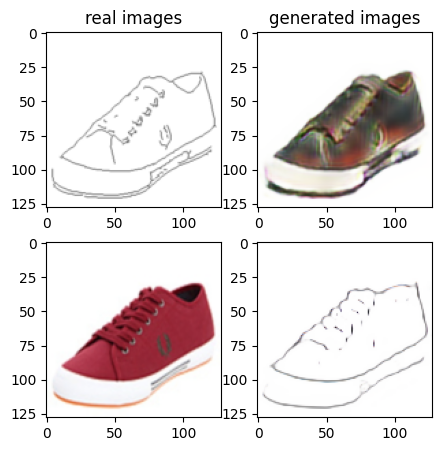

Train Epoch: 1 74% 	Total Loss: 1.480571 	Loss_G_AB: 0.285679	Loss_G_BA: 0.998156	Loss_cycle: 0.576705	Loss_D_A: 0.002040	Loss_D_B: 0.259909
0 37009 T:  1.968322992324829
Train Epoch: 1 74% 	Total Loss: 1.374830 	Loss_G_AB: 0.279064	Loss_G_BA: 1.012156	Loss_cycle: 0.474256	Loss_D_A: 0.002737	Loss_D_B: 0.252227
0 37019 T:  0.9769852161407471
Train Epoch: 1 74% 	Total Loss: 1.391307 	Loss_G_AB: 0.301107	Loss_G_BA: 0.989010	Loss_cycle: 0.509640	Loss_D_A: 0.002821	Loss_D_B: 0.233787
0 37029 T:  0.9969015121459961
Train Epoch: 1 74% 	Total Loss: 1.330383 	Loss_G_AB: 0.299735	Loss_G_BA: 0.985190	Loss_cycle: 0.455546	Loss_D_A: 0.003623	Loss_D_B: 0.228752
0 37039 T:  1.011655330657959
Train Epoch: 1 74% 	Total Loss: 1.376061 	Loss_G_AB: 0.263196	Loss_G_BA: 1.000091	Loss_cycle: 0.466779	Loss_D_A: 0.003353	Loss_D_B: 0.274285
0 37049 T:  1.043440580368042
Train Epoch: 1 74% 	Total Loss: 1.476219 	Loss_G_AB: 0.275563	Loss_G_BA: 0.998589	Loss_cycle: 0.592786	Loss_D_A: 0.003055	Loss_D_B: 0.243302
0 

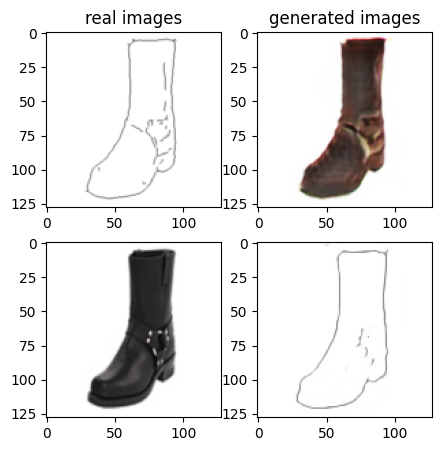

Train Epoch: 1 76% 	Total Loss: 1.329978 	Loss_G_AB: 0.277913	Loss_G_BA: 0.987423	Loss_cycle: 0.451520	Loss_D_A: 0.004069	Loss_D_B: 0.241721
0 38009 T:  2.574357271194458
Train Epoch: 1 76% 	Total Loss: 1.355769 	Loss_G_AB: 0.259033	Loss_G_BA: 0.993242	Loss_cycle: 0.459932	Loss_D_A: 0.003163	Loss_D_B: 0.266536
0 38019 T:  1.0085535049438477
Train Epoch: 1 76% 	Total Loss: 1.329897 	Loss_G_AB: 0.279963	Loss_G_BA: 1.003324	Loss_cycle: 0.433481	Loss_D_A: 0.004200	Loss_D_B: 0.250572
0 38029 T:  1.0000083446502686
Train Epoch: 1 76% 	Total Loss: 1.359422 	Loss_G_AB: 0.283274	Loss_G_BA: 0.999961	Loss_cycle: 0.467678	Loss_D_A: 0.002408	Loss_D_B: 0.247718
0 38039 T:  0.9723341464996338
Train Epoch: 1 76% 	Total Loss: 1.297797 	Loss_G_AB: 0.282682	Loss_G_BA: 1.008634	Loss_cycle: 0.406433	Loss_D_A: 0.003239	Loss_D_B: 0.242467
0 38049 T:  0.9709513187408447
Train Epoch: 1 76% 	Total Loss: 1.395524 	Loss_G_AB: 0.301615	Loss_G_BA: 0.990808	Loss_cycle: 0.508566	Loss_D_A: 0.002004	Loss_D_B: 0.238743


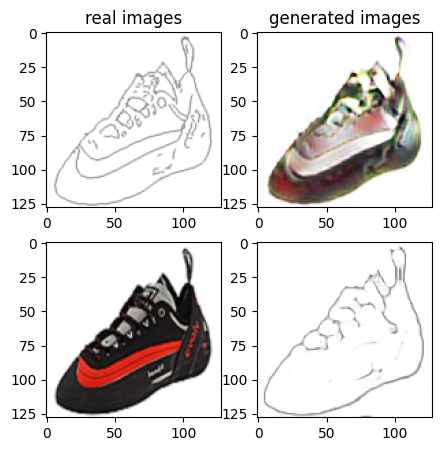

Train Epoch: 1 78% 	Total Loss: 1.277531 	Loss_G_AB: 0.261650	Loss_G_BA: 0.986482	Loss_cycle: 0.405022	Loss_D_A: 0.006205	Loss_D_B: 0.242237
0 39009 T:  1.9874358177185059
Train Epoch: 1 78% 	Total Loss: 1.285817 	Loss_G_AB: 0.274515	Loss_G_BA: 0.937448	Loss_cycle: 0.417828	Loss_D_A: 0.014182	Loss_D_B: 0.247826
0 39019 T:  0.9759230613708496
Train Epoch: 1 78% 	Total Loss: 1.355848 	Loss_G_AB: 0.274392	Loss_G_BA: 0.986485	Loss_cycle: 0.462465	Loss_D_A: 0.017861	Loss_D_B: 0.245083
0 39029 T:  0.982222318649292
Train Epoch: 1 78% 	Total Loss: 1.406305 	Loss_G_AB: 0.278326	Loss_G_BA: 0.978194	Loss_cycle: 0.506345	Loss_D_A: 0.015070	Loss_D_B: 0.256630
0 39039 T:  0.9819130897521973
Train Epoch: 1 78% 	Total Loss: 1.386777 	Loss_G_AB: 0.291875	Loss_G_BA: 1.036407	Loss_cycle: 0.471221	Loss_D_A: 0.003538	Loss_D_B: 0.247877
0 39049 T:  0.9797310829162598
Train Epoch: 1 78% 	Total Loss: 1.301525 	Loss_G_AB: 0.279981	Loss_G_BA: 0.943994	Loss_cycle: 0.391237	Loss_D_A: 0.037908	Loss_D_B: 0.260392


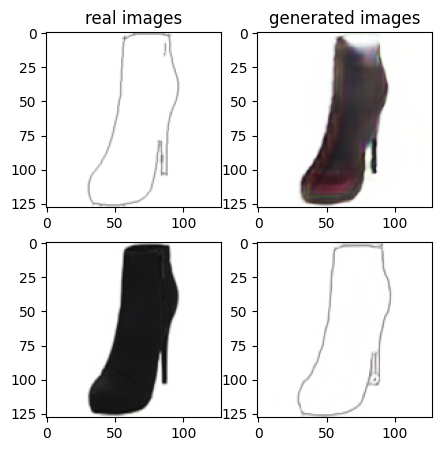

Train Epoch: 1 80% 	Total Loss: 1.449425 	Loss_G_AB: 0.253930	Loss_G_BA: 1.012615	Loss_cycle: 0.550836	Loss_D_A: 0.003218	Loss_D_B: 0.262097
0 40009 T:  1.9755215644836426
Train Epoch: 1 80% 	Total Loss: 1.265658 	Loss_G_AB: 0.283959	Loss_G_BA: 1.003109	Loss_cycle: 0.376980	Loss_D_A: 0.004326	Loss_D_B: 0.240818
0 40019 T:  0.9734148979187012
Train Epoch: 1 80% 	Total Loss: 1.309869 	Loss_G_AB: 0.291049	Loss_G_BA: 1.003013	Loss_cycle: 0.418391	Loss_D_A: 0.002838	Loss_D_B: 0.241609
0 40029 T:  0.9744739532470703
Train Epoch: 1 80% 	Total Loss: 1.308491 	Loss_G_AB: 0.276655	Loss_G_BA: 1.005882	Loss_cycle: 0.399625	Loss_D_A: 0.002412	Loss_D_B: 0.265185
0 40039 T:  0.9855091571807861
Train Epoch: 1 80% 	Total Loss: 1.248877 	Loss_G_AB: 0.282536	Loss_G_BA: 0.992942	Loss_cycle: 0.365935	Loss_D_A: 0.002348	Loss_D_B: 0.242856
0 40049 T:  1.0034945011138916
Train Epoch: 1 80% 	Total Loss: 1.331168 	Loss_G_AB: 0.289662	Loss_G_BA: 0.976890	Loss_cycle: 0.444683	Loss_D_A: 0.003408	Loss_D_B: 0.249801

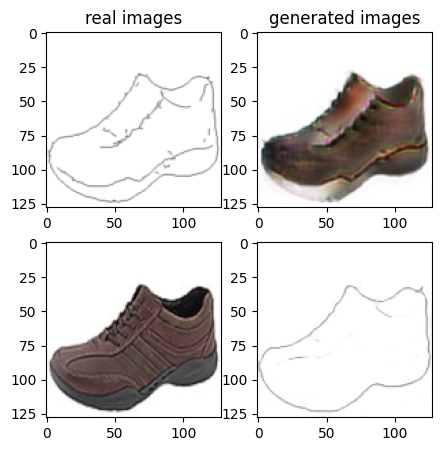

Train Epoch: 1 82% 	Total Loss: 1.340093 	Loss_G_AB: 0.289815	Loss_G_BA: 0.932235	Loss_cycle: 0.466277	Loss_D_A: 0.024896	Loss_D_B: 0.237896
0 41009 T:  1.9596805572509766
Train Epoch: 1 82% 	Total Loss: 1.406024 	Loss_G_AB: 0.277688	Loss_G_BA: 1.038994	Loss_cycle: 0.493839	Loss_D_A: 0.004155	Loss_D_B: 0.249688
0 41019 T:  0.9771730899810791
Train Epoch: 1 82% 	Total Loss: 1.438251 	Loss_G_AB: 0.290110	Loss_G_BA: 0.995682	Loss_cycle: 0.553403	Loss_D_A: 0.002935	Loss_D_B: 0.239017
0 41029 T:  0.9756393432617188
Train Epoch: 1 82% 	Total Loss: 1.348560 	Loss_G_AB: 0.259440	Loss_G_BA: 1.005822	Loss_cycle: 0.449551	Loss_D_A: 0.003874	Loss_D_B: 0.262504
0 41039 T:  0.9920692443847656
Train Epoch: 1 82% 	Total Loss: 1.391922 	Loss_G_AB: 0.330589	Loss_G_BA: 0.970736	Loss_cycle: 0.538796	Loss_D_A: 0.008272	Loss_D_B: 0.194193
0 41049 T:  1.0137262344360352
Train Epoch: 1 82% 	Total Loss: 1.429619 	Loss_G_AB: 0.285599	Loss_G_BA: 1.004633	Loss_cycle: 0.512701	Loss_D_A: 0.007630	Loss_D_B: 0.264172

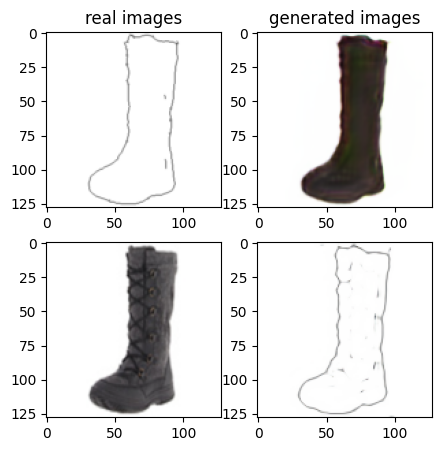

Train Epoch: 1 84% 	Total Loss: 1.326800 	Loss_G_AB: 0.268207	Loss_G_BA: 0.997671	Loss_cycle: 0.440094	Loss_D_A: 0.003745	Loss_D_B: 0.250023
0 42009 T:  2.0860462188720703
Train Epoch: 1 84% 	Total Loss: 1.323434 	Loss_G_AB: 0.274787	Loss_G_BA: 0.994603	Loss_cycle: 0.432043	Loss_D_A: 0.007442	Loss_D_B: 0.249254
0 42019 T:  1.0452549457550049
Train Epoch: 1 84% 	Total Loss: 1.278786 	Loss_G_AB: 0.267621	Loss_G_BA: 0.981813	Loss_cycle: 0.395147	Loss_D_A: 0.009171	Loss_D_B: 0.249751
0 42029 T:  1.0497891902923584
Train Epoch: 1 84% 	Total Loss: 1.459765 	Loss_G_AB: 0.302267	Loss_G_BA: 0.993776	Loss_cycle: 0.573662	Loss_D_A: 0.003291	Loss_D_B: 0.234791
0 42039 T:  1.0695607662200928
Train Epoch: 1 84% 	Total Loss: 1.366274 	Loss_G_AB: 0.253264	Loss_G_BA: 1.006895	Loss_cycle: 0.463608	Loss_D_A: 0.003046	Loss_D_B: 0.269540
0 42049 T:  1.0573179721832275
Train Epoch: 1 84% 	Total Loss: 1.297763 	Loss_G_AB: 0.279090	Loss_G_BA: 0.994035	Loss_cycle: 0.394908	Loss_D_A: 0.005669	Loss_D_B: 0.260623

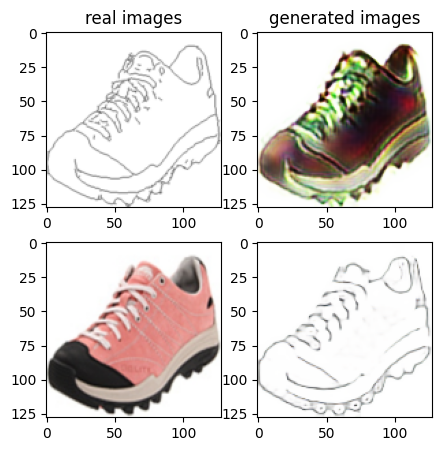

Train Epoch: 1 86% 	Total Loss: 1.356908 	Loss_G_AB: 0.250726	Loss_G_BA: 1.001972	Loss_cycle: 0.458512	Loss_D_A: 0.003347	Loss_D_B: 0.268700
0 43009 T:  2.519719362258911
Train Epoch: 1 86% 	Total Loss: 1.293959 	Loss_G_AB: 0.276123	Loss_G_BA: 0.982332	Loss_cycle: 0.421635	Loss_D_A: 0.002018	Loss_D_B: 0.241079
0 43019 T:  1.0333468914031982
Train Epoch: 1 86% 	Total Loss: 1.330367 	Loss_G_AB: 0.276332	Loss_G_BA: 1.002143	Loss_cycle: 0.423753	Loss_D_A: 0.002901	Loss_D_B: 0.264476
0 43029 T:  1.06304931640625
Train Epoch: 1 86% 	Total Loss: 1.419149 	Loss_G_AB: 0.249553	Loss_G_BA: 0.992481	Loss_cycle: 0.519599	Loss_D_A: 0.008403	Loss_D_B: 0.270130
0 43039 T:  1.012718915939331
Train Epoch: 1 86% 	Total Loss: 1.240138 	Loss_G_AB: 0.283006	Loss_G_BA: 1.001485	Loss_cycle: 0.351902	Loss_D_A: 0.004293	Loss_D_B: 0.241697
0 43049 T:  0.9850833415985107
Train Epoch: 1 86% 	Total Loss: 1.279722 	Loss_G_AB: 0.286830	Loss_G_BA: 0.990965	Loss_cycle: 0.395412	Loss_D_A: 0.006461	Loss_D_B: 0.238952
0 4

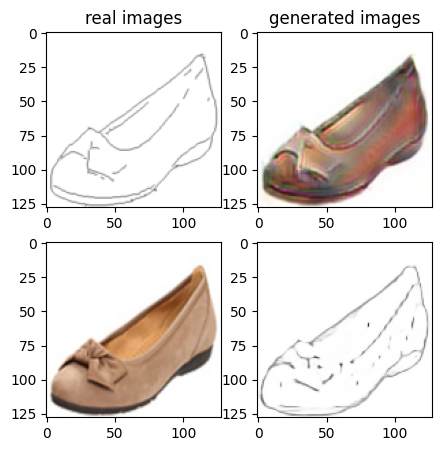

Train Epoch: 1 88% 	Total Loss: 1.381922 	Loss_G_AB: 0.297105	Loss_G_BA: 1.019659	Loss_cycle: 0.479402	Loss_D_A: 0.009553	Loss_D_B: 0.234585
0 44009 T:  2.7703325748443604
Train Epoch: 1 88% 	Total Loss: 1.341549 	Loss_G_AB: 0.289891	Loss_G_BA: 0.986947	Loss_cycle: 0.383279	Loss_D_A: 0.068699	Loss_D_B: 0.251153
0 44019 T:  1.0006306171417236
Train Epoch: 1 88% 	Total Loss: 1.437490 	Loss_G_AB: 0.269990	Loss_G_BA: 0.964095	Loss_cycle: 0.484224	Loss_D_A: 0.073768	Loss_D_B: 0.262456
0 44029 T:  0.9950957298278809
Train Epoch: 1 88% 	Total Loss: 1.347778 	Loss_G_AB: 0.299280	Loss_G_BA: 1.005567	Loss_cycle: 0.451903	Loss_D_A: 0.006193	Loss_D_B: 0.237260
0 44039 T:  0.9983174800872803
Train Epoch: 1 88% 	Total Loss: 1.287117 	Loss_G_AB: 0.261793	Loss_G_BA: 0.898172	Loss_cycle: 0.369960	Loss_D_A: 0.074421	Loss_D_B: 0.262753
0 44049 T:  0.9855184555053711
Train Epoch: 1 88% 	Total Loss: 1.362126 	Loss_G_AB: 0.347466	Loss_G_BA: 0.752432	Loss_cycle: 0.441079	Loss_D_A: 0.168754	Loss_D_B: 0.202344

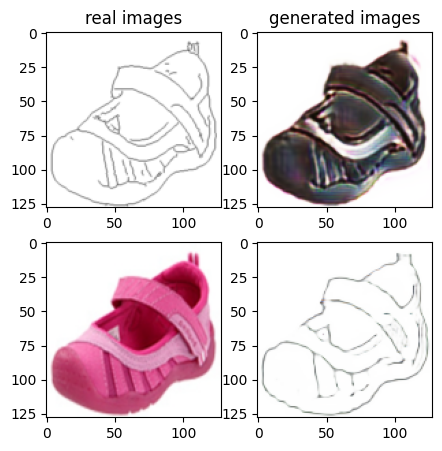

Train Epoch: 1 90% 	Total Loss: 1.394587 	Loss_G_AB: 0.338636	Loss_G_BA: 1.000572	Loss_cycle: 0.472495	Loss_D_A: 0.001499	Loss_D_B: 0.250989
0 45009 T:  2.0301601886749268
Train Epoch: 1 90% 	Total Loss: 1.247849 	Loss_G_AB: 0.265305	Loss_G_BA: 0.994054	Loss_cycle: 0.358027	Loss_D_A: 0.001734	Loss_D_B: 0.258409
0 45019 T:  0.9886138439178467
Train Epoch: 1 90% 	Total Loss: 1.296619 	Loss_G_AB: 0.339644	Loss_G_BA: 0.997815	Loss_cycle: 0.422156	Loss_D_A: 0.002103	Loss_D_B: 0.203631
0 45029 T:  0.9854161739349365
Train Epoch: 1 90% 	Total Loss: 1.359579 	Loss_G_AB: 0.249499	Loss_G_BA: 0.998956	Loss_cycle: 0.452725	Loss_D_A: 0.002154	Loss_D_B: 0.280472
0 45039 T:  0.9881117343902588
Train Epoch: 1 90% 	Total Loss: 1.411541 	Loss_G_AB: 0.278848	Loss_G_BA: 0.981055	Loss_cycle: 0.529792	Loss_D_A: 0.004009	Loss_D_B: 0.247789
0 45049 T:  0.9930665493011475
Train Epoch: 1 90% 	Total Loss: 1.333289 	Loss_G_AB: 0.268271	Loss_G_BA: 0.992813	Loss_cycle: 0.438158	Loss_D_A: 0.002632	Loss_D_B: 0.261957

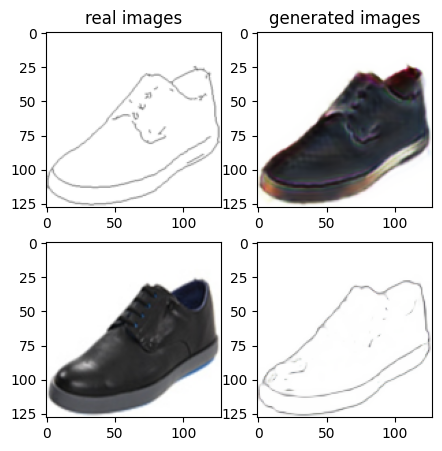

Train Epoch: 1 92% 	Total Loss: 1.363734 	Loss_G_AB: 0.308628	Loss_G_BA: 0.942957	Loss_cycle: 0.446660	Loss_D_A: 0.046310	Loss_D_B: 0.244972
0 46009 T:  1.9873838424682617
Train Epoch: 1 92% 	Total Loss: 1.236830 	Loss_G_AB: 0.278791	Loss_G_BA: 0.912787	Loss_cycle: 0.337457	Loss_D_A: 0.060792	Loss_D_B: 0.242791
0 46019 T:  0.9824771881103516
Train Epoch: 1 92% 	Total Loss: 1.283468 	Loss_G_AB: 0.304717	Loss_G_BA: 0.895529	Loss_cycle: 0.384974	Loss_D_A: 0.025615	Loss_D_B: 0.272756
0 46029 T:  0.9775655269622803
Train Epoch: 1 92% 	Total Loss: 1.396423 	Loss_G_AB: 0.267837	Loss_G_BA: 1.014742	Loss_cycle: 0.426850	Loss_D_A: 0.070124	Loss_D_B: 0.258160
0 46039 T:  0.9904122352600098
Train Epoch: 1 92% 	Total Loss: 1.390327 	Loss_G_AB: 0.244971	Loss_G_BA: 1.024754	Loss_cycle: 0.464071	Loss_D_A: 0.010733	Loss_D_B: 0.280661
0 46049 T:  1.026094675064087
Train Epoch: 1 92% 	Total Loss: 1.334582 	Loss_G_AB: 0.281818	Loss_G_BA: 0.919033	Loss_cycle: 0.441595	Loss_D_A: 0.038431	Loss_D_B: 0.254130


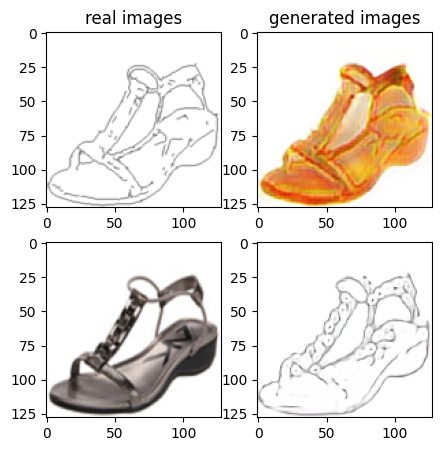

Train Epoch: 1 94% 	Total Loss: 1.280936 	Loss_G_AB: 0.306684	Loss_G_BA: 0.994733	Loss_cycle: 0.401851	Loss_D_A: 0.003168	Loss_D_B: 0.225209
0 47009 T:  1.9829494953155518
Train Epoch: 1 94% 	Total Loss: 1.291834 	Loss_G_AB: 0.296864	Loss_G_BA: 0.990101	Loss_cycle: 0.404619	Loss_D_A: 0.002781	Loss_D_B: 0.240951
0 47019 T:  0.980719804763794
Train Epoch: 1 94% 	Total Loss: 1.321845 	Loss_G_AB: 0.271364	Loss_G_BA: 0.988931	Loss_cycle: 0.436892	Loss_D_A: 0.006503	Loss_D_B: 0.248303
0 47029 T:  0.9985651969909668
Train Epoch: 1 94% 	Total Loss: 1.249942 	Loss_G_AB: 0.299555	Loss_G_BA: 1.003013	Loss_cycle: 0.330811	Loss_D_A: 0.003829	Loss_D_B: 0.264019
0 47039 T:  1.0195224285125732
Train Epoch: 1 94% 	Total Loss: 1.258633 	Loss_G_AB: 0.268433	Loss_G_BA: 0.989208	Loss_cycle: 0.382254	Loss_D_A: 0.003407	Loss_D_B: 0.244152
0 47049 T:  1.1180522441864014
Train Epoch: 1 94% 	Total Loss: 1.310610 	Loss_G_AB: 0.260167	Loss_G_BA: 0.961058	Loss_cycle: 0.426029	Loss_D_A: 0.020118	Loss_D_B: 0.253851


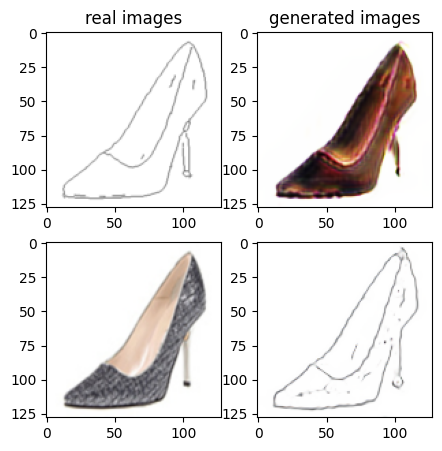

Train Epoch: 1 96% 	Total Loss: 1.377154 	Loss_G_AB: 0.292706	Loss_G_BA: 1.043583	Loss_cycle: 0.462076	Loss_D_A: 0.004231	Loss_D_B: 0.242702
0 48009 T:  2.0947365760803223
Train Epoch: 1 96% 	Total Loss: 1.216547 	Loss_G_AB: 0.275757	Loss_G_BA: 0.986428	Loss_cycle: 0.337943	Loss_D_A: 0.002528	Loss_D_B: 0.244984
0 48019 T:  1.022190809249878
Train Epoch: 1 96% 	Total Loss: 1.346422 	Loss_G_AB: 0.281962	Loss_G_BA: 1.010971	Loss_cycle: 0.453272	Loss_D_A: 0.004824	Loss_D_B: 0.241859
0 48029 T:  0.9993865489959717
Train Epoch: 1 96% 	Total Loss: 1.450736 	Loss_G_AB: 0.314772	Loss_G_BA: 0.989121	Loss_cycle: 0.549607	Loss_D_A: 0.002596	Loss_D_B: 0.246587
0 48039 T:  1.0095911026000977
Train Epoch: 1 96% 	Total Loss: 1.364384 	Loss_G_AB: 0.285277	Loss_G_BA: 0.999992	Loss_cycle: 0.470944	Loss_D_A: 0.002741	Loss_D_B: 0.248064
0 48049 T:  0.9970114231109619
Train Epoch: 1 96% 	Total Loss: 1.331908 	Loss_G_AB: 0.268762	Loss_G_BA: 0.996837	Loss_cycle: 0.400763	Loss_D_A: 0.009009	Loss_D_B: 0.289337


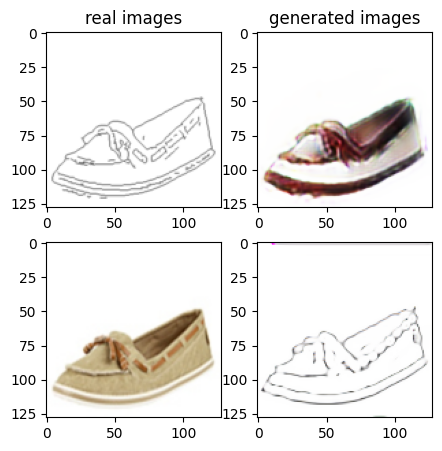

Train Epoch: 1 98% 	Total Loss: 1.387083 	Loss_G_AB: 0.290874	Loss_G_BA: 1.019373	Loss_cycle: 0.473118	Loss_D_A: 0.006062	Loss_D_B: 0.252779
0 49009 T:  2.395646333694458
Train Epoch: 1 98% 	Total Loss: 1.272690 	Loss_G_AB: 0.271118	Loss_G_BA: 0.984573	Loss_cycle: 0.380884	Loss_D_A: 0.003548	Loss_D_B: 0.260413
0 49019 T:  0.9915509223937988
Train Epoch: 1 98% 	Total Loss: 1.343467 	Loss_G_AB: 0.311145	Loss_G_BA: 1.054588	Loss_cycle: 0.417053	Loss_D_A: 0.010354	Loss_D_B: 0.233193
0 49029 T:  0.9765887260437012
Train Epoch: 1 98% 	Total Loss: 1.211922 	Loss_G_AB: 0.276113	Loss_G_BA: 1.015900	Loss_cycle: 0.311188	Loss_D_A: 0.002613	Loss_D_B: 0.252113
0 49039 T:  0.9692385196685791
Train Epoch: 1 98% 	Total Loss: 1.309917 	Loss_G_AB: 0.261119	Loss_G_BA: 0.991404	Loss_cycle: 0.424482	Loss_D_A: 0.004223	Loss_D_B: 0.254950
0 49049 T:  0.9756546020507812
Train Epoch: 1 98% 	Total Loss: 1.296247 	Loss_G_AB: 0.322953	Loss_G_BA: 0.993835	Loss_cycle: 0.400139	Loss_D_A: 0.004330	Loss_D_B: 0.233385


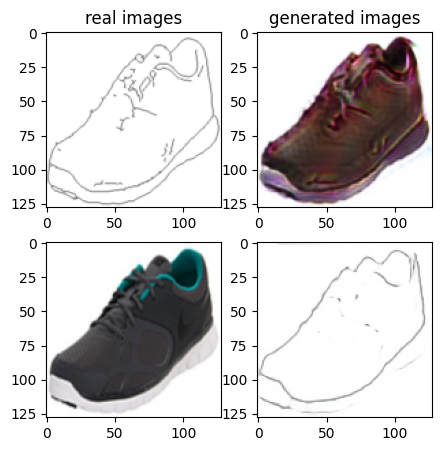

Train Epoch: 2 0% 	Total Loss: 1.487869 	Loss_G_AB: 0.342488	Loss_G_BA: 1.066171	Loss_cycle: 0.533689	Loss_D_A: 0.024219	Loss_D_B: 0.225632
1 50009 T:  2.1279687881469727
Train Epoch: 2 0% 	Total Loss: 1.284369 	Loss_G_AB: 0.295955	Loss_G_BA: 0.802526	Loss_cycle: 0.399415	Loss_D_A: 0.083135	Loss_D_B: 0.252578
1 50019 T:  0.9821877479553223
Train Epoch: 2 0% 	Total Loss: 1.329827 	Loss_G_AB: 0.321383	Loss_G_BA: 1.008778	Loss_cycle: 0.375206	Loss_D_A: 0.026560	Loss_D_B: 0.262980
1 50029 T:  0.9761643409729004
Train Epoch: 2 0% 	Total Loss: 1.380812 	Loss_G_AB: 0.263206	Loss_G_BA: 0.971177	Loss_cycle: 0.477304	Loss_D_A: 0.015279	Loss_D_B: 0.271037
1 50039 T:  0.9751772880554199
Train Epoch: 2 0% 	Total Loss: 1.305630 	Loss_G_AB: 0.282580	Loss_G_BA: 0.969409	Loss_cycle: 0.418759	Loss_D_A: 0.009249	Loss_D_B: 0.251627
1 50049 T:  0.9883823394775391
Train Epoch: 2 0% 	Total Loss: 1.366446 	Loss_G_AB: 0.255870	Loss_G_BA: 0.996246	Loss_cycle: 0.465380	Loss_D_A: 0.007432	Loss_D_B: 0.267576
1 500

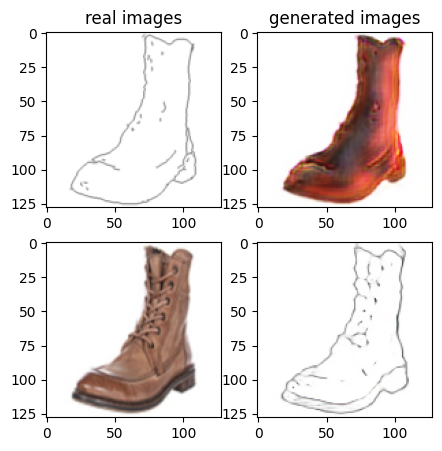

Train Epoch: 2 2% 	Total Loss: 1.333422 	Loss_G_AB: 0.314483	Loss_G_BA: 1.027940	Loss_cycle: 0.410135	Loss_D_A: 0.004663	Loss_D_B: 0.247413
1 51009 T:  1.9634833335876465
Train Epoch: 2 2% 	Total Loss: 1.255235 	Loss_G_AB: 0.267396	Loss_G_BA: 0.995928	Loss_cycle: 0.352822	Loss_D_A: 0.008034	Loss_D_B: 0.262717
1 51019 T:  0.9750938415527344
Train Epoch: 2 2% 	Total Loss: 1.429722 	Loss_G_AB: 0.301631	Loss_G_BA: 1.009496	Loss_cycle: 0.518096	Loss_D_A: 0.005758	Loss_D_B: 0.250304
1 51029 T:  0.9709336757659912
Train Epoch: 2 2% 	Total Loss: 1.382230 	Loss_G_AB: 0.295866	Loss_G_BA: 0.961139	Loss_cycle: 0.490585	Loss_D_A: 0.004712	Loss_D_B: 0.258430
1 51039 T:  0.9736571311950684
Train Epoch: 2 2% 	Total Loss: 1.260336 	Loss_G_AB: 0.312907	Loss_G_BA: 1.000210	Loss_cycle: 0.374956	Loss_D_A: 0.004198	Loss_D_B: 0.224624
1 51049 T:  0.9907350540161133
Train Epoch: 2 2% 	Total Loss: 1.321693 	Loss_G_AB: 0.304281	Loss_G_BA: 0.992425	Loss_cycle: 0.432631	Loss_D_A: 0.010291	Loss_D_B: 0.230418
1 510

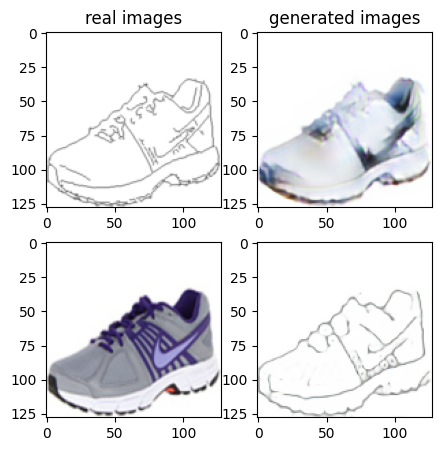

Train Epoch: 2 4% 	Total Loss: 1.300658 	Loss_G_AB: 0.271368	Loss_G_BA: 0.967683	Loss_cycle: 0.419958	Loss_D_A: 0.005992	Loss_D_B: 0.255183
1 52009 T:  1.9557240009307861
Train Epoch: 2 4% 	Total Loss: 1.321236 	Loss_G_AB: 0.265059	Loss_G_BA: 0.954519	Loss_cycle: 0.447026	Loss_D_A: 0.006806	Loss_D_B: 0.257615
1 52019 T:  0.9751672744750977
Train Epoch: 2 4% 	Total Loss: 1.313894 	Loss_G_AB: 0.276339	Loss_G_BA: 0.987787	Loss_cycle: 0.422711	Loss_D_A: 0.008623	Loss_D_B: 0.250497
1 52029 T:  0.9835734367370605
Train Epoch: 2 4% 	Total Loss: 1.219896 	Loss_G_AB: 0.269746	Loss_G_BA: 0.887516	Loss_cycle: 0.336700	Loss_D_A: 0.046351	Loss_D_B: 0.258213
1 52039 T:  0.9930777549743652
Train Epoch: 2 4% 	Total Loss: 1.269163 	Loss_G_AB: 0.259972	Loss_G_BA: 0.864802	Loss_cycle: 0.415438	Loss_D_A: 0.035773	Loss_D_B: 0.255564
1 52049 T:  1.10331392288208
Train Epoch: 2 4% 	Total Loss: 1.307010 	Loss_G_AB: 0.286721	Loss_G_BA: 1.016597	Loss_cycle: 0.386563	Loss_D_A: 0.026714	Loss_D_B: 0.242075
1 52059

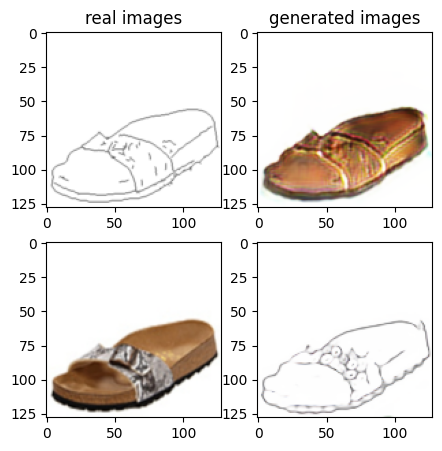

Train Epoch: 2 6% 	Total Loss: 1.410161 	Loss_G_AB: 0.275184	Loss_G_BA: 1.003921	Loss_cycle: 0.509466	Loss_D_A: 0.001590	Loss_D_B: 0.259554
1 53009 T:  2.221219301223755
Train Epoch: 2 6% 	Total Loss: 1.232887 	Loss_G_AB: 0.300946	Loss_G_BA: 0.990814	Loss_cycle: 0.342205	Loss_D_A: 0.002622	Loss_D_B: 0.242179
1 53019 T:  1.0084221363067627
Train Epoch: 2 6% 	Total Loss: 1.305943 	Loss_G_AB: 0.304937	Loss_G_BA: 0.990016	Loss_cycle: 0.398420	Loss_D_A: 0.002561	Loss_D_B: 0.257485
1 53029 T:  1.023859977722168
Train Epoch: 2 6% 	Total Loss: 1.204146 	Loss_G_AB: 0.286723	Loss_G_BA: 0.997085	Loss_cycle: 0.311911	Loss_D_A: 0.003194	Loss_D_B: 0.247136
1 53039 T:  0.9715433120727539
Train Epoch: 2 6% 	Total Loss: 1.398112 	Loss_G_AB: 0.310744	Loss_G_BA: 1.009922	Loss_cycle: 0.480863	Loss_D_A: 0.006938	Loss_D_B: 0.249978
1 53049 T:  0.9898912906646729
Train Epoch: 2 6% 	Total Loss: 1.256230 	Loss_G_AB: 0.353001	Loss_G_BA: 1.008193	Loss_cycle: 0.358342	Loss_D_A: 0.002551	Loss_D_B: 0.214740
1 53059

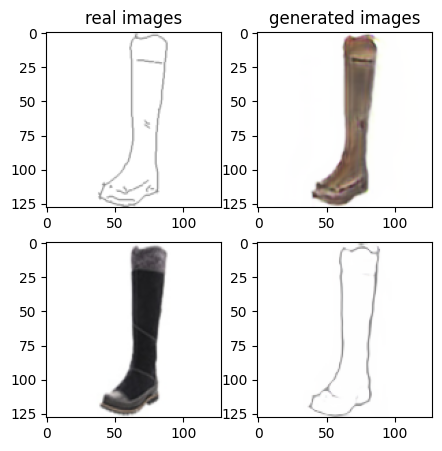

Train Epoch: 2 8% 	Total Loss: 1.263859 	Loss_G_AB: 0.275088	Loss_G_BA: 0.987481	Loss_cycle: 0.347279	Loss_D_A: 0.002700	Loss_D_B: 0.282596
1 54009 T:  2.3615329265594482
Train Epoch: 2 8% 	Total Loss: 1.319172 	Loss_G_AB: 0.312532	Loss_G_BA: 0.991920	Loss_cycle: 0.419992	Loss_D_A: 0.004091	Loss_D_B: 0.242863
1 54019 T:  0.9760141372680664
Train Epoch: 2 8% 	Total Loss: 1.324387 	Loss_G_AB: 0.286961	Loss_G_BA: 1.014909	Loss_cycle: 0.420644	Loss_D_A: 0.003252	Loss_D_B: 0.249556
1 54029 T:  0.9735753536224365
Train Epoch: 2 8% 	Total Loss: 1.293520 	Loss_G_AB: 0.272414	Loss_G_BA: 0.963690	Loss_cycle: 0.415871	Loss_D_A: 0.008928	Loss_D_B: 0.250669
1 54039 T:  0.978863000869751
Train Epoch: 2 8% 	Total Loss: 1.254873 	Loss_G_AB: 0.283024	Loss_G_BA: 0.977491	Loss_cycle: 0.372875	Loss_D_A: 0.004609	Loss_D_B: 0.247131
1 54049 T:  0.9750404357910156
Train Epoch: 2 8% 	Total Loss: 1.281075 	Loss_G_AB: 0.262170	Loss_G_BA: 0.997671	Loss_cycle: 0.388547	Loss_D_A: 0.010038	Loss_D_B: 0.252570
1 5405

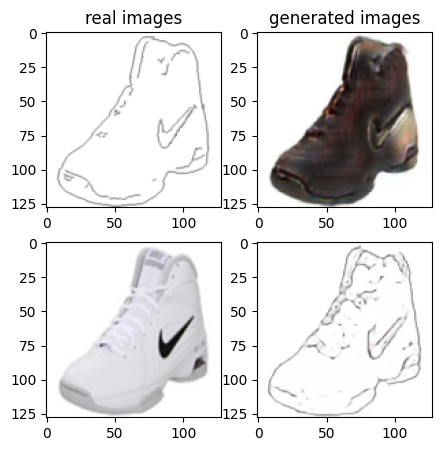

Train Epoch: 2 10% 	Total Loss: 1.308238 	Loss_G_AB: 0.250061	Loss_G_BA: 0.979391	Loss_cycle: 0.368858	Loss_D_A: 0.006876	Loss_D_B: 0.317779
1 55009 T:  2.0094714164733887
Train Epoch: 2 10% 	Total Loss: 1.276038 	Loss_G_AB: 0.281692	Loss_G_BA: 0.956387	Loss_cycle: 0.398237	Loss_D_A: 0.007148	Loss_D_B: 0.251614
1 55019 T:  0.9737143516540527
Train Epoch: 2 10% 	Total Loss: 1.234745 	Loss_G_AB: 0.286725	Loss_G_BA: 0.999461	Loss_cycle: 0.337621	Loss_D_A: 0.008315	Loss_D_B: 0.245716
1 55029 T:  0.9758086204528809
Train Epoch: 2 10% 	Total Loss: 1.359312 	Loss_G_AB: 0.308595	Loss_G_BA: 1.019515	Loss_cycle: 0.475370	Loss_D_A: 0.004015	Loss_D_B: 0.215873
1 55039 T:  0.9790763854980469
Train Epoch: 2 10% 	Total Loss: 1.290491 	Loss_G_AB: 0.265447	Loss_G_BA: 1.008212	Loss_cycle: 0.383720	Loss_D_A: 0.002516	Loss_D_B: 0.267426
1 55049 T:  0.9832203388214111
Train Epoch: 2 11% 	Total Loss: 1.259216 	Loss_G_AB: 0.289167	Loss_G_BA: 0.988957	Loss_cycle: 0.363111	Loss_D_A: 0.002857	Loss_D_B: 0.254186

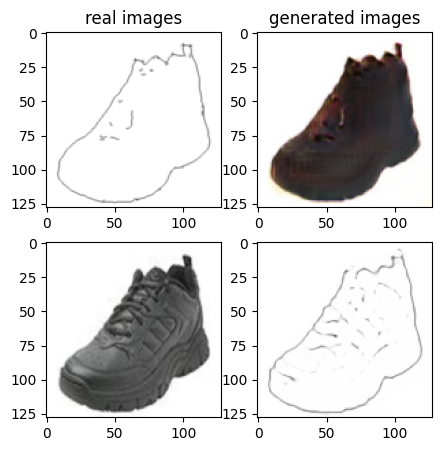

Train Epoch: 2 12% 	Total Loss: 1.243602 	Loss_G_AB: 0.320777	Loss_G_BA: 0.964321	Loss_cycle: 0.324410	Loss_D_A: 0.004422	Loss_D_B: 0.272221
1 56009 T:  2.111959218978882
Train Epoch: 2 12% 	Total Loss: 1.427841 	Loss_G_AB: 0.238687	Loss_G_BA: 1.022312	Loss_cycle: 0.503492	Loss_D_A: 0.003408	Loss_D_B: 0.290442
1 56019 T:  0.9783453941345215
Train Epoch: 2 12% 	Total Loss: 1.265199 	Loss_G_AB: 0.328823	Loss_G_BA: 1.006282	Loss_cycle: 0.367108	Loss_D_A: 0.002775	Loss_D_B: 0.227764
1 56029 T:  0.9832510948181152
Train Epoch: 2 12% 	Total Loss: 1.294187 	Loss_G_AB: 0.310636	Loss_G_BA: 0.999414	Loss_cycle: 0.402444	Loss_D_A: 0.001984	Loss_D_B: 0.234733
1 56039 T:  0.976679801940918
Train Epoch: 2 12% 	Total Loss: 1.302547 	Loss_G_AB: 0.293161	Loss_G_BA: 0.981847	Loss_cycle: 0.421353	Loss_D_A: 0.002191	Loss_D_B: 0.241499
1 56049 T:  0.9987716674804688
Train Epoch: 2 13% 	Total Loss: 1.279155 	Loss_G_AB: 0.311840	Loss_G_BA: 1.012110	Loss_cycle: 0.355878	Loss_D_A: 0.003581	Loss_D_B: 0.257721
1

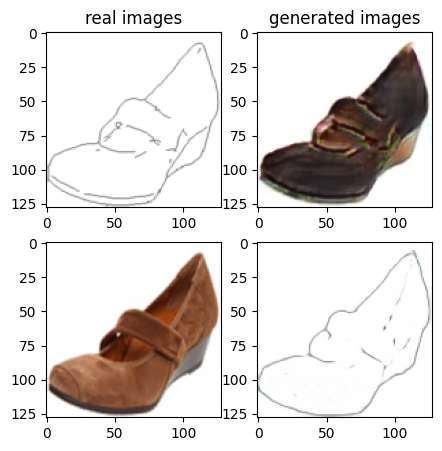

Train Epoch: 2 14% 	Total Loss: 1.190628 	Loss_G_AB: 0.301830	Loss_G_BA: 0.981002	Loss_cycle: 0.307700	Loss_D_A: 0.003617	Loss_D_B: 0.237895
1 57009 T:  2.0463244915008545
Train Epoch: 2 14% 	Total Loss: 1.329491 	Loss_G_AB: 0.288904	Loss_G_BA: 1.002917	Loss_cycle: 0.441739	Loss_D_A: 0.002358	Loss_D_B: 0.239483
1 57019 T:  0.9859182834625244
Train Epoch: 2 14% 	Total Loss: 1.284325 	Loss_G_AB: 0.268857	Loss_G_BA: 1.001688	Loss_cycle: 0.374348	Loss_D_A: 0.003491	Loss_D_B: 0.271213
1 57029 T:  0.9828109741210938
Train Epoch: 2 14% 	Total Loss: 1.240744 	Loss_G_AB: 0.282822	Loss_G_BA: 0.989527	Loss_cycle: 0.371374	Loss_D_A: 0.003300	Loss_D_B: 0.229895
1 57039 T:  0.977449893951416
Train Epoch: 2 14% 	Total Loss: 1.309469 	Loss_G_AB: 0.307356	Loss_G_BA: 0.987606	Loss_cycle: 0.416939	Loss_D_A: 0.002311	Loss_D_B: 0.242738
1 57049 T:  1.0745093822479248
Train Epoch: 2 15% 	Total Loss: 1.261307 	Loss_G_AB: 0.287721	Loss_G_BA: 1.012484	Loss_cycle: 0.375072	Loss_D_A: 0.002368	Loss_D_B: 0.233765


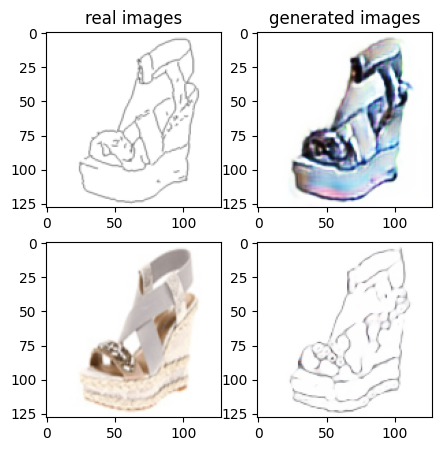

Train Epoch: 2 16% 	Total Loss: 1.361145 	Loss_G_AB: 0.387343	Loss_G_BA: 0.969485	Loss_cycle: 0.449456	Loss_D_A: 0.016998	Loss_D_B: 0.216277
1 58009 T:  2.020289659500122
Train Epoch: 2 16% 	Total Loss: 1.409892 	Loss_G_AB: 0.399601	Loss_G_BA: 0.997996	Loss_cycle: 0.499989	Loss_D_A: 0.011187	Loss_D_B: 0.199918
1 58019 T:  0.9822444915771484
Train Epoch: 2 16% 	Total Loss: 1.305947 	Loss_G_AB: 0.285826	Loss_G_BA: 0.987934	Loss_cycle: 0.364197	Loss_D_A: 0.009688	Loss_D_B: 0.295183
1 58029 T:  0.997443437576294
Train Epoch: 2 16% 	Total Loss: 1.280880 	Loss_G_AB: 0.277075	Loss_G_BA: 1.006032	Loss_cycle: 0.384028	Loss_D_A: 0.001815	Loss_D_B: 0.253483
1 58039 T:  0.9969198703765869
Train Epoch: 2 17% 	Total Loss: 1.260242 	Loss_G_AB: 0.286113	Loss_G_BA: 0.984945	Loss_cycle: 0.383208	Loss_D_A: 0.002036	Loss_D_B: 0.239469
1 58049 T:  1.0544087886810303
Train Epoch: 2 17% 	Total Loss: 1.321507 	Loss_G_AB: 0.330331	Loss_G_BA: 1.006210	Loss_cycle: 0.415691	Loss_D_A: 0.002279	Loss_D_B: 0.235266
1

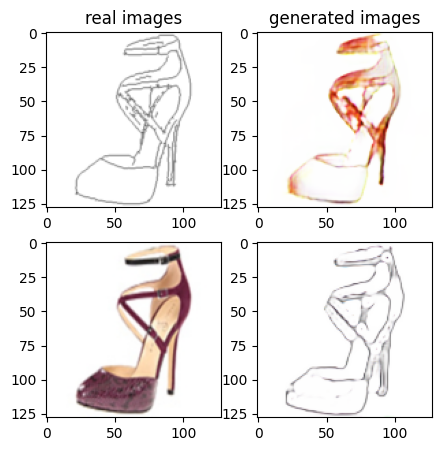

Train Epoch: 2 18% 	Total Loss: 1.367944 	Loss_G_AB: 0.321503	Loss_G_BA: 1.001614	Loss_cycle: 0.447256	Loss_D_A: 0.003853	Loss_D_B: 0.255277
1 59009 T:  2.1001901626586914
Train Epoch: 2 18% 	Total Loss: 1.279456 	Loss_G_AB: 0.268691	Loss_G_BA: 0.983271	Loss_cycle: 0.372619	Loss_D_A: 0.002257	Loss_D_B: 0.278599
1 59019 T:  1.0119600296020508
Train Epoch: 2 18% 	Total Loss: 1.289430 	Loss_G_AB: 0.288824	Loss_G_BA: 1.002977	Loss_cycle: 0.393731	Loss_D_A: 0.002665	Loss_D_B: 0.247134
1 59029 T:  1.025681495666504
Train Epoch: 2 18% 	Total Loss: 1.351282 	Loss_G_AB: 0.315586	Loss_G_BA: 0.987279	Loss_cycle: 0.480449	Loss_D_A: 0.002679	Loss_D_B: 0.216721
1 59039 T:  1.0835354328155518
Train Epoch: 2 19% 	Total Loss: 1.334320 	Loss_G_AB: 0.380851	Loss_G_BA: 0.979529	Loss_cycle: 0.443862	Loss_D_A: 0.011523	Loss_D_B: 0.198745
1 59049 T:  0.9920485019683838
Train Epoch: 2 19% 	Total Loss: 1.439447 	Loss_G_AB: 0.364070	Loss_G_BA: 1.023925	Loss_cycle: 0.477811	Loss_D_A: 0.006947	Loss_D_B: 0.260691


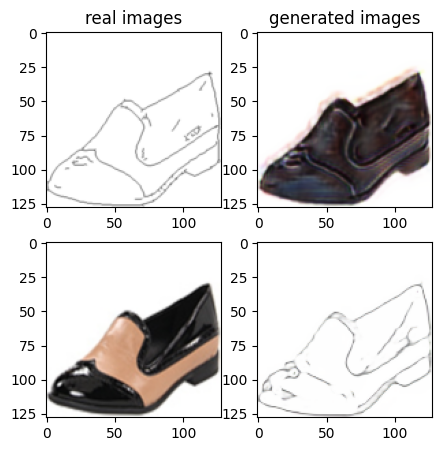

Train Epoch: 2 20% 	Total Loss: 1.363296 	Loss_G_AB: 0.316684	Loss_G_BA: 1.007937	Loss_cycle: 0.428376	Loss_D_A: 0.017417	Loss_D_B: 0.255194
1 60009 T:  2.5640978813171387
Train Epoch: 2 20% 	Total Loss: 1.343214 	Loss_G_AB: 0.261267	Loss_G_BA: 0.947351	Loss_cycle: 0.390249	Loss_D_A: 0.031925	Loss_D_B: 0.316731
1 60019 T:  1.0177674293518066
Train Epoch: 2 20% 	Total Loss: 1.314540 	Loss_G_AB: 0.340131	Loss_G_BA: 0.986586	Loss_cycle: 0.440954	Loss_D_A: 0.024075	Loss_D_B: 0.186153
1 60029 T:  0.9703798294067383
Train Epoch: 2 20% 	Total Loss: 1.331578 	Loss_G_AB: 0.311448	Loss_G_BA: 0.939689	Loss_cycle: 0.421817	Loss_D_A: 0.012143	Loss_D_B: 0.272049
1 60039 T:  0.9855866432189941
Train Epoch: 2 21% 	Total Loss: 1.372476 	Loss_G_AB: 0.293793	Loss_G_BA: 1.004270	Loss_cycle: 0.398078	Loss_D_A: 0.089287	Loss_D_B: 0.236080
1 60049 T:  0.9795844554901123
Train Epoch: 2 21% 	Total Loss: 1.369924 	Loss_G_AB: 0.293625	Loss_G_BA: 0.907709	Loss_cycle: 0.453593	Loss_D_A: 0.064084	Loss_D_B: 0.251580

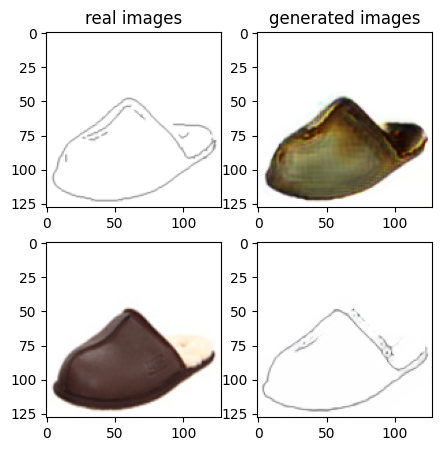

Train Epoch: 2 22% 	Total Loss: 1.253822 	Loss_G_AB: 0.279399	Loss_G_BA: 0.993284	Loss_cycle: 0.369635	Loss_D_A: 0.001554	Loss_D_B: 0.246292
1 61009 T:  2.280057191848755
Train Epoch: 2 22% 	Total Loss: 1.215203 	Loss_G_AB: 0.322115	Loss_G_BA: 0.883137	Loss_cycle: 0.323088	Loss_D_A: 0.045675	Loss_D_B: 0.243813
1 61019 T:  0.9752309322357178
Train Epoch: 2 22% 	Total Loss: 1.331709 	Loss_G_AB: 0.270562	Loss_G_BA: 0.925709	Loss_cycle: 0.417380	Loss_D_A: 0.052030	Loss_D_B: 0.264164
1 61029 T:  1.0234723091125488
Train Epoch: 2 23% 	Total Loss: 1.306940 	Loss_G_AB: 0.263561	Loss_G_BA: 0.948480	Loss_cycle: 0.435202	Loss_D_A: 0.012579	Loss_D_B: 0.253139
1 61039 T:  0.9920957088470459
Train Epoch: 2 23% 	Total Loss: 1.324692 	Loss_G_AB: 0.286728	Loss_G_BA: 0.843573	Loss_cycle: 0.461810	Loss_D_A: 0.048295	Loss_D_B: 0.249437
1 61049 T:  0.9762122631072998
Train Epoch: 2 23% 	Total Loss: 1.292658 	Loss_G_AB: 0.272372	Loss_G_BA: 1.047758	Loss_cycle: 0.366455	Loss_D_A: 0.013941	Loss_D_B: 0.252197


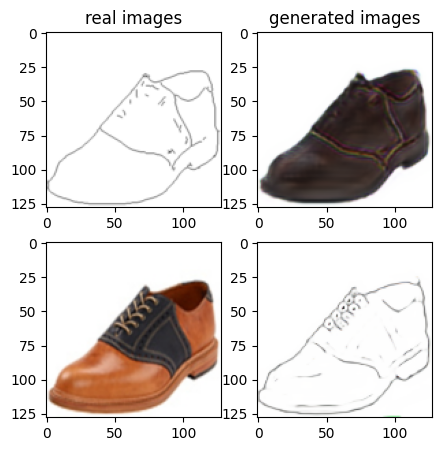

Train Epoch: 2 24% 	Total Loss: 1.328186 	Loss_G_AB: 0.319746	Loss_G_BA: 1.006401	Loss_cycle: 0.414729	Loss_D_A: 0.002989	Loss_D_B: 0.247395
1 62009 T:  2.1231439113616943
Train Epoch: 2 24% 	Total Loss: 1.343594 	Loss_G_AB: 0.294441	Loss_G_BA: 0.998361	Loss_cycle: 0.419614	Loss_D_A: 0.003739	Loss_D_B: 0.273840
1 62019 T:  0.9944157600402832
Train Epoch: 2 24% 	Total Loss: 1.200395 	Loss_G_AB: 0.291325	Loss_G_BA: 0.992529	Loss_cycle: 0.310681	Loss_D_A: 0.005625	Loss_D_B: 0.242162
1 62029 T:  0.9869499206542969
Train Epoch: 2 25% 	Total Loss: 1.281301 	Loss_G_AB: 0.264182	Loss_G_BA: 1.030344	Loss_cycle: 0.376592	Loss_D_A: 0.005355	Loss_D_B: 0.252091
1 62039 T:  0.9958860874176025
Train Epoch: 2 25% 	Total Loss: 1.302638 	Loss_G_AB: 0.347090	Loss_G_BA: 1.002828	Loss_cycle: 0.398660	Loss_D_A: 0.002983	Loss_D_B: 0.226035
1 62049 T:  1.0167529582977295
Train Epoch: 2 25% 	Total Loss: 1.246665 	Loss_G_AB: 0.282456	Loss_G_BA: 0.997128	Loss_cycle: 0.342627	Loss_D_A: 0.001785	Loss_D_B: 0.262460

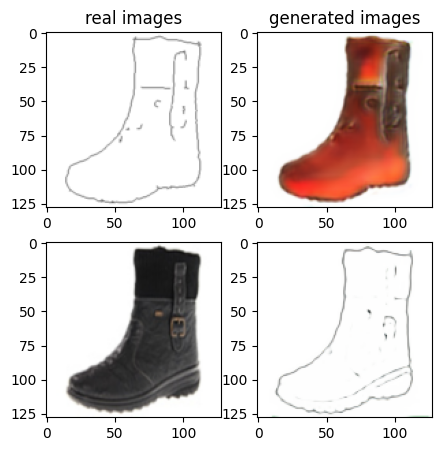

Train Epoch: 2 26% 	Total Loss: 1.214304 	Loss_G_AB: 0.377562	Loss_G_BA: 0.983242	Loss_cycle: 0.329809	Loss_D_A: 0.007380	Loss_D_B: 0.196713
1 63009 T:  2.208606243133545
Train Epoch: 2 26% 	Total Loss: 1.293797 	Loss_G_AB: 0.289500	Loss_G_BA: 1.002518	Loss_cycle: 0.331594	Loss_D_A: 0.032350	Loss_D_B: 0.283844
1 63019 T:  0.9784176349639893
Train Epoch: 2 27% 	Total Loss: 1.237285 	Loss_G_AB: 0.241495	Loss_G_BA: 0.869222	Loss_cycle: 0.361142	Loss_D_A: 0.036759	Loss_D_B: 0.284025
1 63029 T:  0.9756319522857666
Train Epoch: 2 27% 	Total Loss: 1.373407 	Loss_G_AB: 0.292517	Loss_G_BA: 0.968731	Loss_cycle: 0.415371	Loss_D_A: 0.047573	Loss_D_B: 0.279839
1 63039 T:  0.9769935607910156
Train Epoch: 2 27% 	Total Loss: 1.242516 	Loss_G_AB: 0.288735	Loss_G_BA: 0.964668	Loss_cycle: 0.357863	Loss_D_A: 0.013458	Loss_D_B: 0.244494
1 63049 T:  0.9876213073730469
Train Epoch: 2 27% 	Total Loss: 1.369143 	Loss_G_AB: 0.286968	Loss_G_BA: 1.073928	Loss_cycle: 0.352775	Loss_D_A: 0.088096	Loss_D_B: 0.247824


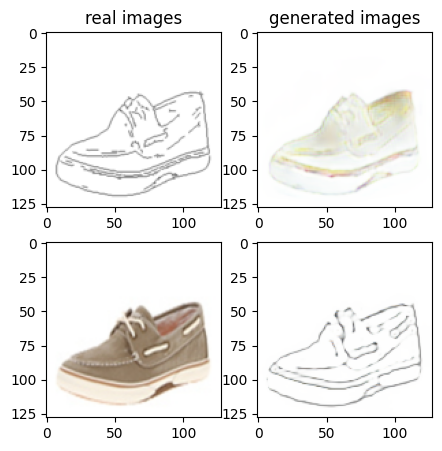

Train Epoch: 2 28% 	Total Loss: 1.324055 	Loss_G_AB: 0.255686	Loss_G_BA: 1.029122	Loss_cycle: 0.400918	Loss_D_A: 0.003942	Loss_D_B: 0.276791
1 64009 T:  2.041764736175537
Train Epoch: 2 28% 	Total Loss: 1.146732 	Loss_G_AB: 0.276276	Loss_G_BA: 0.989419	Loss_cycle: 0.255239	Loss_D_A: 0.003042	Loss_D_B: 0.255603
1 64019 T:  0.9748725891113281
Train Epoch: 2 29% 	Total Loss: 1.282652 	Loss_G_AB: 0.282732	Loss_G_BA: 0.992671	Loss_cycle: 0.392046	Loss_D_A: 0.001830	Loss_D_B: 0.251074
1 64029 T:  0.9845967292785645
Train Epoch: 2 29% 	Total Loss: 1.231869 	Loss_G_AB: 0.272556	Loss_G_BA: 0.994823	Loss_cycle: 0.345778	Loss_D_A: 0.001540	Loss_D_B: 0.250861
1 64039 T:  0.9930760860443115
Train Epoch: 2 29% 	Total Loss: 1.296488 	Loss_G_AB: 0.274056	Loss_G_BA: 1.002412	Loss_cycle: 0.412064	Loss_D_A: 0.001490	Loss_D_B: 0.244699
1 64049 T:  1.0730619430541992
Train Epoch: 2 29% 	Total Loss: 1.291684 	Loss_G_AB: 0.300645	Loss_G_BA: 1.005772	Loss_cycle: 0.401635	Loss_D_A: 0.001195	Loss_D_B: 0.235644


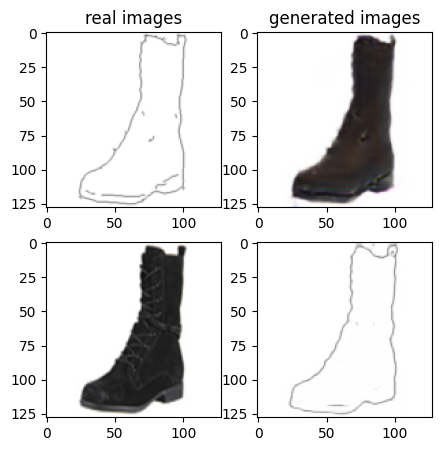

Train Epoch: 2 30% 	Total Loss: 1.236281 	Loss_G_AB: 0.269049	Loss_G_BA: 0.979409	Loss_cycle: 0.347001	Loss_D_A: 0.019167	Loss_D_B: 0.245884
1 65009 T:  2.0117852687835693
Train Epoch: 2 30% 	Total Loss: 1.283790 	Loss_G_AB: 0.287701	Loss_G_BA: 0.996350	Loss_cycle: 0.358806	Loss_D_A: 0.022890	Loss_D_B: 0.260068
1 65019 T:  0.9782507419586182
Train Epoch: 2 31% 	Total Loss: 1.221657 	Loss_G_AB: 0.306228	Loss_G_BA: 0.973961	Loss_cycle: 0.287153	Loss_D_A: 0.007098	Loss_D_B: 0.287311
1 65029 T:  1.0061695575714111
Train Epoch: 2 31% 	Total Loss: 1.336404 	Loss_G_AB: 0.312740	Loss_G_BA: 0.934861	Loss_cycle: 0.461875	Loss_D_A: 0.011354	Loss_D_B: 0.239375
1 65039 T:  1.013373613357544
Train Epoch: 2 31% 	Total Loss: 1.247795 	Loss_G_AB: 0.274064	Loss_G_BA: 1.028100	Loss_cycle: 0.319314	Loss_D_A: 0.009082	Loss_D_B: 0.268317
1 65049 T:  1.0575437545776367
Train Epoch: 2 31% 	Total Loss: 1.285736 	Loss_G_AB: 0.269088	Loss_G_BA: 0.985200	Loss_cycle: 0.383738	Loss_D_A: 0.006063	Loss_D_B: 0.268791


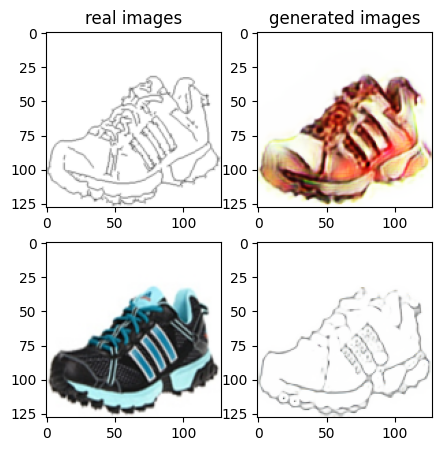

Train Epoch: 2 32% 	Total Loss: 1.456919 	Loss_G_AB: 0.259806	Loss_G_BA: 1.093229	Loss_cycle: 0.484248	Loss_D_A: 0.017999	Loss_D_B: 0.278155
1 66009 T:  2.0508739948272705
Train Epoch: 2 33% 	Total Loss: 1.227706 	Loss_G_AB: 0.268523	Loss_G_BA: 1.015498	Loss_cycle: 0.323602	Loss_D_A: 0.006745	Loss_D_B: 0.255349
1 66019 T:  1.0105810165405273
Train Epoch: 2 33% 	Total Loss: 1.234804 	Loss_G_AB: 0.297574	Loss_G_BA: 0.939465	Loss_cycle: 0.363004	Loss_D_A: 0.018079	Loss_D_B: 0.235201
1 66029 T:  1.019866943359375
Train Epoch: 2 33% 	Total Loss: 1.205432 	Loss_G_AB: 0.296844	Loss_G_BA: 0.963379	Loss_cycle: 0.328622	Loss_D_A: 0.007228	Loss_D_B: 0.239470
1 66039 T:  1.0455067157745361
Train Epoch: 2 33% 	Total Loss: 1.363347 	Loss_G_AB: 0.318748	Loss_G_BA: 0.976578	Loss_cycle: 0.484977	Loss_D_A: 0.002588	Loss_D_B: 0.228118
1 66049 T:  1.0864489078521729
Train Epoch: 2 33% 	Total Loss: 1.234165 	Loss_G_AB: 0.272836	Loss_G_BA: 1.016763	Loss_cycle: 0.337824	Loss_D_A: 0.004041	Loss_D_B: 0.247500


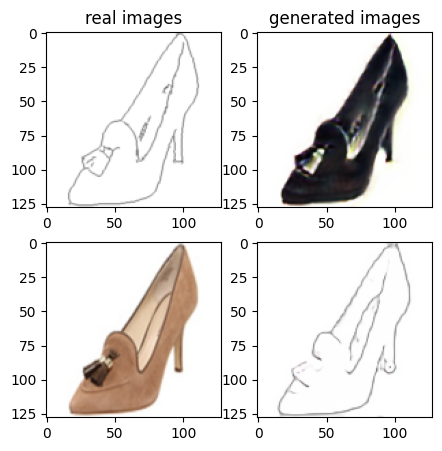

Train Epoch: 2 34% 	Total Loss: 1.301169 	Loss_G_AB: 0.276968	Loss_G_BA: 0.987019	Loss_cycle: 0.395767	Loss_D_A: 0.017771	Loss_D_B: 0.255637
1 67009 T:  2.530726909637451
Train Epoch: 2 35% 	Total Loss: 1.217664 	Loss_G_AB: 0.274606	Loss_G_BA: 0.992895	Loss_cycle: 0.336941	Loss_D_A: 0.007470	Loss_D_B: 0.239503
1 67019 T:  1.033515453338623
Train Epoch: 2 35% 	Total Loss: 1.274482 	Loss_G_AB: 0.278546	Loss_G_BA: 0.999970	Loss_cycle: 0.374685	Loss_D_A: 0.002531	Loss_D_B: 0.258008
1 67029 T:  0.977374792098999
Train Epoch: 2 35% 	Total Loss: 1.217093 	Loss_G_AB: 0.286745	Loss_G_BA: 0.995788	Loss_cycle: 0.282589	Loss_D_A: 0.002915	Loss_D_B: 0.290323
1 67039 T:  0.9775228500366211
Train Epoch: 2 35% 	Total Loss: 1.221853 	Loss_G_AB: 0.298535	Loss_G_BA: 0.959238	Loss_cycle: 0.358989	Loss_D_A: 0.003125	Loss_D_B: 0.230852
1 67049 T:  0.9779541492462158
Train Epoch: 2 35% 	Total Loss: 1.253601 	Loss_G_AB: 0.277542	Loss_G_BA: 1.027290	Loss_cycle: 0.360568	Loss_D_A: 0.007351	Loss_D_B: 0.233267
1 

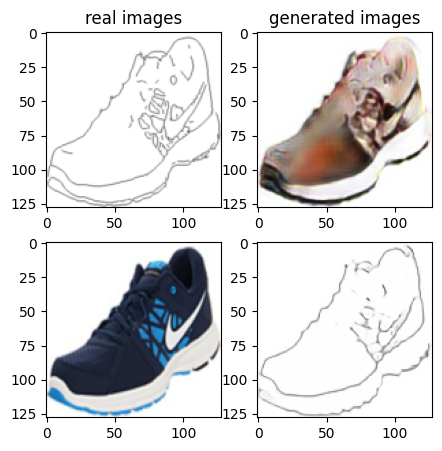

Train Epoch: 2 36% 	Total Loss: 1.212908 	Loss_G_AB: 0.297872	Loss_G_BA: 1.001310	Loss_cycle: 0.323510	Loss_D_A: 0.003546	Loss_D_B: 0.236260
1 68009 T:  2.3462681770324707
Train Epoch: 2 37% 	Total Loss: 1.344906 	Loss_G_AB: 0.262639	Loss_G_BA: 0.999251	Loss_cycle: 0.416268	Loss_D_A: 0.002401	Loss_D_B: 0.295292
1 68019 T:  0.975536584854126
Train Epoch: 2 37% 	Total Loss: 1.250952 	Loss_G_AB: 0.275390	Loss_G_BA: 0.992656	Loss_cycle: 0.367508	Loss_D_A: 0.002246	Loss_D_B: 0.247174
1 68029 T:  0.9745252132415771
Train Epoch: 2 37% 	Total Loss: 1.309463 	Loss_G_AB: 0.276834	Loss_G_BA: 0.998324	Loss_cycle: 0.417577	Loss_D_A: 0.002367	Loss_D_B: 0.251939
1 68039 T:  0.9710714817047119
Train Epoch: 2 37% 	Total Loss: 1.214383 	Loss_G_AB: 0.255442	Loss_G_BA: 0.994474	Loss_cycle: 0.332917	Loss_D_A: 0.002574	Loss_D_B: 0.253933
1 68049 T:  0.983372688293457
Train Epoch: 2 37% 	Total Loss: 1.289721 	Loss_G_AB: 0.285722	Loss_G_BA: 1.010692	Loss_cycle: 0.392325	Loss_D_A: 0.003591	Loss_D_B: 0.245599
1

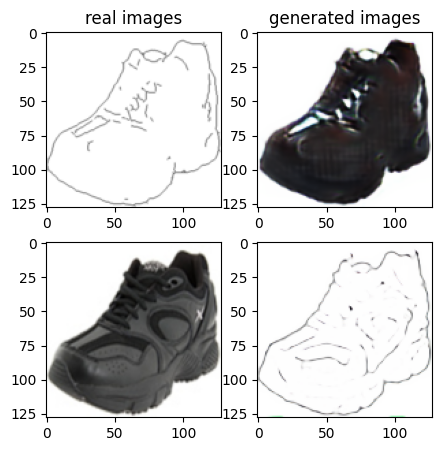

Train Epoch: 2 39% 	Total Loss: 1.271537 	Loss_G_AB: 0.293706	Loss_G_BA: 1.016846	Loss_cycle: 0.373551	Loss_D_A: 0.002684	Loss_D_B: 0.240026
1 69009 T:  2.0241265296936035
Train Epoch: 2 39% 	Total Loss: 1.258707 	Loss_G_AB: 0.314422	Loss_G_BA: 0.995921	Loss_cycle: 0.371704	Loss_D_A: 0.001781	Loss_D_B: 0.230051
1 69019 T:  0.96901535987854
Train Epoch: 2 39% 	Total Loss: 1.302126 	Loss_G_AB: 0.319610	Loss_G_BA: 1.004751	Loss_cycle: 0.367826	Loss_D_A: 0.001693	Loss_D_B: 0.270426
1 69029 T:  0.969468355178833
Train Epoch: 2 39% 	Total Loss: 1.301907 	Loss_G_AB: 0.291110	Loss_G_BA: 0.981716	Loss_cycle: 0.425855	Loss_D_A: 0.001550	Loss_D_B: 0.238089
1 69039 T:  0.9773106575012207
Train Epoch: 2 39% 	Total Loss: 1.268919 	Loss_G_AB: 0.265650	Loss_G_BA: 0.999445	Loss_cycle: 0.372738	Loss_D_A: 0.001362	Loss_D_B: 0.262271
1 69049 T:  0.9863767623901367
Train Epoch: 2 39% 	Total Loss: 1.361233 	Loss_G_AB: 0.311568	Loss_G_BA: 0.989840	Loss_cycle: 0.455273	Loss_D_A: 0.001848	Loss_D_B: 0.253408
1 

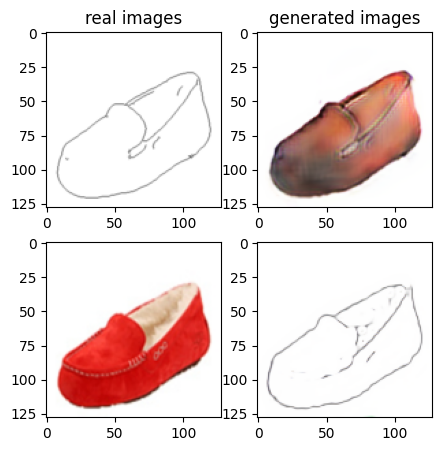

Train Epoch: 2 41% 	Total Loss: 1.313345 	Loss_G_AB: 0.316170	Loss_G_BA: 0.991199	Loss_cycle: 0.436760	Loss_D_A: 0.001165	Loss_D_B: 0.221735
1 70009 T:  2.0305559635162354
Train Epoch: 2 41% 	Total Loss: 1.290173 	Loss_G_AB: 0.261793	Loss_G_BA: 1.014859	Loss_cycle: 0.362520	Loss_D_A: 0.001508	Loss_D_B: 0.287819
1 70019 T:  0.9865820407867432
Train Epoch: 2 41% 	Total Loss: 1.254302 	Loss_G_AB: 0.265994	Loss_G_BA: 1.008710	Loss_cycle: 0.355515	Loss_D_A: 0.001804	Loss_D_B: 0.259631
1 70029 T:  0.9765582084655762
Train Epoch: 2 41% 	Total Loss: 1.205075 	Loss_G_AB: 0.279539	Loss_G_BA: 0.999936	Loss_cycle: 0.318458	Loss_D_A: 0.002519	Loss_D_B: 0.244360
1 70039 T:  0.9787628650665283
Train Epoch: 2 41% 	Total Loss: 1.192002 	Loss_G_AB: 0.291273	Loss_G_BA: 0.992588	Loss_cycle: 0.308277	Loss_D_A: 0.001927	Loss_D_B: 0.239868
1 70049 T:  0.9858083724975586
Train Epoch: 2 41% 	Total Loss: 1.245368 	Loss_G_AB: 0.332782	Loss_G_BA: 0.994643	Loss_cycle: 0.374983	Loss_D_A: 0.001044	Loss_D_B: 0.205628

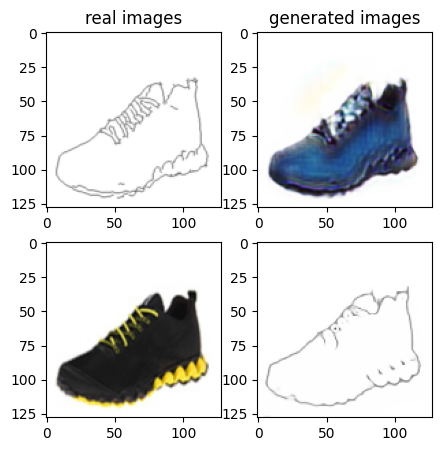

Train Epoch: 2 43% 	Total Loss: 1.212953 	Loss_G_AB: 0.301338	Loss_G_BA: 0.962637	Loss_cycle: 0.340212	Loss_D_A: 0.018765	Loss_D_B: 0.221988
1 71009 T:  2.0245018005371094
Train Epoch: 2 43% 	Total Loss: 1.218040 	Loss_G_AB: 0.296619	Loss_G_BA: 0.956792	Loss_cycle: 0.332701	Loss_D_A: 0.010424	Loss_D_B: 0.248211
1 71019 T:  0.9793581962585449
Train Epoch: 2 43% 	Total Loss: 1.277173 	Loss_G_AB: 0.268588	Loss_G_BA: 1.016361	Loss_cycle: 0.379755	Loss_D_A: 0.003379	Loss_D_B: 0.251564
1 71029 T:  0.9816207885742188
Train Epoch: 2 43% 	Total Loss: 1.278242 	Loss_G_AB: 0.245285	Loss_G_BA: 0.988424	Loss_cycle: 0.380847	Loss_D_A: 0.002634	Loss_D_B: 0.277906
1 71039 T:  0.9867684841156006
Train Epoch: 2 43% 	Total Loss: 1.271514 	Loss_G_AB: 0.378060	Loss_G_BA: 1.010411	Loss_cycle: 0.391603	Loss_D_A: 0.001873	Loss_D_B: 0.183802
1 71049 T:  1.0935089588165283
Train Epoch: 2 43% 	Total Loss: 1.261894 	Loss_G_AB: 0.259901	Loss_G_BA: 0.979214	Loss_cycle: 0.381484	Loss_D_A: 0.002625	Loss_D_B: 0.258227

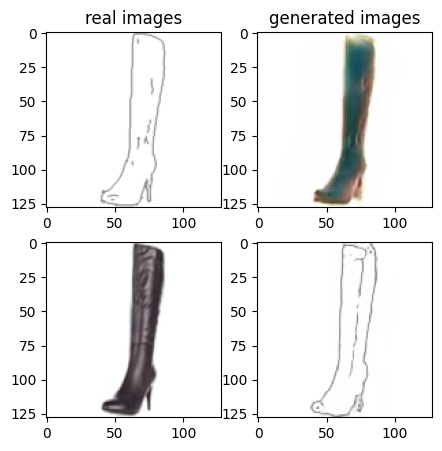

Train Epoch: 2 45% 	Total Loss: 1.255771 	Loss_G_AB: 0.284337	Loss_G_BA: 0.897020	Loss_cycle: 0.326525	Loss_D_A: 0.054803	Loss_D_B: 0.283764
1 72009 T:  2.0408737659454346
Train Epoch: 2 45% 	Total Loss: 1.275221 	Loss_G_AB: 0.285312	Loss_G_BA: 1.015076	Loss_cycle: 0.345055	Loss_D_A: 0.018991	Loss_D_B: 0.260981
1 72019 T:  1.0337960720062256
Train Epoch: 2 45% 	Total Loss: 1.258275 	Loss_G_AB: 0.319927	Loss_G_BA: 1.020568	Loss_cycle: 0.328462	Loss_D_A: 0.011707	Loss_D_B: 0.247858
1 72029 T:  1.007101058959961
Train Epoch: 2 45% 	Total Loss: 1.353796 	Loss_G_AB: 0.283906	Loss_G_BA: 0.998505	Loss_cycle: 0.441817	Loss_D_A: 0.004264	Loss_D_B: 0.266509
1 72039 T:  1.0464131832122803
Train Epoch: 2 45% 	Total Loss: 1.312710 	Loss_G_AB: 0.275316	Loss_G_BA: 0.972914	Loss_cycle: 0.426473	Loss_D_A: 0.004015	Loss_D_B: 0.258107
1 72049 T:  1.0635786056518555
Train Epoch: 2 45% 	Total Loss: 1.319641 	Loss_G_AB: 0.312500	Loss_G_BA: 1.017862	Loss_cycle: 0.406549	Loss_D_A: 0.007316	Loss_D_B: 0.240595


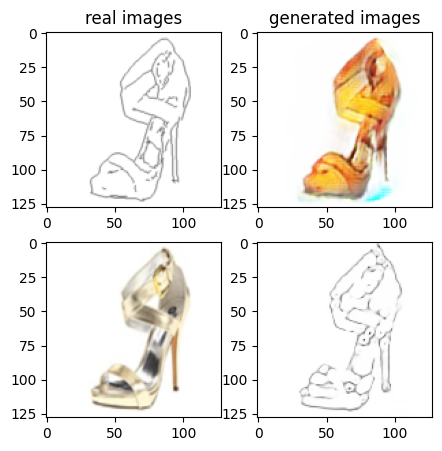

Train Epoch: 2 47% 	Total Loss: 1.285898 	Loss_G_AB: 0.284264	Loss_G_BA: 0.993844	Loss_cycle: 0.355336	Loss_D_A: 0.050833	Loss_D_B: 0.240675
1 73009 T:  2.347864866256714
Train Epoch: 2 47% 	Total Loss: 1.272388 	Loss_G_AB: 0.308786	Loss_G_BA: 0.944461	Loss_cycle: 0.355849	Loss_D_A: 0.018628	Loss_D_B: 0.271287
1 73019 T:  1.0200157165527344
Train Epoch: 2 47% 	Total Loss: 1.291357 	Loss_G_AB: 0.347803	Loss_G_BA: 1.005134	Loss_cycle: 0.378499	Loss_D_A: 0.009851	Loss_D_B: 0.226538
1 73029 T:  1.0160868167877197
Train Epoch: 2 47% 	Total Loss: 1.218910 	Loss_G_AB: 0.294910	Loss_G_BA: 0.939762	Loss_cycle: 0.320608	Loss_D_A: 0.031694	Loss_D_B: 0.249273
1 73039 T:  0.9788167476654053
Train Epoch: 2 47% 	Total Loss: 1.205538 	Loss_G_AB: 0.253472	Loss_G_BA: 0.967018	Loss_cycle: 0.319996	Loss_D_A: 0.011507	Loss_D_B: 0.263790
1 73049 T:  0.9798846244812012
Train Epoch: 2 47% 	Total Loss: 1.364929 	Loss_G_AB: 0.300787	Loss_G_BA: 0.967198	Loss_cycle: 0.476416	Loss_D_A: 0.021551	Loss_D_B: 0.232969


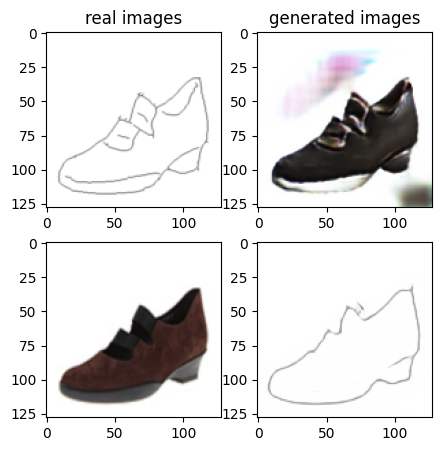

Train Epoch: 2 49% 	Total Loss: 1.394595 	Loss_G_AB: 0.311697	Loss_G_BA: 1.000546	Loss_cycle: 0.505153	Loss_D_A: 0.002225	Loss_D_B: 0.231096
1 74009 T:  2.746162176132202
Train Epoch: 2 49% 	Total Loss: 1.272999 	Loss_G_AB: 0.353337	Loss_G_BA: 0.999066	Loss_cycle: 0.379008	Loss_D_A: 0.001316	Loss_D_B: 0.216473
1 74019 T:  0.9814815521240234
Train Epoch: 2 49% 	Total Loss: 1.354734 	Loss_G_AB: 0.260662	Loss_G_BA: 0.987474	Loss_cycle: 0.419400	Loss_D_A: 0.002362	Loss_D_B: 0.308904
1 74029 T:  0.9652049541473389
Train Epoch: 2 49% 	Total Loss: 1.228787 	Loss_G_AB: 0.318344	Loss_G_BA: 0.983286	Loss_cycle: 0.352300	Loss_D_A: 0.015754	Loss_D_B: 0.209918
1 74039 T:  0.9780886173248291
Train Epoch: 2 49% 	Total Loss: 1.390103 	Loss_G_AB: 0.316756	Loss_G_BA: 1.010834	Loss_cycle: 0.491381	Loss_D_A: 0.003825	Loss_D_B: 0.231103
1 74049 T:  0.9780213832855225
Train Epoch: 2 49% 	Total Loss: 1.336504 	Loss_G_AB: 0.337787	Loss_G_BA: 1.000552	Loss_cycle: 0.411333	Loss_D_A: 0.003243	Loss_D_B: 0.252758


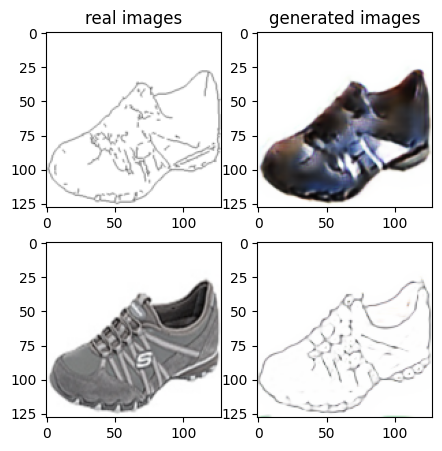

Train Epoch: 2 51% 	Total Loss: 1.371414 	Loss_G_AB: 0.323468	Loss_G_BA: 1.011085	Loss_cycle: 0.440596	Loss_D_A: 0.002295	Loss_D_B: 0.261247
1 75009 T:  2.094799280166626
Train Epoch: 2 51% 	Total Loss: 1.404288 	Loss_G_AB: 0.310600	Loss_G_BA: 0.996354	Loss_cycle: 0.496274	Loss_D_A: 0.001967	Loss_D_B: 0.252570
1 75019 T:  0.9731190204620361
Train Epoch: 2 51% 	Total Loss: 1.296186 	Loss_G_AB: 0.301769	Loss_G_BA: 0.992126	Loss_cycle: 0.387993	Loss_D_A: 0.001607	Loss_D_B: 0.259639
1 75029 T:  0.9797520637512207
Train Epoch: 2 51% 	Total Loss: 1.352475 	Loss_G_AB: 0.314795	Loss_G_BA: 0.995221	Loss_cycle: 0.461535	Loss_D_A: 0.001582	Loss_D_B: 0.234351
1 75039 T:  0.9827041625976562
Train Epoch: 2 51% 	Total Loss: 1.228817 	Loss_G_AB: 0.306314	Loss_G_BA: 1.004915	Loss_cycle: 0.351145	Loss_D_A: 0.001411	Loss_D_B: 0.220646
1 75049 T:  0.9873785972595215
Train Epoch: 2 51% 	Total Loss: 1.171766 	Loss_G_AB: 0.261798	Loss_G_BA: 0.997348	Loss_cycle: 0.267344	Loss_D_A: 0.001491	Loss_D_B: 0.273359


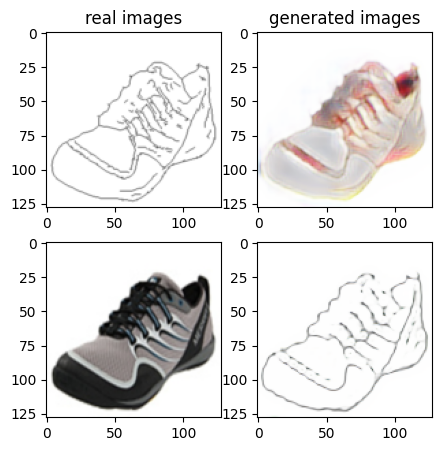

Train Epoch: 2 53% 	Total Loss: 1.250521 	Loss_G_AB: 0.274675	Loss_G_BA: 0.997888	Loss_cycle: 0.344693	Loss_D_A: 0.001747	Loss_D_B: 0.267800
1 76009 T:  2.06748628616333
Train Epoch: 2 53% 	Total Loss: 1.201017 	Loss_G_AB: 0.290070	Loss_G_BA: 0.992261	Loss_cycle: 0.311541	Loss_D_A: 0.004131	Loss_D_B: 0.244179
1 76019 T:  0.9726846218109131
Train Epoch: 2 53% 	Total Loss: 1.164474 	Loss_G_AB: 0.276493	Loss_G_BA: 0.991083	Loss_cycle: 0.279474	Loss_D_A: 0.006564	Loss_D_B: 0.244648
1 76029 T:  0.9683928489685059
Train Epoch: 2 53% 	Total Loss: 1.217219 	Loss_G_AB: 0.319780	Loss_G_BA: 1.004525	Loss_cycle: 0.313210	Loss_D_A: 0.003451	Loss_D_B: 0.238405
1 76039 T:  0.9714860916137695
Train Epoch: 2 53% 	Total Loss: 1.208971 	Loss_G_AB: 0.291205	Loss_G_BA: 0.991887	Loss_cycle: 0.331981	Loss_D_A: 0.002464	Loss_D_B: 0.232979
1 76049 T:  0.987041711807251
Train Epoch: 2 53% 	Total Loss: 1.286074 	Loss_G_AB: 0.276064	Loss_G_BA: 0.962698	Loss_cycle: 0.420065	Loss_D_A: 0.009341	Loss_D_B: 0.237286
1 

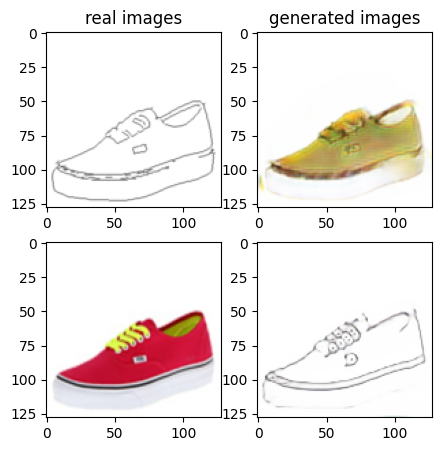

Train Epoch: 2 55% 	Total Loss: 1.185720 	Loss_G_AB: 0.277884	Loss_G_BA: 1.008502	Loss_cycle: 0.295131	Loss_D_A: 0.002189	Loss_D_B: 0.245206
1 77009 T:  2.039809465408325
Train Epoch: 2 55% 	Total Loss: 1.312794 	Loss_G_AB: 0.329783	Loss_G_BA: 0.990126	Loss_cycle: 0.422965	Loss_D_A: 0.001416	Loss_D_B: 0.228458
1 77019 T:  0.9823143482208252
Train Epoch: 2 55% 	Total Loss: 1.311410 	Loss_G_AB: 0.253817	Loss_G_BA: 0.999044	Loss_cycle: 0.411263	Loss_D_A: 0.002789	Loss_D_B: 0.270928
1 77029 T:  0.9798293113708496
Train Epoch: 2 55% 	Total Loss: 1.264707 	Loss_G_AB: 0.351018	Loss_G_BA: 1.000233	Loss_cycle: 0.371668	Loss_D_A: 0.001954	Loss_D_B: 0.215459
1 77039 T:  0.975346565246582
Train Epoch: 2 55% 	Total Loss: 1.315936 	Loss_G_AB: 0.312016	Loss_G_BA: 0.993900	Loss_cycle: 0.374320	Loss_D_A: 0.002554	Loss_D_B: 0.286104
1 77049 T:  0.9905471801757812
Train Epoch: 2 55% 	Total Loss: 1.345975 	Loss_G_AB: 0.395596	Loss_G_BA: 0.964006	Loss_cycle: 0.456783	Loss_D_A: 0.004193	Loss_D_B: 0.205199
1

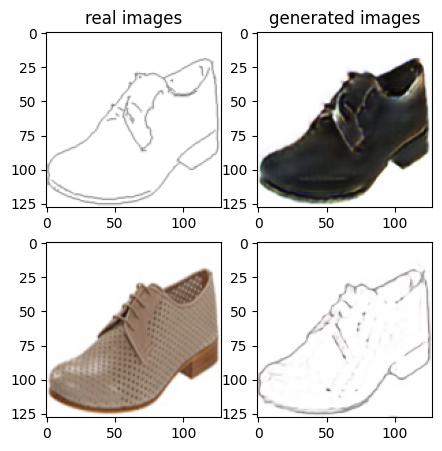

Train Epoch: 2 57% 	Total Loss: 1.300391 	Loss_G_AB: 0.283545	Loss_G_BA: 0.989383	Loss_cycle: 0.394058	Loss_D_A: 0.002782	Loss_D_B: 0.267087
1 78009 T:  2.0748512744903564
Train Epoch: 2 57% 	Total Loss: 1.232654 	Loss_G_AB: 0.372770	Loss_G_BA: 0.979241	Loss_cycle: 0.310897	Loss_D_A: 0.015960	Loss_D_B: 0.229791
1 78019 T:  0.9815571308135986
Train Epoch: 2 57% 	Total Loss: 1.258045 	Loss_G_AB: 0.289074	Loss_G_BA: 1.024435	Loss_cycle: 0.358312	Loss_D_A: 0.003553	Loss_D_B: 0.239425
1 78029 T:  0.98626708984375
Train Epoch: 2 57% 	Total Loss: 1.195034 	Loss_G_AB: 0.317798	Loss_G_BA: 0.950660	Loss_cycle: 0.329728	Loss_D_A: 0.013422	Loss_D_B: 0.217656
1 78039 T:  1.0098774433135986
Train Epoch: 2 57% 	Total Loss: 1.282843 	Loss_G_AB: 0.304588	Loss_G_BA: 0.994607	Loss_cycle: 0.391998	Loss_D_A: 0.007272	Loss_D_B: 0.233976
1 78049 T:  1.0890860557556152
Train Epoch: 2 57% 	Total Loss: 1.384995 	Loss_G_AB: 0.278297	Loss_G_BA: 1.009252	Loss_cycle: 0.415349	Loss_D_A: 0.004093	Loss_D_B: 0.321778
1

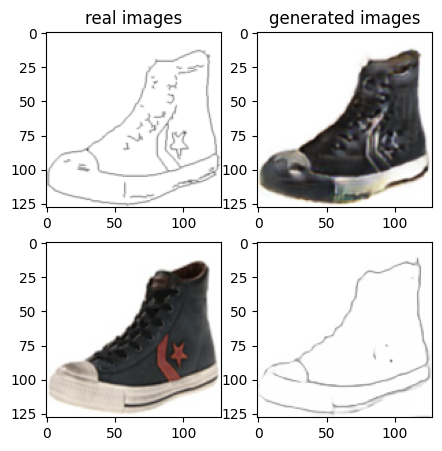

Train Epoch: 2 59% 	Total Loss: 1.217176 	Loss_G_AB: 0.279192	Loss_G_BA: 0.855595	Loss_cycle: 0.362303	Loss_D_A: 0.042182	Loss_D_B: 0.245297
1 79009 T:  2.070408582687378
Train Epoch: 2 59% 	Total Loss: 1.379203 	Loss_G_AB: 0.321794	Loss_G_BA: 0.857790	Loss_cycle: 0.397398	Loss_D_A: 0.148165	Loss_D_B: 0.243848
1 79019 T:  0.99526047706604
Train Epoch: 2 59% 	Total Loss: 1.204733 	Loss_G_AB: 0.307622	Loss_G_BA: 0.904945	Loss_cycle: 0.348016	Loss_D_A: 0.029763	Loss_D_B: 0.220670
1 79029 T:  1.0452501773834229
Train Epoch: 2 59% 	Total Loss: 1.345678 	Loss_G_AB: 0.340227	Loss_G_BA: 1.002741	Loss_cycle: 0.377427	Loss_D_A: 0.059339	Loss_D_B: 0.237428
1 79039 T:  1.0756936073303223
Train Epoch: 2 59% 	Total Loss: 1.320156 	Loss_G_AB: 0.288267	Loss_G_BA: 1.000922	Loss_cycle: 0.405988	Loss_D_A: 0.035742	Loss_D_B: 0.233832
1 79049 T:  1.1097464561462402
Train Epoch: 2 59% 	Total Loss: 1.304622 	Loss_G_AB: 0.284763	Loss_G_BA: 0.929894	Loss_cycle: 0.404969	Loss_D_A: 0.018557	Loss_D_B: 0.273768
1 

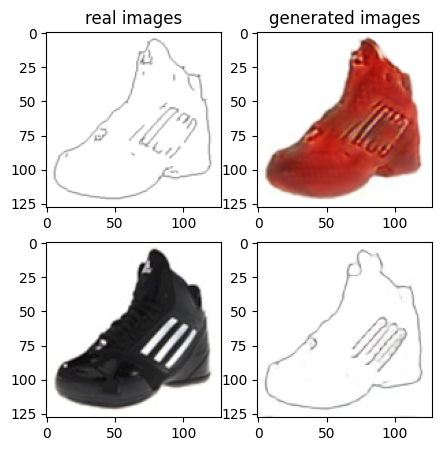

Train Epoch: 2 61% 	Total Loss: 1.261925 	Loss_G_AB: 0.360059	Loss_G_BA: 0.993865	Loss_cycle: 0.363367	Loss_D_A: 0.001667	Loss_D_B: 0.219929
1 80009 T:  2.5242085456848145
Train Epoch: 2 61% 	Total Loss: 1.284826 	Loss_G_AB: 0.307345	Loss_G_BA: 0.975166	Loss_cycle: 0.408288	Loss_D_A: 0.011503	Loss_D_B: 0.223780
1 80019 T:  1.068723201751709
Train Epoch: 2 61% 	Total Loss: 1.128332 	Loss_G_AB: 0.259430	Loss_G_BA: 0.963598	Loss_cycle: 0.236516	Loss_D_A: 0.016933	Loss_D_B: 0.263370
1 80029 T:  1.075345516204834
Train Epoch: 2 61% 	Total Loss: 1.254917 	Loss_G_AB: 0.295639	Loss_G_BA: 0.975131	Loss_cycle: 0.369433	Loss_D_A: 0.007966	Loss_D_B: 0.242133
1 80039 T:  1.0557641983032227
Train Epoch: 2 61% 	Total Loss: 1.185589 	Loss_G_AB: 0.268192	Loss_G_BA: 0.997499	Loss_cycle: 0.310535	Loss_D_A: 0.003548	Loss_D_B: 0.238660
1 80049 T:  0.9865114688873291
Train Epoch: 2 61% 	Total Loss: 1.242248 	Loss_G_AB: 0.316483	Loss_G_BA: 1.007443	Loss_cycle: 0.332126	Loss_D_A: 0.002425	Loss_D_B: 0.245733
1

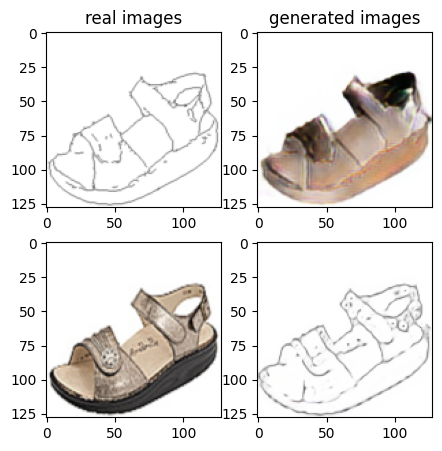

Train Epoch: 2 63% 	Total Loss: 1.188070 	Loss_G_AB: 0.269384	Loss_G_BA: 1.007143	Loss_cycle: 0.278853	Loss_D_A: 0.002365	Loss_D_B: 0.268589
1 81009 T:  2.956653118133545
Train Epoch: 2 63% 	Total Loss: 1.229439 	Loss_G_AB: 0.281824	Loss_G_BA: 0.988076	Loss_cycle: 0.311126	Loss_D_A: 0.002362	Loss_D_B: 0.281001
1 81019 T:  1.0776309967041016
Train Epoch: 2 63% 	Total Loss: 1.327841 	Loss_G_AB: 0.324734	Loss_G_BA: 0.996237	Loss_cycle: 0.439253	Loss_D_A: 0.003362	Loss_D_B: 0.224741
1 81029 T:  0.9934337139129639
Train Epoch: 2 63% 	Total Loss: 1.232884 	Loss_G_AB: 0.316705	Loss_G_BA: 0.988021	Loss_cycle: 0.355908	Loss_D_A: 0.002866	Loss_D_B: 0.221746
1 81039 T:  0.9913427829742432
Train Epoch: 2 63% 	Total Loss: 1.248217 	Loss_G_AB: 0.271686	Loss_G_BA: 1.004915	Loss_cycle: 0.344803	Loss_D_A: 0.002579	Loss_D_B: 0.262535
1 81049 T:  0.9864203929901123
Train Epoch: 2 63% 	Total Loss: 1.287766 	Loss_G_AB: 0.297174	Loss_G_BA: 0.993951	Loss_cycle: 0.384240	Loss_D_A: 0.003138	Loss_D_B: 0.254826


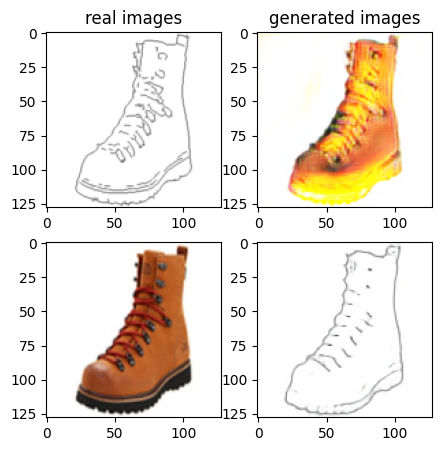

Train Epoch: 2 65% 	Total Loss: 1.320742 	Loss_G_AB: 0.242848	Loss_G_BA: 0.976278	Loss_cycle: 0.411598	Loss_D_A: 0.002412	Loss_D_B: 0.297169
1 82009 T:  2.710273504257202
Train Epoch: 2 65% 	Total Loss: 1.277042 	Loss_G_AB: 0.351511	Loss_G_BA: 1.016516	Loss_cycle: 0.367579	Loss_D_A: 0.004159	Loss_D_B: 0.221290
1 82019 T:  1.0097379684448242
Train Epoch: 2 65% 	Total Loss: 1.286330 	Loss_G_AB: 0.265484	Loss_G_BA: 0.990228	Loss_cycle: 0.380430	Loss_D_A: 0.001332	Loss_D_B: 0.276711
1 82029 T:  0.9876139163970947
Train Epoch: 2 65% 	Total Loss: 1.332658 	Loss_G_AB: 0.271577	Loss_G_BA: 0.991537	Loss_cycle: 0.416631	Loss_D_A: 0.002170	Loss_D_B: 0.282300
1 82039 T:  0.9942226409912109
Train Epoch: 2 65% 	Total Loss: 1.169681 	Loss_G_AB: 0.302616	Loss_G_BA: 1.003209	Loss_cycle: 0.276403	Loss_D_A: 0.003436	Loss_D_B: 0.236928
1 82049 T:  0.9841139316558838
Train Epoch: 2 65% 	Total Loss: 1.209898 	Loss_G_AB: 0.290124	Loss_G_BA: 0.997715	Loss_cycle: 0.328520	Loss_D_A: 0.003259	Loss_D_B: 0.234200


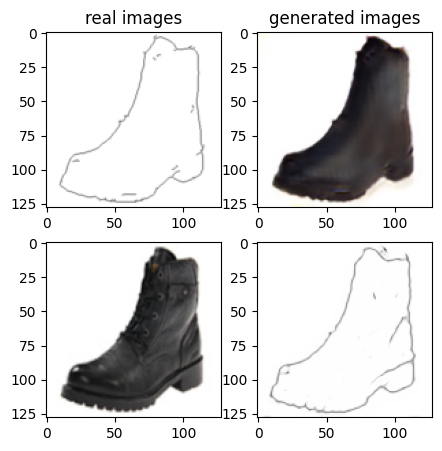

Train Epoch: 2 67% 	Total Loss: 1.176398 	Loss_G_AB: 0.308501	Loss_G_BA: 0.973484	Loss_cycle: 0.282947	Loss_D_A: 0.005999	Loss_D_B: 0.246460
1 83009 T:  2.548750400543213
Train Epoch: 2 67% 	Total Loss: 1.294835 	Loss_G_AB: 0.285058	Loss_G_BA: 1.024256	Loss_cycle: 0.327441	Loss_D_A: 0.011972	Loss_D_B: 0.300766
1 83019 T:  1.0031132698059082
Train Epoch: 2 67% 	Total Loss: 1.350007 	Loss_G_AB: 0.326151	Loss_G_BA: 1.011056	Loss_cycle: 0.427936	Loss_D_A: 0.001664	Loss_D_B: 0.251804
1 83029 T:  0.9804632663726807
Train Epoch: 2 67% 	Total Loss: 1.243080 	Loss_G_AB: 0.342116	Loss_G_BA: 0.996576	Loss_cycle: 0.336313	Loss_D_A: 0.002372	Loss_D_B: 0.235050
1 83039 T:  0.9895563125610352
Train Epoch: 2 67% 	Total Loss: 1.203837 	Loss_G_AB: 0.327394	Loss_G_BA: 0.997940	Loss_cycle: 0.303936	Loss_D_A: 0.002823	Loss_D_B: 0.234411
1 83049 T:  0.9755163192749023
Train Epoch: 2 67% 	Total Loss: 1.456881 	Loss_G_AB: 0.318997	Loss_G_BA: 0.995871	Loss_cycle: 0.555587	Loss_D_A: 0.002329	Loss_D_B: 0.241530


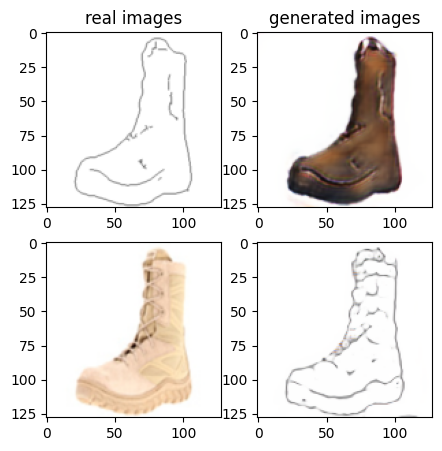

Train Epoch: 2 69% 	Total Loss: 1.210486 	Loss_G_AB: 0.288209	Loss_G_BA: 1.015872	Loss_cycle: 0.310022	Loss_D_A: 0.002920	Loss_D_B: 0.245505
1 84009 T:  2.5665745735168457
Train Epoch: 2 69% 	Total Loss: 1.285822 	Loss_G_AB: 0.345929	Loss_G_BA: 0.972844	Loss_cycle: 0.380576	Loss_D_A: 0.003806	Loss_D_B: 0.242054
1 84019 T:  0.9935071468353271
Train Epoch: 2 69% 	Total Loss: 1.336441 	Loss_G_AB: 0.280106	Loss_G_BA: 0.988878	Loss_cycle: 0.441460	Loss_D_A: 0.013285	Loss_D_B: 0.247204
1 84029 T:  0.9889111518859863
Train Epoch: 2 69% 	Total Loss: 1.267599 	Loss_G_AB: 0.323237	Loss_G_BA: 1.014591	Loss_cycle: 0.353731	Loss_D_A: 0.005173	Loss_D_B: 0.239782
1 84039 T:  0.9973189830780029
Train Epoch: 2 69% 	Total Loss: 1.315131 	Loss_G_AB: 0.304962	Loss_G_BA: 0.996956	Loss_cycle: 0.413964	Loss_D_A: 0.001945	Loss_D_B: 0.248263
1 84049 T:  0.9899928569793701
Train Epoch: 2 69% 	Total Loss: 1.295817 	Loss_G_AB: 0.329619	Loss_G_BA: 0.994848	Loss_cycle: 0.398135	Loss_D_A: 0.003082	Loss_D_B: 0.232366

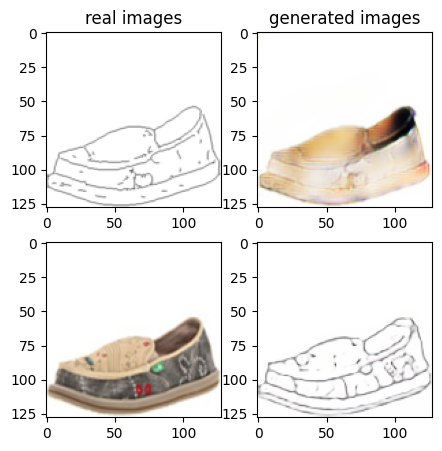

Train Epoch: 2 71% 	Total Loss: 1.208894 	Loss_G_AB: 0.317616	Loss_G_BA: 0.987505	Loss_cycle: 0.323409	Loss_D_A: 0.001395	Loss_D_B: 0.231530
1 85009 T:  2.1471054553985596
Train Epoch: 2 71% 	Total Loss: 1.288067 	Loss_G_AB: 0.291101	Loss_G_BA: 1.000418	Loss_cycle: 0.379831	Loss_D_A: 0.001795	Loss_D_B: 0.260682
1 85019 T:  0.9891974925994873
Train Epoch: 2 71% 	Total Loss: 1.283838 	Loss_G_AB: 0.310726	Loss_G_BA: 0.999094	Loss_cycle: 0.374581	Loss_D_A: 0.005252	Loss_D_B: 0.249095
1 85029 T:  0.9855153560638428
Train Epoch: 2 71% 	Total Loss: 1.324364 	Loss_G_AB: 0.319627	Loss_G_BA: 1.009965	Loss_cycle: 0.405962	Loss_D_A: 0.002406	Loss_D_B: 0.251200
1 85039 T:  0.9931597709655762
Train Epoch: 2 71% 	Total Loss: 1.228957 	Loss_G_AB: 0.294382	Loss_G_BA: 1.002483	Loss_cycle: 0.317506	Loss_D_A: 0.001170	Loss_D_B: 0.261848
1 85049 T:  0.994103193283081
Train Epoch: 2 71% 	Total Loss: 1.244073 	Loss_G_AB: 0.269847	Loss_G_BA: 0.999802	Loss_cycle: 0.338763	Loss_D_A: 0.001009	Loss_D_B: 0.269476


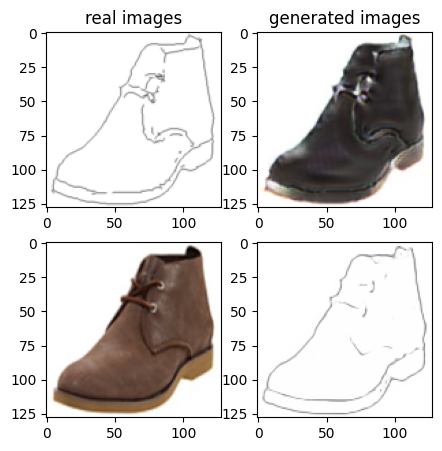

Train Epoch: 2 73% 	Total Loss: 1.221627 	Loss_G_AB: 0.306456	Loss_G_BA: 1.005528	Loss_cycle: 0.303072	Loss_D_A: 0.007636	Loss_D_B: 0.254927
1 86009 T:  2.3477940559387207
Train Epoch: 2 73% 	Total Loss: 1.303155 	Loss_G_AB: 0.320063	Loss_G_BA: 0.988310	Loss_cycle: 0.418671	Loss_D_A: 0.003669	Loss_D_B: 0.226628
1 86019 T:  0.9959282875061035
Train Epoch: 2 73% 	Total Loss: 1.209694 	Loss_G_AB: 0.298551	Loss_G_BA: 0.996390	Loss_cycle: 0.302321	Loss_D_A: 0.005579	Loss_D_B: 0.254323
1 86029 T:  0.9885034561157227
Train Epoch: 2 73% 	Total Loss: 1.164087 	Loss_G_AB: 0.274865	Loss_G_BA: 1.000293	Loss_cycle: 0.261533	Loss_D_A: 0.014476	Loss_D_B: 0.250499
1 86039 T:  0.9872252941131592
Train Epoch: 2 73% 	Total Loss: 1.205306 	Loss_G_AB: 0.287095	Loss_G_BA: 0.998308	Loss_cycle: 0.332626	Loss_D_A: 0.002966	Loss_D_B: 0.227013
1 86049 T:  0.996783971786499
Train Epoch: 2 73% 	Total Loss: 1.287892 	Loss_G_AB: 0.308172	Loss_G_BA: 0.995466	Loss_cycle: 0.382735	Loss_D_A: 0.008399	Loss_D_B: 0.244938


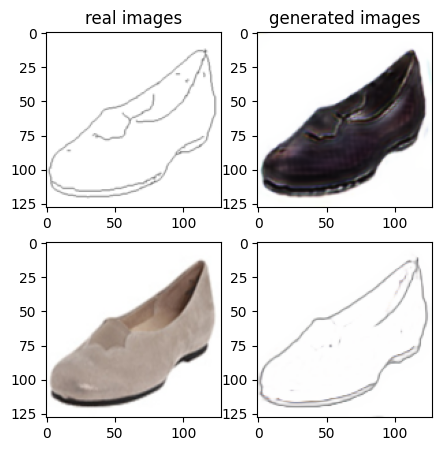

Train Epoch: 2 75% 	Total Loss: 1.384710 	Loss_G_AB: 0.287688	Loss_G_BA: 0.993742	Loss_cycle: 0.436842	Loss_D_A: 0.003419	Loss_D_B: 0.303734
1 87009 T:  2.132329225540161
Train Epoch: 2 75% 	Total Loss: 1.250386 	Loss_G_AB: 0.272189	Loss_G_BA: 0.997889	Loss_cycle: 0.369218	Loss_D_A: 0.002569	Loss_D_B: 0.243559
1 87019 T:  0.9957888126373291
Train Epoch: 2 75% 	Total Loss: 1.268532 	Loss_G_AB: 0.299573	Loss_G_BA: 0.978495	Loss_cycle: 0.375822	Loss_D_A: 0.005129	Loss_D_B: 0.248547
1 87029 T:  0.9854731559753418
Train Epoch: 2 75% 	Total Loss: 1.172891 	Loss_G_AB: 0.307721	Loss_G_BA: 0.978476	Loss_cycle: 0.292064	Loss_D_A: 0.011714	Loss_D_B: 0.226015
1 87039 T:  0.9854216575622559
Train Epoch: 2 75% 	Total Loss: 1.331948 	Loss_G_AB: 0.337457	Loss_G_BA: 0.989666	Loss_cycle: 0.415750	Loss_D_A: 0.001631	Loss_D_B: 0.251005
1 87049 T:  0.9970481395721436
Train Epoch: 2 75% 	Total Loss: 1.172625 	Loss_G_AB: 0.271847	Loss_G_BA: 0.946242	Loss_cycle: 0.299683	Loss_D_A: 0.006916	Loss_D_B: 0.256981


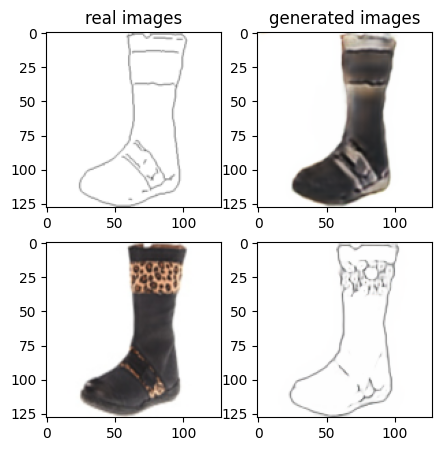

Train Epoch: 2 77% 	Total Loss: 1.246360 	Loss_G_AB: 0.304978	Loss_G_BA: 0.995265	Loss_cycle: 0.328679	Loss_D_A: 0.009984	Loss_D_B: 0.257575
1 88009 T:  2.044541835784912
Train Epoch: 2 77% 	Total Loss: 1.224568 	Loss_G_AB: 0.282623	Loss_G_BA: 0.905170	Loss_cycle: 0.300552	Loss_D_A: 0.074890	Loss_D_B: 0.255229
1 88019 T:  0.9692716598510742
Train Epoch: 2 77% 	Total Loss: 1.338842 	Loss_G_AB: 0.304088	Loss_G_BA: 0.935532	Loss_cycle: 0.430584	Loss_D_A: 0.037924	Loss_D_B: 0.250523
1 88029 T:  0.980412483215332
Train Epoch: 2 77% 	Total Loss: 1.290828 	Loss_G_AB: 0.286296	Loss_G_BA: 0.931993	Loss_cycle: 0.423503	Loss_D_A: 0.018459	Loss_D_B: 0.239722
1 88039 T:  1.0145459175109863
Train Epoch: 2 77% 	Total Loss: 1.349622 	Loss_G_AB: 0.299508	Loss_G_BA: 0.980123	Loss_cycle: 0.370326	Loss_D_A: 0.100822	Loss_D_B: 0.238658
1 88049 T:  1.0922520160675049
Train Epoch: 2 77% 	Total Loss: 1.190752 	Loss_G_AB: 0.318011	Loss_G_BA: 0.967246	Loss_cycle: 0.282455	Loss_D_A: 0.027124	Loss_D_B: 0.238545
1

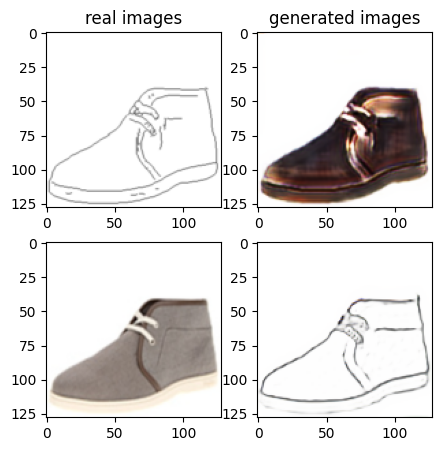

Train Epoch: 2 79% 	Total Loss: 1.252613 	Loss_G_AB: 0.312119	Loss_G_BA: 1.028494	Loss_cycle: 0.337280	Loss_D_A: 0.002511	Loss_D_B: 0.242515
1 89009 T:  2.046168804168701
Train Epoch: 2 79% 	Total Loss: 1.218405 	Loss_G_AB: 0.315905	Loss_G_BA: 0.999391	Loss_cycle: 0.336404	Loss_D_A: 0.004482	Loss_D_B: 0.219872
1 89019 T:  0.9750280380249023
Train Epoch: 2 79% 	Total Loss: 1.213459 	Loss_G_AB: 0.286476	Loss_G_BA: 1.007026	Loss_cycle: 0.301928	Loss_D_A: 0.001999	Loss_D_B: 0.262781
1 89029 T:  1.014894723892212
Train Epoch: 2 79% 	Total Loss: 1.262965 	Loss_G_AB: 0.291413	Loss_G_BA: 0.980250	Loss_cycle: 0.345976	Loss_D_A: 0.002604	Loss_D_B: 0.278553
1 89039 T:  1.0182416439056396
Train Epoch: 2 79% 	Total Loss: 1.212638 	Loss_G_AB: 0.284572	Loss_G_BA: 1.002444	Loss_cycle: 0.320604	Loss_D_A: 0.008033	Loss_D_B: 0.240493
1 89049 T:  1.0610108375549316
Train Epoch: 2 79% 	Total Loss: 1.274182 	Loss_G_AB: 0.288852	Loss_G_BA: 0.984601	Loss_cycle: 0.388209	Loss_D_A: 0.001335	Loss_D_B: 0.247911
1

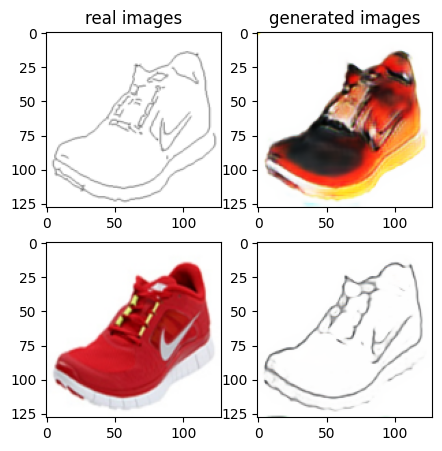

Train Epoch: 2 81% 	Total Loss: 1.269458 	Loss_G_AB: 0.309370	Loss_G_BA: 1.015186	Loss_cycle: 0.392357	Loss_D_A: 0.002027	Loss_D_B: 0.212796
1 90009 T:  2.030496835708618
Train Epoch: 2 81% 	Total Loss: 1.211223 	Loss_G_AB: 0.291204	Loss_G_BA: 0.993174	Loss_cycle: 0.314151	Loss_D_A: 0.002268	Loss_D_B: 0.252614
1 90019 T:  0.9922864437103271
Train Epoch: 2 81% 	Total Loss: 1.217100 	Loss_G_AB: 0.280939	Loss_G_BA: 1.000041	Loss_cycle: 0.329583	Loss_D_A: 0.002772	Loss_D_B: 0.244255
1 90029 T:  0.9881846904754639
Train Epoch: 2 81% 	Total Loss: 1.296051 	Loss_G_AB: 0.277899	Loss_G_BA: 1.002155	Loss_cycle: 0.368450	Loss_D_A: 0.001772	Loss_D_B: 0.285803
1 90039 T:  1.0310697555541992
Train Epoch: 2 81% 	Total Loss: 1.248280 	Loss_G_AB: 0.298221	Loss_G_BA: 1.000040	Loss_cycle: 0.343025	Loss_D_A: 0.001481	Loss_D_B: 0.254643
1 90049 T:  1.082352876663208
Train Epoch: 2 81% 	Total Loss: 1.239376 	Loss_G_AB: 0.296329	Loss_G_BA: 0.985118	Loss_cycle: 0.372573	Loss_D_A: 0.002525	Loss_D_B: 0.223555
1

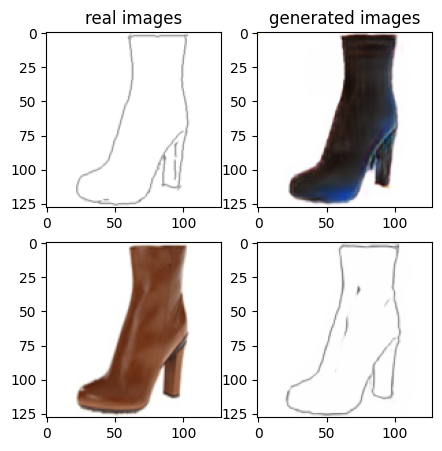

Train Epoch: 2 83% 	Total Loss: 1.259196 	Loss_G_AB: 0.304250	Loss_G_BA: 0.999950	Loss_cycle: 0.358289	Loss_D_A: 0.001083	Loss_D_B: 0.247723
1 91009 T:  2.4173552989959717
Train Epoch: 2 83% 	Total Loss: 1.293513 	Loss_G_AB: 0.337112	Loss_G_BA: 0.994358	Loss_cycle: 0.366821	Loss_D_A: 0.001021	Loss_D_B: 0.259936
1 91019 T:  1.0135796070098877
Train Epoch: 2 83% 	Total Loss: 1.189949 	Loss_G_AB: 0.331461	Loss_G_BA: 1.000786	Loss_cycle: 0.296964	Loss_D_A: 0.001613	Loss_D_B: 0.225247
1 91029 T:  1.0528974533081055
Train Epoch: 2 83% 	Total Loss: 1.203213 	Loss_G_AB: 0.303265	Loss_G_BA: 0.999223	Loss_cycle: 0.312547	Loss_D_A: 0.001907	Loss_D_B: 0.237514
1 91039 T:  1.052729845046997
Train Epoch: 2 83% 	Total Loss: 1.168291 	Loss_G_AB: 0.308471	Loss_G_BA: 1.006033	Loss_cycle: 0.250214	Loss_D_A: 0.001054	Loss_D_B: 0.259771
1 91049 T:  0.979736328125
Train Epoch: 2 83% 	Total Loss: 1.291662 	Loss_G_AB: 0.301859	Loss_G_BA: 0.995070	Loss_cycle: 0.396476	Loss_D_A: 0.002044	Loss_D_B: 0.244677
1 91

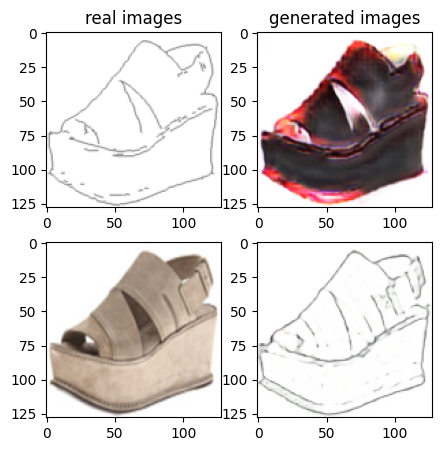

Train Epoch: 2 85% 	Total Loss: 1.247102 	Loss_G_AB: 0.358760	Loss_G_BA: 1.002759	Loss_cycle: 0.331275	Loss_D_A: 0.003971	Loss_D_B: 0.231096
1 92009 T:  2.6970620155334473
Train Epoch: 2 85% 	Total Loss: 1.265478 	Loss_G_AB: 0.329644	Loss_G_BA: 0.991561	Loss_cycle: 0.383381	Loss_D_A: 0.002100	Loss_D_B: 0.219394
1 92019 T:  1.0061273574829102
Train Epoch: 2 85% 	Total Loss: 1.197108 	Loss_G_AB: 0.284524	Loss_G_BA: 0.997239	Loss_cycle: 0.312917	Loss_D_A: 0.002999	Loss_D_B: 0.240310
1 92029 T:  0.9800982475280762
Train Epoch: 2 85% 	Total Loss: 1.272164 	Loss_G_AB: 0.329100	Loss_G_BA: 0.979755	Loss_cycle: 0.371638	Loss_D_A: 0.002231	Loss_D_B: 0.243869
1 92039 T:  0.9743964672088623
Train Epoch: 2 85% 	Total Loss: 1.261749 	Loss_G_AB: 0.404540	Loss_G_BA: 1.015579	Loss_cycle: 0.292628	Loss_D_A: 0.002473	Loss_D_B: 0.256589
1 92049 T:  0.9756865501403809
Train Epoch: 2 85% 	Total Loss: 1.194068 	Loss_G_AB: 0.334446	Loss_G_BA: 0.971655	Loss_cycle: 0.321794	Loss_D_A: 0.002247	Loss_D_B: 0.216977

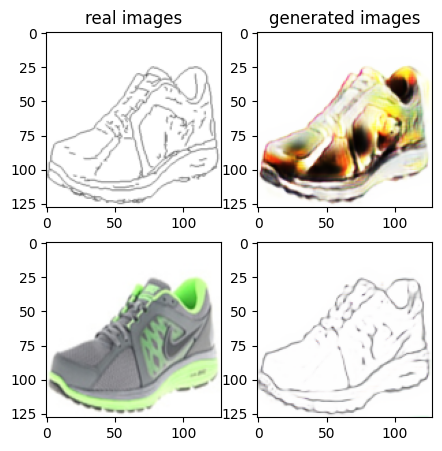

Train Epoch: 2 87% 	Total Loss: 1.296259 	Loss_G_AB: 0.415626	Loss_G_BA: 0.946312	Loss_cycle: 0.409596	Loss_D_A: 0.010628	Loss_D_B: 0.195066
1 93009 T:  2.3178775310516357
Train Epoch: 2 87% 	Total Loss: 1.250538 	Loss_G_AB: 0.264464	Loss_G_BA: 0.990719	Loss_cycle: 0.349514	Loss_D_A: 0.004708	Loss_D_B: 0.268724
1 93019 T:  0.9761791229248047
Train Epoch: 2 87% 	Total Loss: 1.265737 	Loss_G_AB: 0.432353	Loss_G_BA: 0.967708	Loss_cycle: 0.372082	Loss_D_A: 0.022542	Loss_D_B: 0.171082
1 93029 T:  0.9813096523284912
Train Epoch: 2 87% 	Total Loss: 1.441259 	Loss_G_AB: 0.412731	Loss_G_BA: 0.991316	Loss_cycle: 0.434985	Loss_D_A: 0.006337	Loss_D_B: 0.297913
1 93039 T:  0.9687440395355225
Train Epoch: 2 87% 	Total Loss: 1.338315 	Loss_G_AB: 0.373923	Loss_G_BA: 1.016776	Loss_cycle: 0.353820	Loss_D_A: 0.004318	Loss_D_B: 0.284828
1 93049 T:  0.9868102073669434
Train Epoch: 2 87% 	Total Loss: 1.259835 	Loss_G_AB: 0.389507	Loss_G_BA: 1.002107	Loss_cycle: 0.363217	Loss_D_A: 0.001907	Loss_D_B: 0.198904

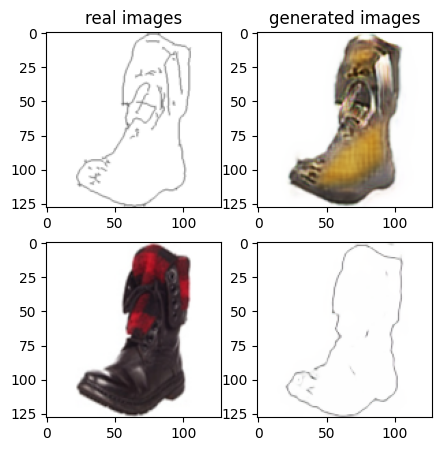

Train Epoch: 2 89% 	Total Loss: 1.127732 	Loss_G_AB: 0.296116	Loss_G_BA: 0.836053	Loss_cycle: 0.301476	Loss_D_A: 0.039620	Loss_D_B: 0.220551
1 94009 T:  2.0991499423980713
Train Epoch: 2 89% 	Total Loss: 1.295176 	Loss_G_AB: 0.320642	Loss_G_BA: 0.921662	Loss_cycle: 0.384235	Loss_D_A: 0.025024	Loss_D_B: 0.264765
1 94019 T:  0.98171067237854
Train Epoch: 2 89% 	Total Loss: 1.274176 	Loss_G_AB: 0.264213	Loss_G_BA: 0.880171	Loss_cycle: 0.379775	Loss_D_A: 0.071294	Loss_D_B: 0.250915
1 94029 T:  0.9782030582427979
Train Epoch: 2 89% 	Total Loss: 1.254269 	Loss_G_AB: 0.301616	Loss_G_BA: 0.856646	Loss_cycle: 0.333808	Loss_D_A: 0.084682	Loss_D_B: 0.256647
1 94039 T:  0.9765193462371826
Train Epoch: 2 89% 	Total Loss: 1.284773 	Loss_G_AB: 0.364321	Loss_G_BA: 0.966349	Loss_cycle: 0.376556	Loss_D_A: 0.042890	Loss_D_B: 0.199992
1 94049 T:  1.0086100101470947
Train Epoch: 2 89% 	Total Loss: 1.241592 	Loss_G_AB: 0.285542	Loss_G_BA: 0.947890	Loss_cycle: 0.353521	Loss_D_A: 0.015393	Loss_D_B: 0.255962
1

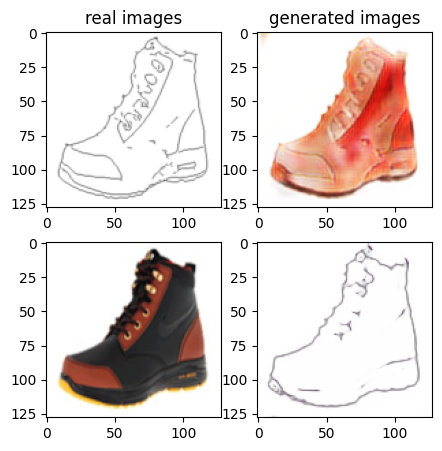

Train Epoch: 2 91% 	Total Loss: 1.297065 	Loss_G_AB: 0.343945	Loss_G_BA: 1.024053	Loss_cycle: 0.370902	Loss_D_A: 0.005034	Loss_D_B: 0.237130
1 95009 T:  2.0915932655334473
Train Epoch: 2 91% 	Total Loss: 1.334976 	Loss_G_AB: 0.382585	Loss_G_BA: 0.989844	Loss_cycle: 0.434504	Loss_D_A: 0.003549	Loss_D_B: 0.210709
1 95019 T:  0.9875719547271729
Train Epoch: 2 91% 	Total Loss: 1.352786 	Loss_G_AB: 0.295653	Loss_G_BA: 0.984400	Loss_cycle: 0.424524	Loss_D_A: 0.002983	Loss_D_B: 0.285252
1 95029 T:  0.9815740585327148
Train Epoch: 2 91% 	Total Loss: 1.340203 	Loss_G_AB: 0.297238	Loss_G_BA: 1.003022	Loss_cycle: 0.445939	Loss_D_A: 0.004591	Loss_D_B: 0.239544
1 95039 T:  0.983142614364624
Train Epoch: 2 91% 	Total Loss: 1.180897 	Loss_G_AB: 0.292434	Loss_G_BA: 1.012331	Loss_cycle: 0.276633	Loss_D_A: 0.003086	Loss_D_B: 0.248795
1 95049 T:  0.9967019557952881
Train Epoch: 2 91% 	Total Loss: 1.210072 	Loss_G_AB: 0.277931	Loss_G_BA: 1.006699	Loss_cycle: 0.322417	Loss_D_A: 0.004614	Loss_D_B: 0.240726


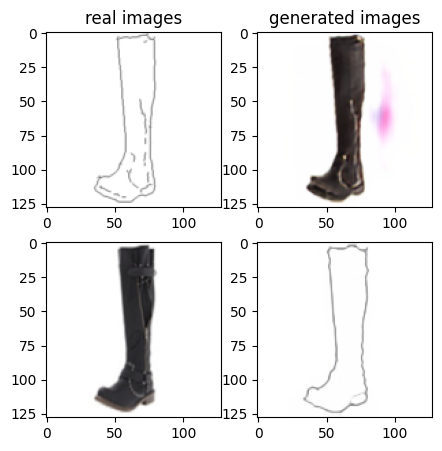

Train Epoch: 2 93% 	Total Loss: 1.309862 	Loss_G_AB: 0.344430	Loss_G_BA: 0.983231	Loss_cycle: 0.400417	Loss_D_A: 0.001767	Loss_D_B: 0.243848
1 96009 T:  1.9976131916046143
Train Epoch: 2 93% 	Total Loss: 1.245778 	Loss_G_AB: 0.285006	Loss_G_BA: 1.022251	Loss_cycle: 0.354993	Loss_D_A: 0.001500	Loss_D_B: 0.235657
1 96019 T:  0.9772720336914062
Train Epoch: 2 93% 	Total Loss: 1.186144 	Loss_G_AB: 0.300579	Loss_G_BA: 0.981775	Loss_cycle: 0.312687	Loss_D_A: 0.003091	Loss_D_B: 0.229189
1 96029 T:  0.9765129089355469
Train Epoch: 2 93% 	Total Loss: 1.193405 	Loss_G_AB: 0.302303	Loss_G_BA: 1.009400	Loss_cycle: 0.314156	Loss_D_A: 0.001727	Loss_D_B: 0.221670
1 96039 T:  0.9792749881744385
Train Epoch: 2 93% 	Total Loss: 1.325509 	Loss_G_AB: 0.348039	Loss_G_BA: 0.981894	Loss_cycle: 0.443814	Loss_D_A: 0.002895	Loss_D_B: 0.213833
1 96049 T:  0.9986553192138672
Train Epoch: 2 93% 	Total Loss: 1.250594 	Loss_G_AB: 0.309499	Loss_G_BA: 1.006681	Loss_cycle: 0.329004	Loss_D_A: 0.002620	Loss_D_B: 0.260880

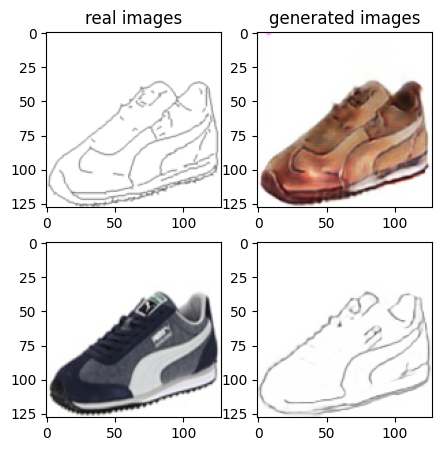

Train Epoch: 2 95% 	Total Loss: 1.274571 	Loss_G_AB: 0.371559	Loss_G_BA: 0.979140	Loss_cycle: 0.421487	Loss_D_A: 0.002168	Loss_D_B: 0.175566
1 97009 T:  2.0589821338653564
Train Epoch: 2 95% 	Total Loss: 1.164503 	Loss_G_AB: 0.287082	Loss_G_BA: 1.004327	Loss_cycle: 0.244054	Loss_D_A: 0.006596	Loss_D_B: 0.268149
1 97019 T:  0.9774308204650879
Train Epoch: 2 95% 	Total Loss: 1.269991 	Loss_G_AB: 0.287252	Loss_G_BA: 1.005358	Loss_cycle: 0.365918	Loss_D_A: 0.001967	Loss_D_B: 0.255801
1 97029 T:  0.97890305519104
Train Epoch: 2 95% 	Total Loss: 1.220713 	Loss_G_AB: 0.307322	Loss_G_BA: 0.986578	Loss_cycle: 0.317336	Loss_D_A: 0.006097	Loss_D_B: 0.250330
1 97039 T:  0.9712140560150146
Train Epoch: 2 95% 	Total Loss: 1.168760 	Loss_G_AB: 0.355126	Loss_G_BA: 1.010400	Loss_cycle: 0.262029	Loss_D_A: 0.005831	Loss_D_B: 0.218137
1 97049 T:  0.9806790351867676
Train Epoch: 2 95% 	Total Loss: 1.273462 	Loss_G_AB: 0.314469	Loss_G_BA: 0.991535	Loss_cycle: 0.384770	Loss_D_A: 0.004420	Loss_D_B: 0.231269
1

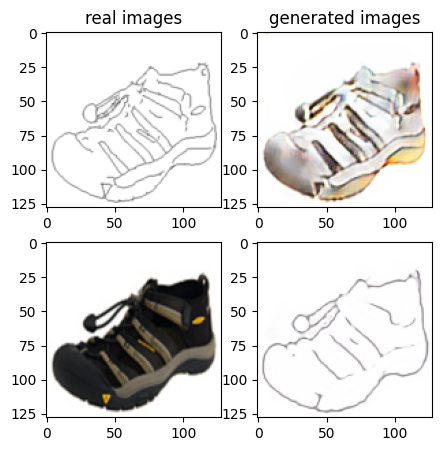

Train Epoch: 2 97% 	Total Loss: 1.263786 	Loss_G_AB: 0.378880	Loss_G_BA: 1.003661	Loss_cycle: 0.364498	Loss_D_A: 0.003569	Loss_D_B: 0.204448
1 98009 T:  2.203096389770508
Train Epoch: 2 97% 	Total Loss: 1.202987 	Loss_G_AB: 0.335926	Loss_G_BA: 0.996718	Loss_cycle: 0.309295	Loss_D_A: 0.003591	Loss_D_B: 0.223779
1 98019 T:  0.9786455631256104
Train Epoch: 2 97% 	Total Loss: 1.217331 	Loss_G_AB: 0.288698	Loss_G_BA: 1.003204	Loss_cycle: 0.298240	Loss_D_A: 0.002312	Loss_D_B: 0.270827
1 98029 T:  0.9799020290374756
Train Epoch: 2 97% 	Total Loss: 1.181548 	Loss_G_AB: 0.437591	Loss_G_BA: 0.999603	Loss_cycle: 0.284993	Loss_D_A: 0.002255	Loss_D_B: 0.175702
1 98039 T:  1.0105509757995605
Train Epoch: 2 97% 	Total Loss: 1.384312 	Loss_G_AB: 0.307579	Loss_G_BA: 0.983716	Loss_cycle: 0.447730	Loss_D_A: 0.003524	Loss_D_B: 0.287409
1 98049 T:  1.015368938446045
Train Epoch: 2 97% 	Total Loss: 1.184086 	Loss_G_AB: 0.303320	Loss_G_BA: 1.001203	Loss_cycle: 0.300490	Loss_D_A: 0.002693	Loss_D_B: 0.228641
1

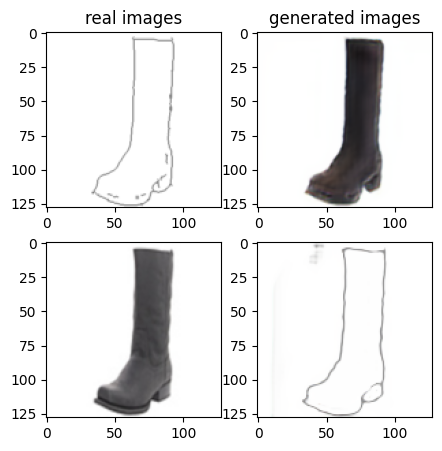

Train Epoch: 2 99% 	Total Loss: 1.309073 	Loss_G_AB: 0.390979	Loss_G_BA: 1.003019	Loss_cycle: 0.390001	Loss_D_A: 0.002972	Loss_D_B: 0.219102
1 99009 T:  1.9805598258972168
Train Epoch: 2 99% 	Total Loss: 1.243142 	Loss_G_AB: 0.333828	Loss_G_BA: 0.976240	Loss_cycle: 0.330740	Loss_D_A: 0.007942	Loss_D_B: 0.249426
1 99019 T:  0.9778006076812744
Train Epoch: 2 99% 	Total Loss: 1.214739 	Loss_G_AB: 0.322450	Loss_G_BA: 0.992578	Loss_cycle: 0.333217	Loss_D_A: 0.002791	Loss_D_B: 0.221217
1 99029 T:  0.9892442226409912
Train Epoch: 2 99% 	Total Loss: 1.270569 	Loss_G_AB: 0.424259	Loss_G_BA: 1.013376	Loss_cycle: 0.356329	Loss_D_A: 0.001600	Loss_D_B: 0.193822
1 99039 T:  1.022289752960205
Train Epoch: 2 99% 	Total Loss: 1.192662 	Loss_G_AB: 0.268034	Loss_G_BA: 0.991194	Loss_cycle: 0.279144	Loss_D_A: 0.001682	Loss_D_B: 0.282222
1 99049 T:  1.1344504356384277
Train Epoch: 2 99% 	Total Loss: 1.254261 	Loss_G_AB: 0.338964	Loss_G_BA: 0.995095	Loss_cycle: 0.343558	Loss_D_A: 0.001388	Loss_D_B: 0.242285


In [ ]:
import warnings
warnings.filterwarnings("ignore")
from torch.autograd import Variable
from torch.utils import data
from torch.utils.data import DataLoader, TensorDataset
from torch import nn, optim
from datasets import *
from models import *
import argparse, os
import itertools
import torch
import time
import pdb
import matplotlib.pyplot as plt


# Training Configurations
# (You may put your needed configuration here. Please feel free to add more or use argparse. )
train_img_dir = '/content/edges2shoes/train/'
img_shape = (3, 128, 128)
n_residual_blocks = 6
num_epochs = 2
batch_size = 1
lr_rate = 0.0002      # Adam optimizer learning rate
betas = (0.5, 0.999)  # Adam optimizer beta 1, beta 2
lambda_cyc = 10.0 	  # cycle loss weight
latent_dim = 8        # latent dimension for the encoded images from domain B
report_feq = 10        # Visualize image every 'report_feq' iters
visual_feq = 1000
save_feq = 1000      # Save models every 'save_feq' iters

# Random seeds (optional)
torch.manual_seed(1); np.random.seed(1)

# set device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Normalize image tensor
def norm(image):
    return (image/255.0-0.5)*2.0

# Denormalize image tensor
def denorm(tensor):
    return ((tensor+1.0)/2.0)*255.0

train_dataset = Edge2Shoe(train_img_dir)
train_loader = data.DataLoader(train_dataset, batch_size=batch_size)
print('the length of training data:', len(train_dataset))
# Losses
criterion_GAN = torch.nn.MSELoss()
criterion_cycle = torch.nn.L1Loss()

cuda = torch.cuda.is_available()

input_shape = img_shape

# Initialize generator and discriminator
G_AB = GeneratorResNet(input_shape, n_residual_blocks)
G_BA = GeneratorResNet(input_shape, n_residual_blocks)
D_A = Discriminator(input_shape)
D_B = Discriminator(input_shape)


if cuda:
    G_AB = G_AB.to(device)
    G_BA = G_BA.to(device)
    D_A = D_A.to(device)
    D_B = D_B.to(device)
    criterion_GAN.to(device)
    criterion_cycle.to(device)

# Initialize weights
G_AB.apply(weights_init_normal)
G_BA.apply(weights_init_normal)
D_A.apply(weights_init_normal)
D_B.apply(weights_init_normal)



# Define optimizer
optimizer_G = torch.optim.Adam(itertools.chain(G_AB.parameters(), G_BA.parameters()), lr=lr_rate, betas=betas)
optimizer_D_A = torch.optim.Adam(D_A.parameters(), lr=lr_rate, betas=betas)
optimizer_D_B = torch.optim.Adam(D_B.parameters(), lr=lr_rate, betas=betas)

# For adversarial loss
Tensor = torch.cuda.FloatTensor if cuda else torch.Tensor

# loss recorder
running_loss_D_A = 0
running_loss_D_B = 0
running_loss_GAN_AB = 0
running_loss_GAN_BA = 0
running_loss_cycle = 0
running_total_loss = 0

loss_D_A = []
loss_D_B = []
loss_GAN_AB = []
loss_GAN_BA = []
loss_cycle = []
total_loss = []

loss_D_A_list = []
loss_D_B_list = []
loss_GAN_AB_list = []
loss_GAN_BA_list = []
loss_cycle_list = []

itr = 0
# Training
total_steps = len(train_loader)*num_epochs; step = 0
for e in range(num_epochs):
    start = time.time()
    for idx, data in enumerate(train_loader):
        ########## Process Inputs ##########
        edge_tensor, rgb_tensor = data
        edge_tensor, rgb_tensor = norm(edge_tensor).to(device), norm(rgb_tensor).to(device)
        real_A = edge_tensor; real_B = rgb_tensor;

        # Adversarial ground truths
        valid = Variable(Tensor(np.ones((real_A.size(0), *D_A.output_shape))), requires_grad=False)
        fake = Variable(Tensor(np.zeros((real_A.size(0), *D_A.output_shape))), requires_grad=False)

        # ------------------
        #  Train Generators
        # ------------------
        G_AB.train(); G_BA.train()
        optimizer_G.zero_grad()

        # Generator loss
        loss_GAN_AB, fake_B = loss_generator(G_AB, real_A, D_B, valid, criterion_GAN)
        loss_GAN_BA, fake_A = loss_generator(G_BA, real_B, D_A, valid, criterion_GAN)
        loss_GAN = (loss_GAN_AB + loss_GAN_BA) / 2

        # Cycle loss
        loss_cycle_A = loss_cycle_consis(G_BA, fake_B, real_A, criterion_cycle)
        loss_cycle_B = loss_cycle_consis(G_AB, fake_A, real_B, criterion_cycle)
        loss_cycle = (loss_cycle_A + loss_cycle_B) / 2

        # Total loss
        loss_G = loss_GAN + lambda_cyc * loss_cycle

        loss_G.backward()
        optimizer_G.step()


        # -----------------------
        #  Train Discriminator A
        # -----------------------

        optimizer_D_A.zero_grad()

        # function to compute loss_D_A
        loss_D_A = loss_discriminator(fake_A, D_A, real_A, valid, fake, criterion_GAN)
        loss_D_A = loss_D_A / 2
        # update the D_A network
        loss_D_A.backward()
        optimizer_D_A.step()


        # -----------------------
        #  Train Discriminator B
        # -----------------------
        optimizer_D_B.zero_grad()

        # function to compute loss_D_A
        loss_D_B = loss_discriminator(fake_B, D_B, real_B, valid, fake, criterion_GAN)
        loss_D_B = loss_D_B / 2
        # update the D_B network
        loss_D_B.backward()
        optimizer_D_B.step()

        running_total_loss += (loss_GAN + lambda_cyc * loss_cycle + loss_D_A + loss_D_B).item()

        running_loss_GAN_AB += loss_GAN_AB.item()
        running_loss_GAN_BA += loss_GAN_BA.item()
        running_loss_D_A += loss_D_A.item()
        running_loss_D_B += loss_D_B.item()
        running_loss_cycle += lambda_cyc * loss_cycle.item()
        ########## Visualization ##########
        if step % report_feq == report_feq-1:
            print('Train Epoch: {} {:.0f}% \tTotal Loss: {:.6f} \tLoss_G_AB: {:.6f}\tLoss_G_BA: {:.6f}\tLoss_cycle: {:.6f}\tLoss_D_A: {:.6f}\tLoss_D_B: {:.6f}'.format
                    (e+1, 100. * idx / len(train_loader), running_total_loss / report_feq,
                    running_loss_GAN_AB/report_feq, running_loss_GAN_BA/report_feq,
                    running_loss_cycle/report_feq, running_loss_D_A/report_feq,
                    running_loss_D_B/report_feq))
            loss_D_A_list.append(running_loss_D_A)
            loss_D_B_list.append(running_loss_D_B)
            loss_GAN_AB_list.append(running_loss_GAN_AB)
            loss_GAN_BA_list.append(running_loss_GAN_BA)
            loss_cycle_list.append(running_loss_cycle)

            running_loss_D_A = 0
            running_loss_D_B = 0
            running_loss_GAN_AB = 0
            running_loss_GAN_BA = 0
            running_loss_cycle = 0
            running_total_loss = 0
            end = time.time()
            print(e, step, 'T: ', end-start)
            start = end
        ########## Visualize Generated images ##########
        if step % visual_feq == 0:
            vis_fake_A = denorm(fake_A[0].detach()).cpu().data.numpy().astype(np.uint8)
            vis_fake_B = denorm(fake_B[0].detach()).cpu().data.numpy().astype(np.uint8)
            vis_real_B = denorm(real_B[0].detach()).cpu().data.numpy().astype(np.uint8)
            vis_real_A = denorm(real_A[0].detach()).cpu().data.numpy().astype(np.uint8)
            fig, axs = plt.subplots(2,2, figsize = (5,5))

            axs[0,0].imshow(vis_real_A.transpose(1,2,0))
            axs[0,0].set_title('real images')
            axs[0,1].imshow(vis_fake_B.transpose(1,2,0))
            axs[0,1].set_title('generated images')
            axs[1,0].imshow(vis_real_B.transpose(1,2,0))
            axs[1,1].imshow(vis_fake_A.transpose(1,2,0))
            plt.show()
        ########## Save Generators ##########
        if step % save_feq == save_feq-1:
            torch.save(G_AB, 'checkpoints/CycleGAN/G_AB.pt')
            torch.save(G_BA, 'checkpoints/CycleGAN/G_BA.pt')

            checkpoint = {"loss_D_A" : loss_D_A_list,
                          "loss_D_B" : loss_D_B_list,
                          "loss_GAN_AB" : loss_GAN_AB_list,
                          "loss_GAN_BA":loss_GAN_BA_list,
                          "loss_cycle":loss_cycle_list,
                          "G_AB" : G_AB.state_dict(),
                          "G_BA" : G_BA.state_dict(),
                          "D_A"  : D_A.state_dict(),
                          "D_B"  : D_B.state_dict()}
            torch.save(checkpoint, 'checkpoints/CycleGAN/cycle_gan' + str(itr) + '.pt')
            itr += 1

        step += 1

MODEl TUNING: We essentially didn't require any tuning. After seeing the results of the models while model being trained above - we could see the model the improve. The outputs at end of the 2nd epoch were satisfactory.

Although, we can see that the GAN losses are spiky. After seeing that I increased the batch size from 1 to 4 & 8. I found that the losses were more stable for a few hundred iterations. However, I went ahead with batch size 1 due to computation time & GPU limitations.

# CycleGAN testing

In [ ]:
import warnings
warnings.filterwarnings("ignore")
from torch.autograd import Variable
from torch.utils import data
from torch.utils.data import DataLoader, TensorDataset
from torch import nn, optim
from datasets import *
from models import *
import argparse, os
import numpy as np
import itertools
import torch
import time
import pdb
import matplotlib.pyplot as plt

In [ ]:
from torch.utils.data import DataLoader, TensorDataset
test_batch_size = 1
test_img_dir = '/content/edges2shoes/val/'
test_dataset = Edge2Shoe(test_img_dir)
test_loader = DataLoader(test_dataset, batch_size=test_batch_size)

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
G_AB = torch.load('checkpoints/CycleGAN/G_AB.pt')
G_BA = torch.load('checkpoints/CycleGAN/G_BA.pt')
cuda = torch.cuda.is_available()
if cuda:
    G_AB = G_AB.to(device)
    G_BA = G_BA.to(device)

In [ ]:
# Denormalize image tensor
def denorm(tensor):
    return ((tensor+1.0)/2.0)*255.0

# Normalize image tensor
def norm(image):
    return (image/255.0-0.5)*2.0

In [ ]:
def visualize_results(test_loader, G_AB, G_BA, device, norm, denorm, output_folder='cyclegan_save_files', num_samples=10):
    G_AB.eval()
    G_BA.eval()

    for i, data in enumerate(test_loader):
        real_A, real_B = map(lambda x: norm(x).to(device), data)
        fake_B, fake_A = G_AB(real_A), G_BA(real_B)

        images = [denorm(img[0].detach()).cpu().data.numpy().astype(np.uint8) for img in [real_A, fake_B, real_B, fake_A]]

        fig, axs = plt.subplots(2, 2, figsize=(5, 5))
        titles = ['real images', 'generated images', 'real images', 'generated images']

        for ax, img, title in zip(axs.flatten(), images, titles):
            ax.imshow(img.transpose(1, 2, 0))
            ax.set_title(title)

        plt.savefig('cyclegan_save_files/CycleGAN_{}.png'.format(i))
        plt.show()

        if i == num_samples - 1:
            break

# Example usage:
visualize_results(test_loader, G_AB, G_BA, device, norm, denorm, output_folder='cyclegan_save_files', num_samples=20)

Output hidden; open in https://colab.research.google.com to view.

# Quantitative Evaluation

## FID Score computation

First, we have to create 6 datasets:
- Domain A real set 1
- Domain A real set 2
- Domain A generate set

- Domain B real set 1
- Domain B real set 2
- Domain B generate set



Create folder to save images and create dataset.

In [ ]:
! mkdir 'cyclegan_save_files/real_A_1' 'cyclegan_save_files/real_A_2' 'cyclegan_save_files/gen_A'
! mkdir 'cyclegan_save_files/real_B_1' 'cyclegan_save_files/real_B_2' 'cyclegan_save_files/gen_B'

In [ ]:
# First create test data loader
from torch.utils.data import DataLoader, TensorDataset
from torchvision.utils import save_image
test_batch_size = 1
test_img_dir = '/content/edges2shoes/val/'
test_dataset = Edge2Shoe(test_img_dir)
test_loader = DataLoader(test_dataset, batch_size=test_batch_size)

# indicate the device we will use
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Load learnt Generator G_AB and G_BA
G_AB = torch.load('checkpoints/CycleGAN/G_AB.pt').to(device)
G_BA = torch.load('checkpoints/CycleGAN/G_BA.pt').to(device)

# the size of dataset, we want to evaluate on
evaluate_num = 100

# make the gen data set and folder
real_A_set_1 = []
real_A_set_2 = []
real_B_set_1 = []
real_B_set_2 = []

gen_set_A = []
gen_set_B = []

for idx, data in enumerate(test_loader, 0):
    real_A, real_B = data
    # plt.imshow(real_A.type(torch.uint8).squeeze(0).cpu().permute(1,2,0))
    # plt.show()
    real_A, real_B = norm(real_A).to(device), norm(real_B).to(device)
    # plt.imshow(denorm(real_A).type(torch.uint8).squeeze(0).cpu().permute(1,2,0))
    # plt.imshow(denorm(real_A).squeeze(0).cpu().permute(1,2,0))
    # plt.show()
    # print(real_A.shape)

    if idx < evaluate_num:
        fake_A = G_BA(real_B)
        fake_B = G_AB(real_A)
        real_A_set_1.append(denorm(real_A.detach()))
        real_B_set_1.append(denorm(real_B.detach()))
        gen_set_A.append(denorm(fake_A.detach()))
        gen_set_B.append(denorm(fake_B.detach()))

        # plt.imshow(data[0].type(torch.uint8).squeeze(0).permute(1,2,0))
        # plt.imshow(denorm(real_A).squeeze(0).cpu().permute(1,2,0))
        # plt.imshow(denorm(real_A).type(torch.uint8).squeeze(0).cpu().permute(1,2,0))
        # plt.show()
        plt.imsave('cyclegan_save_files/real_A_1/real_A' + str(idx) + '.png', denorm(real_A).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        plt.imsave('cyclegan_save_files/real_B_1/real_B' + str(idx) + '.png', denorm(real_B).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        plt.imsave('cyclegan_save_files/gen_A/gen_A' + str(idx) + '.png', denorm(fake_A).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        plt.imsave('cyclegan_save_files/gen_B/gen_B' + str(idx) + '.png', denorm(fake_B).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        # save_image(denorm(real_A).type(torch.uint8).squeeze(), './real_A_1/real_A' + str(idx) + '.png', normalize=False)

        # save_image(denorm(real_B).detach().squeeze(), './real_B_1/real_B' + str(idx) + '.png', normalize=False)
        # save_image(denorm(fake_A).detach().squeeze(), './gen_A/gen_A' + str(idx) + '.png', normalize=False)
        # save_image(denorm(fake_B).detach().squeeze(), './gen_B/gen_B' + str(idx) + '.png', normalize=False)
        # del real_A; del real_B; del fake_A; del fake_B

    elif evaluate_num <= idx < 2*evaluate_num:
        real_A_set_2.append(real_A.detach())
        real_B_set_2.append(real_B.detach())
        plt.imsave('cyclegan_save_files/real_A_2/real_A' + str(idx) + '.png', denorm(real_A).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        plt.imsave('cyclegan_save_files/real_B_2/real_B' + str(idx) + '.png', denorm(real_B).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        # save_image(denorm(real_A).detach().squeeze(), './real_A_2/real_A' + str(idx) + '.png', normalize=False)
        # save_image(denorm(real_B).detach().squeeze(), './real_B_2/real_B' + str(idx) + '.png', normalize=False)

    if idx == 2*evaluate_num-1:
        break
# make 6 pytorch dataset
real_A_dataset_1 = TensorDataset(torch.cat(real_A_set_1))
real_A_dataset_2 = TensorDataset(torch.cat(real_A_set_2))
real_B_dataset_1 = TensorDataset(torch.cat(real_B_set_1))
real_B_dataset_2 = TensorDataset(torch.cat(real_B_set_2))
gen_dataset_A = TensorDataset(torch.cat(gen_set_A))
gen_dataset_B = TensorDataset(torch.cat(gen_set_B))

## Compute FID score

In [ ]:
%%capture
! pip install pytorch-fid
! pip install scipy==1.11.1

In [ ]:
print('computing FID score between real_edge_1 and real_edge_2')
! python -m pytorch_fid 'cyclegan_save_files/real_A_1' 'cyclegan_save_files/real_A_2'

print('computing FID score between real_edge_1 and gen_edge')
! python -m pytorch_fid 'cyclegan_save_files/real_A_1' 'cyclegan_save_files/gen_A'

print('computing FID score between real_shoe_1 and real_shoe_2')
! python -m pytorch_fid 'cyclegan_save_files/real_B_1' 'cyclegan_save_files/real_B_2'

print('computing FID score between real_shoe_1 and gen_shoe')
! python -m pytorch_fid 'cyclegan_save_files/real_B_1' 'cyclegan_save_files/gen_B'

computing FID score between real_edge_1 and real_edge_2
Downloading: "https://github.com/mseitzer/pytorch-fid/releases/download/fid_weights/pt_inception-2015-12-05-6726825d.pth" to /root/.cache/torch/hub/checkpoints/pt_inception-2015-12-05-6726825d.pth
100% 91.2M/91.2M [00:00<00:00, 128MB/s]
100% 2/2 [00:01<00:00,  1.07it/s]
100% 2/2 [00:00<00:00,  2.14it/s]
FID:  51.34703154028675
computing FID score between real_edge_1 and gen_edge
100% 2/2 [00:00<00:00,  2.33it/s]
100% 2/2 [00:00<00:00,  2.99it/s]
FID:  91.87919330473832
computing FID score between real_shoe_1 and real_shoe_2
100% 2/2 [00:00<00:00,  2.15it/s]
100% 2/2 [00:00<00:00,  2.84it/s]
FID:  60.17372117907283
computing FID score between real_shoe_1 and gen_shoe
100% 2/2 [00:00<00:00,  2.27it/s]
100% 2/2 [00:00<00:00,  2.85it/s]
FID:  122.89104430352421


## Compute IS score

In [ ]:
from inception_score import inception_score
import warnings
warnings.filterwarnings("ignore")

print('IS score for real_edge_1 data set:')
print(inception_score(real_A_dataset_1, cuda=True, batch_size=64, resize=True, splits=1))
print('IS score for gen_edge data set:')
print(inception_score(gen_dataset_A, cuda=True, batch_size=64, resize=True, splits=1))


print('IS score for real_shoe_1:')
print(inception_score(real_B_dataset_1, cuda=True, batch_size=64, resize=True, splits=1))
print('IS score for gen_shoe data set:')
print(inception_score(gen_dataset_B, cuda=True, batch_size=64, resize=True, splits=1))

IS score for real_edge_1 data set:


Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-0cc3c7bd.pth
100%|██████████| 104M/104M [00:00<00:00, 163MB/s]


(1.0023557852329283, 0.0)
IS score for gen_edge data set:
(1.002710315585906, 0.0)
IS score for real_shoe_1:
(3.021818061178817, 0.0)
IS score for gen_shoe data set:
(1.9754602483976378, 0.0)


We have total 99649 iterations over 2 epochs. To reduce spikes in graph, we smooth the graph!

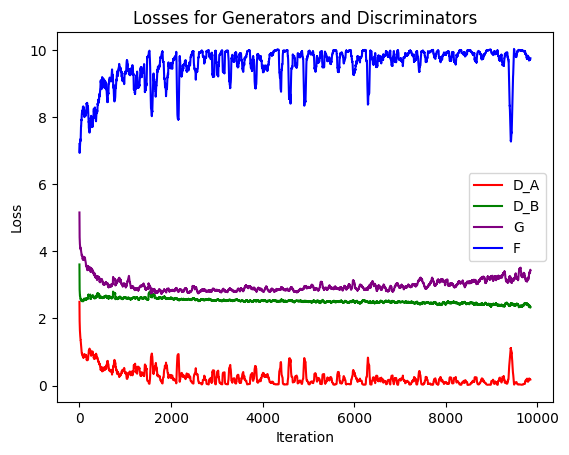

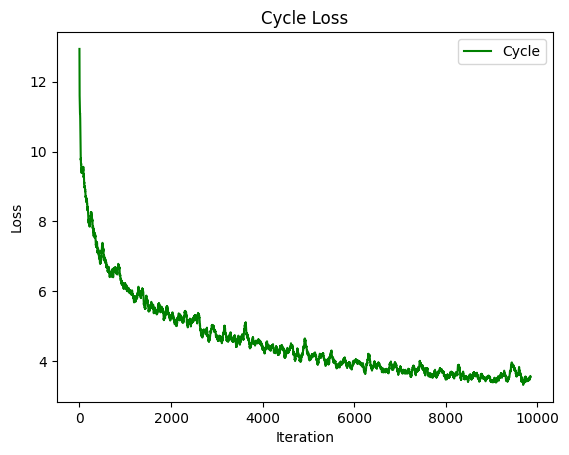

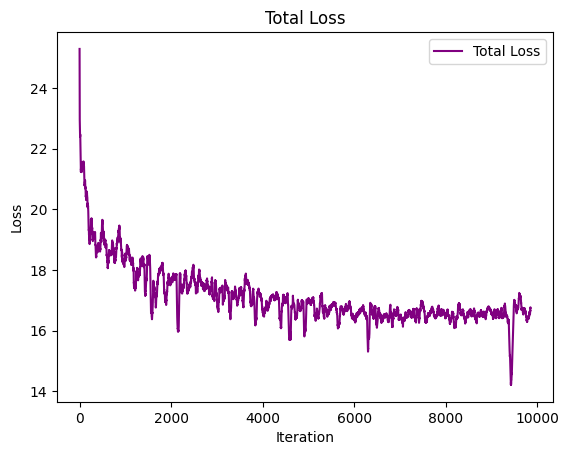

In [ ]:
def load_checkpoint(path):
    checkpoint = torch.load(path)
    return checkpoint

def smooth_data(data, window_size):
    smoothed_data = [sum(data[i:i + window_size]) / window_size for i in range(len(data) - window_size + 1)]
    return smoothed_data

def plot_loss(data, label, color, title, filename=None):
    plt.figure()
    plt.plot(data, label=label, color=color)
    plt.title(title)
    plt.xlabel('Iteration')
    plt.ylabel('Loss')
    plt.legend()
    if filename:
        plt.savefig(filename)
    plt.show()

checkpoint = load_checkpoint('checkpoints/CycleGAN/cycle_gan98.pt')
loss_D_A = checkpoint["loss_D_A"]
loss_D_B = checkpoint["loss_D_B"]
loss_GAN_AB = checkpoint["loss_GAN_AB"]
loss_GAN_BA = checkpoint["loss_GAN_BA"]
loss_cycle = checkpoint["loss_cycle"]

window_size = 50

# Smooth the data
loss_D_A_smoothed = smooth_data(loss_D_A, window_size)
loss_D_B_smoothed = smooth_data(loss_D_B, window_size)
loss_GAN_AB_smoothed = smooth_data(loss_GAN_AB, window_size)
loss_GAN_BA_smoothed = smooth_data(loss_GAN_BA, window_size)
loss_cycle_smoothed = smooth_data(loss_cycle, window_size)

# Plot losses for generators G and F, and discriminators DY and DX in the same figure
plt.figure()
plt.plot(loss_D_A_smoothed, label='D_A', color='red')
plt.plot(loss_D_B_smoothed, label='D_B', color='green')
plt.plot(loss_GAN_AB_smoothed, label='G', color='purple')
plt.plot(loss_GAN_BA_smoothed, label='F', color='blue')
plt.title('Losses for Generators and Discriminators')
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot cycle consistency loss in a separate figure
plot_loss(loss_cycle_smoothed, 'Cycle', 'green', 'Cycle Loss', None)

# Calculate and plot the total loss
total_loss = [loss_GAN_AB[i] + loss_GAN_BA[i] + loss_cycle[i] for i in range(len(loss_GAN_AB))]
plot_loss(smooth_data(total_loss, window_size), 'Total Loss', 'purple', 'Total Loss', None)